# Classification


In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_auc_score
import numpy as np

def plot_roc_and_confusion_matrix_binary(model, X, y, cv, model_name):
    """
    Plot ROC curve and confusion matrix for binary classification using cross-validation
    """
    # Get probability predictions and regular predictions using cross-validation
    y_proba = cross_val_predict(model, X, y, cv=cv, method='predict_proba')
    y_pred = cross_val_predict(model, X, y, cv=cv)

    # For binary classification, we only need probabilities for the positive class
    y_proba_pos = y_proba[:, 1]  # Probabilities for positive class

    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y, y_proba_pos)
    roc_auc = auc(fpr, tpr)

    # Calculate confusion matrix
    cm = confusion_matrix(y, y_pred)

    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # ROC Curve
    ax1 = axes[0]
    ax1.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.3f})')
    ax1.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--', label='Random Classifier')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate (1 - Specificity)')
    ax1.set_ylabel('True Positive Rate (Sensitivity)')
    ax1.set_title(f'ROC Curve - {model_name}')
    ax1.legend(loc="lower right")
    ax1.grid(True, alpha=0.3)

    # Confusion Matrix
    ax2 = axes[1]
    class_labels = ['Out Care', 'In Care']  # Adjust based on your actual class labels
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(ax=ax2, cmap='Blues', values_format='d')
    ax2.set_title(f'Confusion Matrix - {model_name}\n(5-Fold Cross-Validation)')

    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    tn, fp, fn, tp = cm.ravel()
    
    print(f"{model_name.upper()} PERFORMANCE SUMMARY")
    print("=" * 50)
    print(f"AUC Score: {roc_auc:.3f}")
    print(f"Accuracy: {(tp + tn) / (tp + tn + fp + fn):.3f}")
    print(f"Sensitivity (Recall): {tp / (tp + fn):.3f}")
    print(f"Specificity: {tn / (tn + fp):.3f}")
    print(f"Precision: {tp / (tp + fp):.3f}")
    print("\nConfusion Matrix:")
    print(f"True Negatives (Out Care):  {tn}")
    print(f"False Positives (Incorrect In Care): {fp}")
    print(f"False Negatives (Missed In Care): {fn}")
    print(f"True Positives (Correct In Care):  {tp}")
    print("-" * 50)
    
    return roc_auc, cm

# Define models to test with probability support
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'KNN (k=5)': KNeighborsClassifier(n_neighbors=5),
    'SVM (RBF)': SVC(kernel='rbf', C=0.1, random_state=42, probability=True)
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

print("ROC CURVES AND CONFUSION MATRICES FOR PATIENT CARE DATASET")
print("=" * 60)

# Plot for each model
all_auc_scores = {}
for model_name, model in models.items():
    auc_score, cm = plot_roc_and_confusion_matrix_binary(model, X_scaled, y, cv, model_name)
    all_auc_scores[model_name] = auc_score
    print()

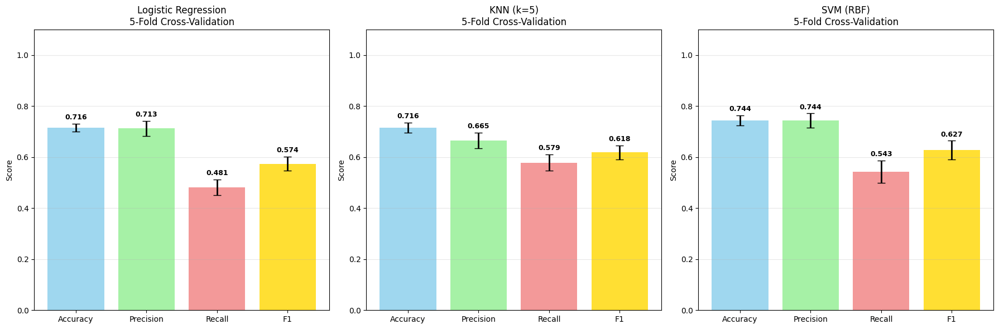

Classification Methods Cross-Validation Results Summary:
Method               Accuracy        Precision       Recall          F1-Score       
-------------------------------------------------------------------------------------
Logistic Regression  0.716±0.015     0.713±0.029     0.481±0.031     0.574±0.028    
KNN (k=5)            0.716±0.020     0.665±0.031     0.579±0.032     0.618±0.028    
SVM (RBF)            0.744±0.020     0.744±0.028     0.543±0.044     0.627±0.037    


In [ ]:
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import matplotlib.pyplot as plt

# Define scoring metrics for cross-validation (multi-class)
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score),#, average='weighted'),
    'recall': make_scorer(recall_score),#, average='weighted'),
    'f1': make_scorer(f1_score),#, average='weighted')
}

# Define models to test
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'KNN (k=5)': KNeighborsClassifier(n_neighbors=5),
    'SVM (RBF)': SVC(kernel='rbf', C=0.1, random_state=42)
}

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_results = {}

for i, (model_name, model) in enumerate(models.items()):
    # Perform 5-fold cross-validation with multiple metrics
    cv_results = cross_validate(model, X_scaled, y, cv=cv, scoring=scoring)
    
    # Calculate means and standard deviations
    metrics_summary = {}
    for metric in ['accuracy', 'precision', 'recall', 'f1']:
        scores = cv_results[f'test_{metric}']
        metrics_summary[metric] = {
            'mean': scores.mean(),
            'std': scores.std(),
            'scores': scores
        }
    
    all_results[model_name] = metrics_summary
    
    # Visualize metrics with error bars
    ax = axes[i]
    metrics_names = [metric.capitalize() for metric in metrics_summary.keys()]
    means = [results['mean'] for results in metrics_summary.values()]
    stds = [results['std'] for results in metrics_summary.values()]

    bars = ax.bar(metrics_names, means, yerr=stds, 
                  color=['skyblue', 'lightgreen', 'lightcoral', 'gold'], 
                  alpha=0.8, capsize=5, error_kw={'elinewidth': 2})

    # Add value labels on bars
    for bar, mean, std in zip(bars, means, stds):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.01, 
                f'{mean:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

    ax.set_ylabel('Score')
    ax.set_title(f'{model_name}\n5-Fold Cross-Validation')
    ax.set_ylim(0, 1.1)
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Print comprehensive comparison table
print("Classification Methods Cross-Validation Results Summary:")
print("=" * 85)
print(f"{'Method':<20} {'Accuracy':<15} {'Precision':<15} {'Recall':<15} {'F1-Score':<15}")
print("-" * 85)

for model_name, results in all_results.items():
    accuracy = f"{results['accuracy']['mean']:.3f}±{results['accuracy']['std']:.3f}"
    precision = f"{results['precision']['mean']:.3f}±{results['precision']['std']:.3f}"
    recall = f"{results['recall']['mean']:.3f}±{results['recall']['std']:.3f}"
    f1 = f"{results['f1']['mean']:.3f}±{results['f1']['std']:.3f}"
    
    print(f"{model_name:<20} {accuracy:<15} {precision:<15} {recall:<15} {f1:<15}")

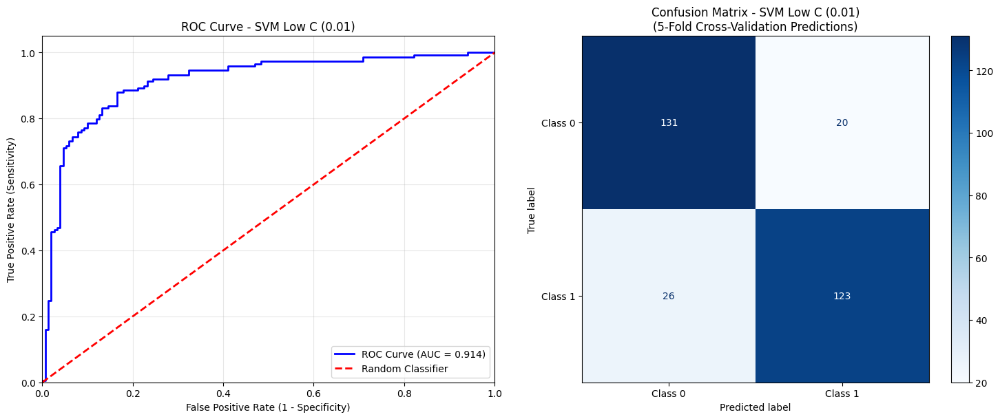

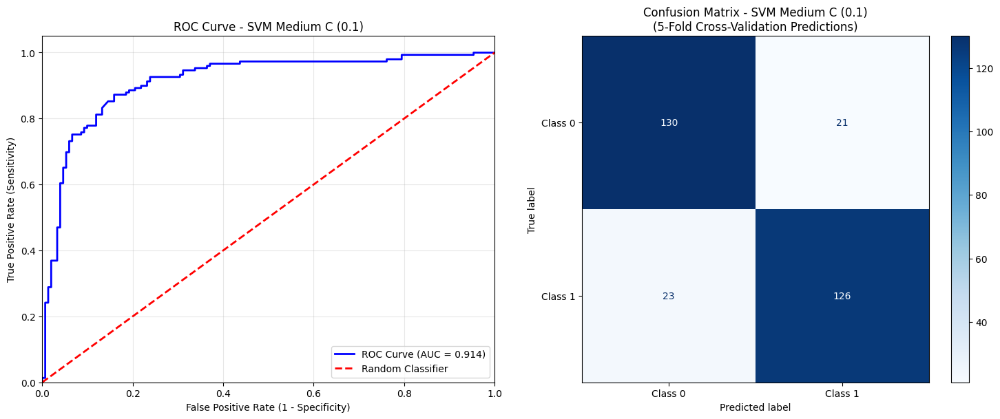

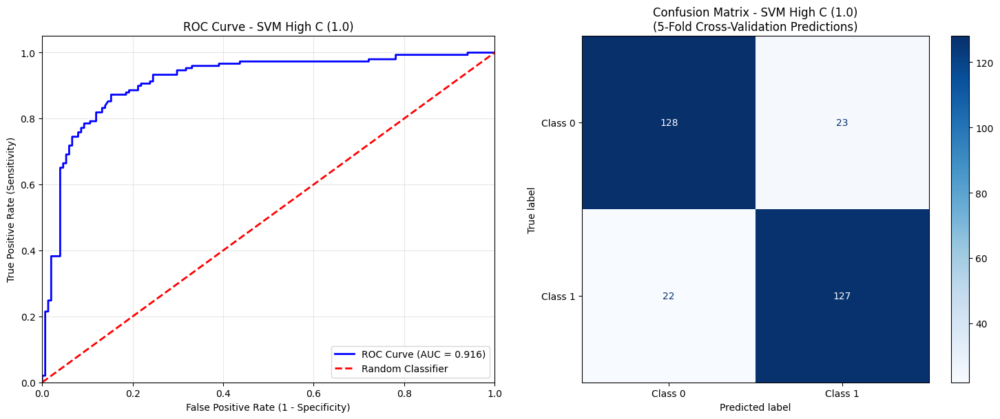

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict

def plot_roc_and_confusion_matrix(model, X, y, cv, model_name):
    """
    Plot ROC curve and confusion matrix for a given model using cross-validation
    """
    # Get probability predictions and regular predictions using cross-validation
    y_proba = cross_val_predict(model, X, y, cv=cv, method='predict_proba')
    y_pred = cross_val_predict(model, X, y, cv=cv)

    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y, y_proba[:, 1])
    roc_auc = auc(fpr, tpr)

    # Calculate confusion matrix
    cm = confusion_matrix(y, y_pred)

    # Get AUC scores from cross-validation
    auc_scores = cross_validate(model, X, y, cv=cv, scoring='roc_auc')['test_score']

    #print(f"{model_name.upper()} PERFORMANCE SUMMARY")
    #print("=" * 50)
    #print(f"Cross-validation AUC: {auc_scores.mean():.3f} (±{auc_scores.std():.3f})")
    #print("\nConfusion Matrix:")
    #print(f"True Negatives (TN):  {cm[0,0]}")
    #print(f"False Positives (FP): {cm[0,1]}")
    #print(f"False Negatives (FN): {cm[1,0]}")
    #print(f"True Positives (TP):  {cm[1,1]}")

    # Calculate error rates
    total = cm.sum()
    error_rate = (cm[0,1] + cm[1,0]) / total
    #print(f"\nOverall Error Rate: {error_rate:.1%}")
    #print(f"Type I Error (False Positive Rate): {cm[0,1]/cm[0].sum():.1%}")
    #print(f"Type II Error (False Negative Rate): {cm[1,0]/cm[1].sum():.1%}")

    # Create side-by-side plots
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # ROC Curve
    ax1 = axes[0]
    ax1.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.3f})')
    ax1.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--', label='Random Classifier')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate (1 - Specificity)')
    ax1.set_ylabel('True Positive Rate (Sensitivity)')
    ax1.set_title(f'ROC Curve - {model_name}')
    ax1.legend(loc="lower right")
    ax1.grid(True, alpha=0.3)

    # Confusion Matrix
    ax2 = axes[1]
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
    disp.plot(ax=ax2, cmap='Blues', values_format='d')
    ax2.set_title(f'Confusion Matrix - {model_name}\n(5-Fold Cross-Validation Predictions)')

    plt.tight_layout()
    plt.show()
    
    return roc_auc, cm

# Test different C values
C_values = [0.01, 0.1, 1.0]
C_labels = ['SVM Low C (0.01)', 'SVM Medium C (0.1)', 'SVM High C (1.0)']

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Plot for each C value
for C_val, C_label in zip(C_values, C_labels):
    svm_model = SVC(kernel='linear', C=C_val, random_state=42, probability=True)
    roc_auc, cm = plot_roc_and_confusion_matrix(svm_model, X, y, cv, C_label)

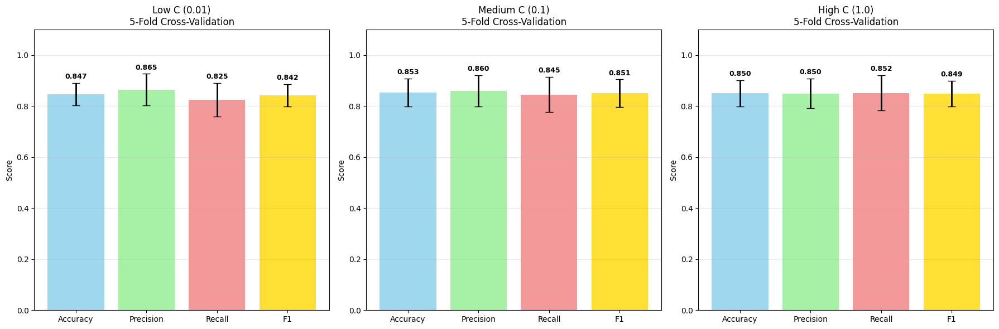

SVM Cross-Validation Results Summary:
C Value    Accuracy     Precision    Recall       F1-Score    
----------------------------------------------------------------------
0.01       0.847±0.044  0.865±0.062  0.825±0.065  0.842±0.044 
0.1        0.853±0.055  0.860±0.062  0.845±0.070  0.851±0.054 
1.0        0.850±0.052  0.850±0.059  0.852±0.070  0.849±0.051 


In [ ]:
from sklearn.model_selection import cross_validate, StratifiedKFold
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score

# Define scoring metrics for cross-validation
scoring = {
    'accuracy': 'accuracy',
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score)
}

# Test different C values
C_values = [0.01, 0.1, 1.0]
C_labels = ['Low C (0.01)', 'Medium C (0.1)', 'High C (1.0)']

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_results = []

for i, (C_val, C_label) in enumerate(zip(C_values, C_labels)):
    # Create SVM model with specific C value
    svm_model = SVC(kernel='linear', C=C_val, random_state=42)
    
    # Perform 5-fold cross-validation with multiple metrics
    cv_results = cross_validate(svm_model, X, y, cv=cv, scoring=scoring)
    
    # Calculate means and standard deviations
    metrics_summary = {}
    for metric in ['accuracy', 'precision', 'recall', 'f1']:
        scores = cv_results[f'test_{metric}']
        metrics_summary[metric] = {
            'mean': scores.mean(),
            'std': scores.std(),
            'scores': scores
        }
    
    all_results.append(metrics_summary)
    
    # Visualize metrics with error bars
    ax = axes[i]
    metrics_names = [metric.capitalize() for metric in metrics_summary.keys()]
    means = [results['mean'] for results in metrics_summary.values()]
    stds = [results['std'] for results in metrics_summary.values()]

    bars = ax.bar(metrics_names, means, yerr=stds, 
                  color=['skyblue', 'lightgreen', 'lightcoral', 'gold'], 
                  alpha=0.8, capsize=5, error_kw={'elinewidth': 2})

    # Add value labels on bars
    for bar, mean, std in zip(bars, means, stds):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.01, 
                f'{mean:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)

    ax.set_ylabel('Score')
    ax.set_title(f'{C_label}\n5-Fold Cross-Validation')
    ax.set_ylim(0, 1.1)
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Print comparison table
print("SVM Cross-Validation Results Summary:")
print("=" * 70)
print(f"{'C Value':<10} {'Accuracy':<12} {'Precision':<12} {'Recall':<12} {'F1-Score':<12}")
print("-" * 70)

for i, (C_val, results) in enumerate(zip(C_values, all_results)):
    accuracy = f"{results['accuracy']['mean']:.3f}±{results['accuracy']['std']:.3f}"
    precision = f"{results['precision']['mean']:.3f}±{results['precision']['std']:.3f}"
    recall = f"{results['recall']['mean']:.3f}±{results['recall']['std']:.3f}"
    f1 = f"{results['f1']['mean']:.3f}±{results['f1']['std']:.3f}"
    
    print(f"{C_val:<10} {accuracy:<12} {precision:<12} {recall:<12} {f1:<12}")

# Deep learning

In [ ]:
df = pd.read_csv('brain_connectivity_features.csv')
print("Test DataFrame shape:", df.shape)

Test DataFrame shape: (871, 13042)


In [ ]:
df.head()

   feature_0  feature_1  feature_2  feature_3  feature_4  feature_5  \
0   0.707107   0.093302   0.707107   0.012706   0.139604   0.707107   
1   0.707107   0.168842   0.707107  -0.004420   0.253305   0.707107   
2   0.707107   0.041188   0.707107   0.228057   0.307889   0.707107   
3   0.707107   0.236977   0.707107   0.069319   0.169001   0.707107   
4   0.707107   0.384825   0.707107   0.386928   0.372701   0.707107   

   feature_6  feature_7  feature_8  feature_9  ...  feature_13032  \
0   0.224356   0.169196  -0.083581   0.707107  ...       0.246473   
1   0.094597  -0.027532   0.032122   0.707107  ...       0.003729   
2   0.575884   0.064039   0.079087   0.707107  ...       0.245972   
3   0.133486   0.227501   0.003083   0.707107  ...       0.077336   
4   0.083041   0.269728   0.204382   0.707107  ...      -0.027110   

   feature_13033  feature_13034  feature_13035  feature_13036  feature_13037  \
0       0.261334       0.031422       0.269718       0.171146       0.197796  

In [ ]:
# Note the dataset is too big for github
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 871 entries, 0 to 870
Columns: 13042 entries, feature_0 to label
dtypes: float64(13041), int64(1)
memory usage: 86.7 MB


In [ ]:
df.describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_13032,feature_13033,feature_13034,feature_13035,feature_13036,feature_13037,feature_13038,feature_13039,feature_13040,label
count,8.710000e+02,871.000000,8.710000e+02,871.000000,871.000000,8.710000e+02,871.000000,871.000000,871.000000,8.710000e+02,...,871.000000,871.000000,871.000000,871.000000,871.000000,871.000000,871.000000,871.000000,8.710000e+02,871.000000
mean,7.071068e-01,0.153056,7.071068e-01,0.146193,0.261402,7.071068e-01,0.244517,0.154421,0.138582,7.071068e-01,...,0.033045,0.025201,0.039849,0.024432,0.026914,0.059608,0.038746,0.043901,7.071068e-01,1.537313
std,3.332583e-16,0.167043,3.332583e-16,0.158961,0.153677,3.332583e-16,0.163574,0.162637,0.152584,3.332583e-16,...,0.100585,0.091549,0.093140,0.094910,0.095710,0.099831,0.095380,0.098797,3.332583e-16,0.498892
min,7.071068e-01,-0.349080,7.071068e-01,-0.314944,-0.203992,7.071068e-01,-0.267857,-0.407553,-0.270852,7.071068e-01,...,-0.301564,-0.334648,-0.231765,-0.285536,-0.310632,-0.235585,-0.263931,-0.421921,7.071068e-01,1.000000
25%,7.071068e-01,0.034747,7.071068e-01,0.035262,0.155987,7.071068e-01,0.120779,0.039527,0.031854,7.071068e-01,...,-0.032665,-0.035978,-0.018882,-0.035377,-0.032576,-0.006879,-0.022910,-0.017724,7.071068e-01,1.000000
50%,7.071068e-01,0.149930,7.071068e-01,0.133269,0.253305,7.071068e-01,0.239180,0.145704,0.128609,7.071068e-01,...,0.028432,0.020136,0.029179,0.021510,0.025643,0.052152,0.034702,0.040760,7.071068e-01,2.000000
75%,7.071068e-01,0.263941,7.071068e-01,0.251558,0.366732,7.071068e-01,0.348499,0.268249,0.241979,7.071068e-01,...,0.089892,0.080291,0.089822,0.084159,0.084994,0.121168,0.092024,0.102665,7.071068e-01,2.000000
max,7.071068e-01,0.589270,7.071068e-01,0.694661,0.719203,7.071068e-01,0.722610,0.600412,0.641001,7.071068e-01,...,0.406633,0.489763,0.439885,0.354950,0.417138,0.384109,0.425669,0.400507,7.071068e-01,2.000000


## Classification Task: Autism Prediction from Brain Connectivity

We'll start with a **classification task** using brain imaging data to demonstrate how neural networks can identify diagnostic patterns in medical data.

### Dataset: Dosenbach 160 ROIs
We're using the `rois_dosenbach160` dataset from nilearn, which contains:
- **871 samples** from different individuals  
- **13,041 features** representing brain connectivity measurements
- Each sample captures functional connectivity between 160 brain regions of interest (ROIs)
- Data comes from resting-state fMRI where participants weren't performing specific tasks
- **Goal**: Predict if individuals have autism based on their brain connectivity patterns

### What We'll Explore:
- **Binary classification**: Autism vs. neurotypical brain patterns
- **High-dimensional data**: Working with 13,041 connectivity features
- **Feature importance**: Which brain connections are most predictive?
- **Neural network performance**: Can deep learning outperform traditional methods?

This analysis will show how neural networks can learn to identify subtle differences in brain connectivity that distinguish individuals with autism from neurotypical controls - discovering diagnostic biomarkers from complex neuroimaging data.

Let's see if we can detect autism signatures in brain networks!

In [ ]:
from nilearn import datasets
from nilearn.connectome import ConnectivityMeasure
 
data = datasets.fetch_abide_pcp(derivatives=["rois_dosenbach160"])
 
# get functional connectivity between 160 brain regions
correlation_measure = ConnectivityMeasure(kind='correlation', vectorize=True)
X = correlation_measure.fit_transform(data.rois_dosenbach160)
 
# get labels (healthy - autistic)
y = data.phenotypic["DX_GROUP"].values

[get_dataset_dir] Dataset found in C:\Users\janic\nilearn_data\ABIDE_pcp
[fetch_single_file] Downloading data from https://s3.amazonaws.com/fcp-indi/data/Projects/ABIDE_Initiative/Outputs/cpac/nofilt_noglobal/rois_dosenbach160/NYU_0050952_rois_dosenbach160.1D ...
[fetch_single_file]  ...done. (1 seconds, 0 min)

[fetch_single_file] Downloading data from https://s3.amazonaws.com/fcp-indi/data/Projects/ABIDE_Initiative/Outputs/cpac/nofilt_noglobal/rois_dosenbach160/NYU_0050954_rois_dosenbach160.1D ...
[fetch_single_file]  ...done. (1 seconds, 0 min)

[fetch_single_file] Downloading data from https://s3.amazonaws.com/fcp-indi/data/Projects/ABIDE_Initiative/Outputs/cpac/nofilt_noglobal/rois_dosenbach160/NYU_0050955_rois_dosenbach160.1D ...
[fetch_single_file]  ...done. (1 seconds, 0 min)

[fetch_single_file] Downloading data from https://s3.amazonaws.com/fcp-indi/data/Projects/ABIDE_Initiative/Outputs/cpac/nofilt_noglobal/rois_dosenbach160/NYU_0050956_rois_dosenbach160.1D ...
[fetch_single

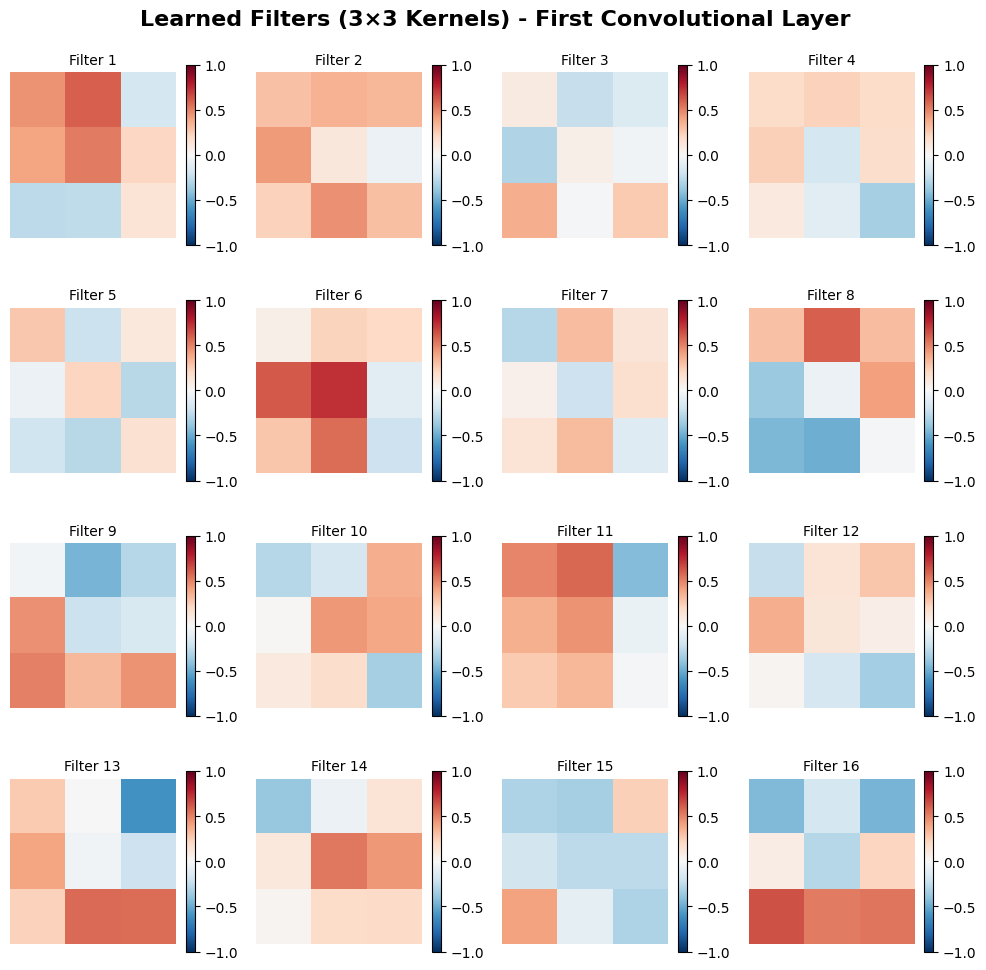

Each filter detects different patterns:
• Red regions: Negative weights (suppress features)
• Blue regions: Positive weights (enhance features)
• These 3×3 patterns detect edges, corners, and textures


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract filters from the first convolutional layer
first_conv_layer = cnn_model.conv1
filters = first_conv_layer.weight.data.cpu().numpy()  # Shape: (32, 1, 3, 3)

# Plot a subset of filters (first 16)
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
fig.suptitle('Learned Filters (3×3 Kernels) - First Convolutional Layer', fontsize=16, fontweight='bold')

for i, ax in enumerate(axes.flat):
    if i < 16:
        # Get the filter (remove channel dimension since it's 1)
        filter_img = filters[i, 0, :, :]
        
        # Plot with colormap to show positive/negative weights
        im = ax.imshow(filter_img, cmap='RdBu_r', vmin=-1, vmax=1)
        ax.set_title(f'Filter {i+1}', fontsize=10)
        ax.axis('off')
        
        # Add colorbar for reference
        plt.colorbar(im, ax=ax, shrink=0.8)
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

print("Each filter detects different patterns:")
print("• Red regions: Negative weights (suppress features)")
print("• Blue regions: Positive weights (enhance features)")
print("• These 3×3 patterns detect edges, corners, and textures")

Training Neural Network with Stochastic Gradient Descent...
Epoch 1: Loss = 0.7142
Epoch 10: Loss = 0.5227
Epoch 100: Loss = 0.2305
Epoch 1000: Loss = 0.0620


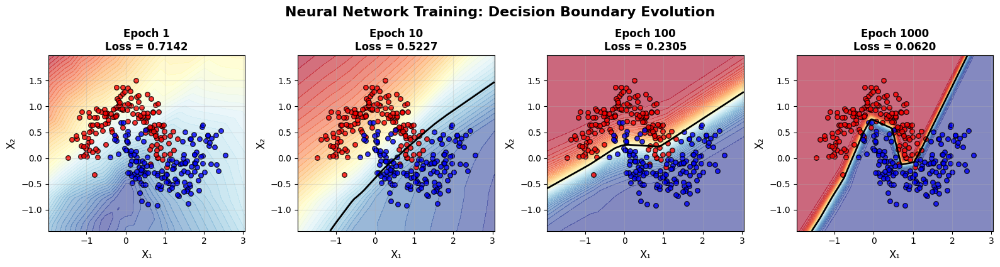

Training completed!


In [ ]:
def train_and_visualize(model, X, y, epochs_to_show=[1, 10, 100, 1000]):
    """Train the model and create subplot visualizations"""
    
    # Convert data to PyTorch tensors
    X_tensor = torch.FloatTensor(X)
    y_tensor = torch.FloatTensor(y).unsqueeze(1)
    
    # Training setup
    criterion = nn.BCELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.5)
    
    # Storage for results
    total_epochs = max(epochs_to_show)
    losses = []
    snapshots = {}
    
    print("Training Neural Network with Stochastic Gradient Descent...")
    print("=" * 60)
    
    # Training loop
    for epoch in range(total_epochs + 1):
        # Forward pass
        outputs = model(X_tensor)
        loss = criterion(outputs, y_tensor)
        
        # Backward pass and optimization
        if epoch > 0:  # Skip optimization for epoch 0
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        # Store loss
        losses.append(loss.item())
        
        # Save snapshots at specific epochs (AFTER the update)
        if epoch in epochs_to_show:
            print(f"Epoch {epoch}: Loss = {loss.item():.4f}")
            # Save a deep copy of the model state
            snapshots[epoch] = {
                'weights': {name: param.data.clone() for name, param in model.named_parameters()},
                'loss': loss.item()
            }
    
    # Create subplot visualization
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    for idx, epoch in enumerate(epochs_to_show):
        ax = axes[idx]
        
        # Temporarily load the saved weights for this epoch
        saved_weights = snapshots[epoch]['weights']
        original_weights = {name: param.data.clone() for name, param in model.named_parameters()}
        
        # Load saved weights
        for name, param in model.named_parameters():
            param.data = saved_weights[name]
        
        loss_val = snapshots[epoch]['loss']
        
        # Create mesh for decision boundary
        h = 0.02
        x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
        y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))
        
        # Get predictions
        mesh_points = torch.FloatTensor(np.c_[xx.ravel(), yy.ravel()])
        with torch.no_grad():
            Z = model(mesh_points).numpy()
        Z = Z.reshape(xx.shape)
        
        # Plot decision boundary
        contour = ax.contourf(xx, yy, Z, levels=50, alpha=0.6, cmap='RdYlBu')
        ax.contour(xx, yy, Z, levels=[0.5], colors='black', linewidths=2)
        
        # Plot data points
        colors = ['red', 'blue']
        for i in range(2):
            mask = y == i
            ax.scatter(X[mask, 0], X[mask, 1], 
                      c=colors[i], alpha=0.8, s=30, edgecolors='black')
        
        ax.set_xlabel('X₁', fontsize=12)
        ax.set_ylabel('X₂', fontsize=12)
        ax.set_title(f'Epoch {epoch}\nLoss = {loss_val:.4f}', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Restore original weights
        for name, param in model.named_parameters():
            param.data = original_weights[name]
    
    plt.tight_layout()
    plt.suptitle('Neural Network Training: Decision Boundary Evolution', 
                 fontsize=16, fontweight='bold', y=1.05)
    plt.show()
    
    return losses

# Reinitialize model to start fresh
model = SimpleNeuralNet(hidden_size=20)

# Train and visualize
losses = train_and_visualize(model, X_moons, y_moons)

print("Training completed!")

EPOCH 3 (After third gradient descent step):
Slope (weight): 2.314
Intercept (bias): 9.746
Loss: 93.722



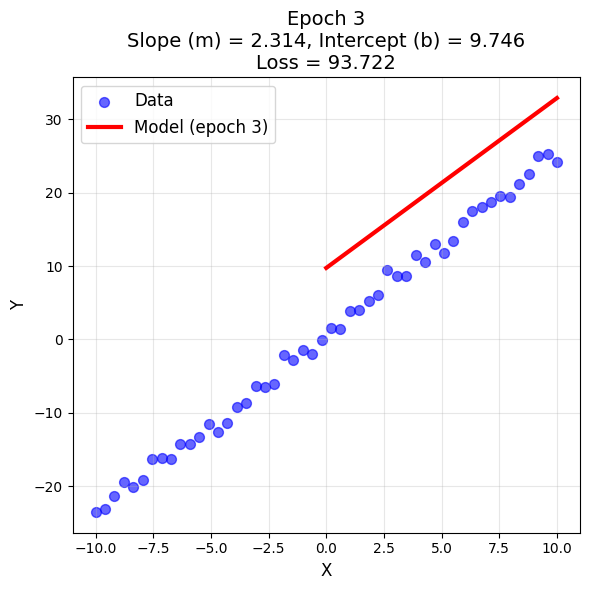

Notice how the line is gradually getting closer to the data!


In [ ]:
# Third training step
y_pred = model(X_tensor)
loss = criterion(y_pred, y_tensor)

optimizer.zero_grad()
loss.backward()
optimizer.step()

print(f"EPOCH 3 (After third gradient descent step):")
print(f"Slope (weight): {model.linear.weight.item():.3f}")
print(f"Intercept (bias): {model.linear.bias.item():.3f}")
print(f"Loss: {loss.item():.3f}")
print()

plot_single_epoch(X, y_true, 3, 
                  model.linear.weight.item(), 
                  model.linear.bias.item(), 
                  loss.item())

print("Notice how the line is gradually getting closer to the data!")

In [ ]:
from __future__ import division, print_function, absolute_import, unicode_literals

# Python imports
import numpy as np
import matplotlib.pyplot as plt  
from mpl_toolkits import mplot3d

%matplotlib inline
np.random.seed(seed=1)

from matplotlib import animation, rc
from IPython.display import HTML, Image

rc('animation', html='html5')

#create a dataset with 100 examples,each containing two variables
m=100 #no. of examples
X=np.ones([m,2]) #adds X0 to the X values
#X[:,0]=np.linspace(-5,5,100)
X[:,1]=np.linspace(-5,5,m)
Y=np.ones(m)
theta_set=[2,2] #parameters for data generation (intercept and slope)
noise = np.random.randn(len(Y))*0.2
Y=X@theta_set+noise*10

# calculate general cost function shape for plot
no_dots = 40
t0 = np.linspace(-5,10, no_dots)
t1 = np.linspace(-1,5, no_dots)
thetag=[]
cost = np.zeros([no_dots,no_dots])

for i in range(no_dots):
    for j in range(no_dots):
        thetag=[t0[i],t1[j]]
        cost[i,j]=(1/(2*m))*np.transpose((X@thetag - Y))@(X@thetag - Y)

#GRADIENT DESCENT
theta = np.ones(2)
cost_list=[]
theta_hist0=[]
theta_hist1=[]


###### to be controlled by the user##############
theta[0]=0 #starting intercept value
theta[1]=5 #starting slope value
epochs = 30 #number of epochs
lr=0.2 #learning rate
##################################################

theta_hist0.append(theta[0])
theta_hist1.append(theta[1])

for i in range(epochs):
  theta = theta - lr*(1/m)*np.transpose(X)@(X@theta - Y)
  theta_hist0.append(theta[0])
  theta_hist1.append(theta[1])       
  cost_val = (1/(2*m))*np.transpose((X@theta - Y))@(X@theta - Y)
  cost_list.append(cost_val)

# Create animation (uses ffmpeg)
fig, ax1, ax2, line1, line12,line2, pc_dots, pc_dotc,cost_text= init_fig()
animate = get_anim(fig, ax1, ax2, line1, line12, line2, pc_dots, pc_dotc,cost_text, cost_list,theta_hist0, theta_hist1,X)

anim = animation.FuncAnimation(fig, animate, frames=epochs, interval=800, blit=True)
anim


# Create gif from animation (uses ImageMagick)
fname='./gradient_descent3D_good_lr.gif'
gif_path = fname
anim.save(fname, writer='imagemagick', fps=1000/800)
Image(url=gif_path)

MovieWriter imagemagick unavailable; using Pillow instead.


RuntimeError: x must be a sequence

In [ ]:
# intialize animation
def init_fig():
    
    """Initialise figure"""
    fig = plt.figure(figsize=plt.figaspect(0.3))
    
    
    ax1=fig.add_subplot(1,3,3,projection='3d') #ax1 is the surface plot of loss
    tx,ty = np.meshgrid(t0,t1,indexing='ij')
    ax1.plot_wireframe(tx,ty,cost)
    #this would ideally be a surface plot rather than wireframe 
    #but in matplotlib that makes the points hidden below the plane
    
    pc_dots, = ax1.plot([],[],[],'ro')
    cost_text = ax1.set_title('loss at step {}'.format(0), fontsize=18)
    ax1.set_xlabel(r'$\theta_0$')
    ax1.set_ylabel(r'$\theta_1$')
    ax1.set_zlabel('loss')
    ax1.zaxis.set_label_position('upper')
    line1,=ax1.plot([],[],[],'r', label='descent path')

    ax12 = fig.add_subplot(1,3,2)    #ax12 is contour plot of loss
    contour = ax12.contour(tx,ty,cost,levels=25) 
    pc_dotc,=ax12.plot([],[],'ro')
    ax12.set_xlabel(r'$\theta_0$')
    ax12.set_ylabel(r'$\theta_1$')
    line12, = ax12.plot([],[], 'r', label='descent path')
    
    ax2 = fig.add_subplot(1,3,1) #ax2 is the data with fit
    ax2.plot(X[:,1], Y, 'bo', label='data')
    ax2.set_xlabel('input: $x_1$', fontsize=15)
    ax2.set_ylabel('Y', fontsize=15)
    ax2.yaxis.set_label_position('left')
    ax2.set_title('Labelled data & model output', fontsize=18)
    line2, = ax2.plot([], [], 'k-', label='fitted line: $y=x\\theta$')
    ax2.legend(loc=2)
    return fig, ax1, ax2, line1, line12,line2, pc_dots, pc_dotc,cost_text


def get_anim(fig, ax1, ax2, line1, line12,line2, pc_dots, pc_dotc,cost_text, cost_list,theta_hist0, theta_hist1,X):
    def anim(i):
        """Animate step i"""
        if i == 0:
            return [line2, pc_dots, cost_text]
        
        thetai=[theta_hist0[i-1], theta_hist1[i-1]]
        cost_text.set_text('Loss at step {} = {:.3f}'.format(i, cost_list[i-1]))
    #surface plot
        pc_dots.set_xdata(theta_hist0[i-1])
        pc_dots.set_ydata(theta_hist1[i-1])
        pc_dots.set_3d_properties(cost_list[i-1]) 
    
    #contour plot
        pc_dotc.set_xdata(theta_hist0[i-1])
        pc_dotc.set_ydata(theta_hist1[i-1])
    
        line1.set_xdata(theta_hist0[:i])
        line1.set_ydata(theta_hist1[:i])
        line1.set_3d_properties(cost_list[:i])
        line12.set_xdata(theta_hist0[:i])
        line12.set_ydata(theta_hist1[:i])
        ax2.legend(loc=2)
    #data with fit   
        xli=np.array([[1,-10],[1,10]])
        Y_pred=xli@thetai
        line2.set_xdata(xli[:,1])
        line2.set_ydata(Y_pred)
        
        return [line1, line12,line2, pc_dots,pc_dotc,cost_text]
    return anim

In [ ]:
# probably overkill but interesting
from torchinfo import summary

# Detailed model summary
summary(model, input_size=(100, 2))  # batch_size=100, input_features=2

Layer (type:depth-idx)                   Output Shape              Param #
CircleClassifier                         [100, 2]                  --
├─Linear: 1-1                            [100, 20]                 60
├─ReLU: 1-2                              [100, 20]                 --
├─Linear: 1-3                            [100, 20]                 420
├─ReLU: 1-4                              [100, 20]                 --
├─Linear: 1-5                            [100, 2]                  42
Total params: 522
Trainable params: 522
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0.05
Input size (MB): 0.00
Forward/backward pass size (MB): 0.03
Params size (MB): 0.00
Estimated Total Size (MB): 0.04

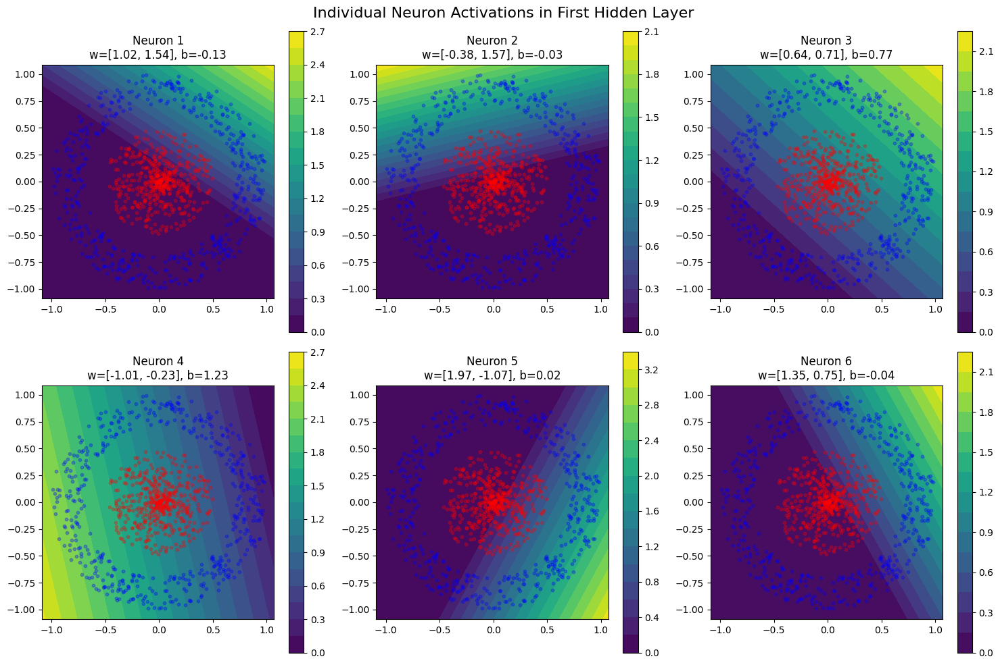

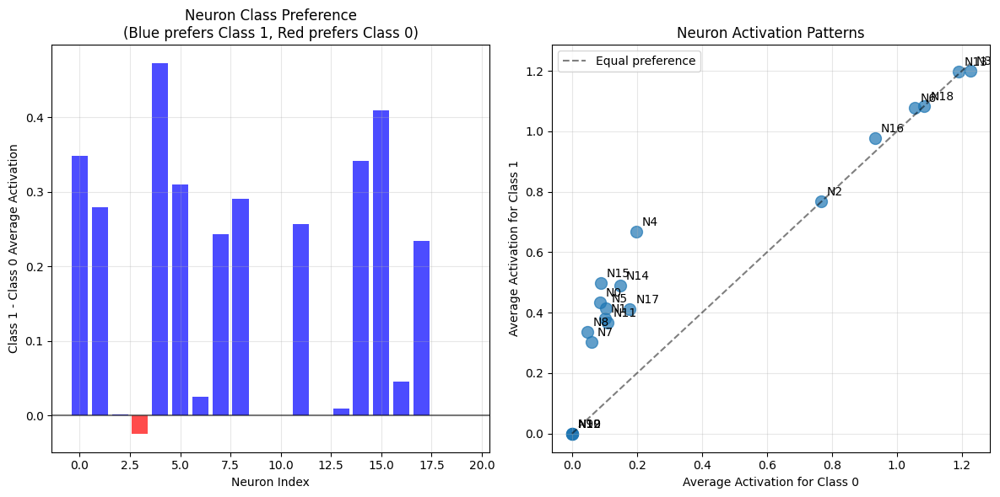

Neuron Specialization Analysis:
----------------------------------------
Neuron  0: Strongly prefers Class 1 (difference: 0.348)
Neuron  1: Strongly prefers Class 1 (difference: 0.279)
Neuron  4: Strongly prefers Class 1 (difference: 0.472)
Neuron  5: Strongly prefers Class 1 (difference: 0.310)
Neuron  7: Strongly prefers Class 1 (difference: 0.242)
Neuron  8: Strongly prefers Class 1 (difference: 0.291)
Neuron 11: Strongly prefers Class 1 (difference: 0.257)
Neuron 14: Strongly prefers Class 1 (difference: 0.342)
Neuron 15: Strongly prefers Class 1 (difference: 0.409)
Neuron 17: Strongly prefers Class 1 (difference: 0.234)


In [ ]:
def visualize_individual_neurons(model, X, y):
    """Visualize what individual neurons in the first hidden layer learned"""
    
    # Get the trained weights and biases of first layer
    weights = model.layer1.weight.data.numpy()  # Shape: (hidden_size, 2)
    biases = model.layer1.bias.data.numpy()     # Shape: (hidden_size,)
    
    # Create a mesh for visualization
    h = 0.02
    x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1
    y_min, y_max = X[:, 1].min() - 0.1, X[:, 1].max() + 0.1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    mesh_points = np.c_[xx.ravel(), yy.ravel()]
    
    # Show first 6 neurons
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()
    
    for neuron_idx in range(min(6, len(weights))):
        # Calculate neuron activation: ReLU(w*x + b)
        w = weights[neuron_idx]
        b = biases[neuron_idx]
        
        # Linear combination: w1*x + w2*y + b
        linear_output = mesh_points @ w + b
        # Apply ReLU
        neuron_activation = np.maximum(0, linear_output)
        neuron_activation = neuron_activation.reshape(xx.shape)
        
        # Plot activation map
        im = axes[neuron_idx].contourf(xx, yy, neuron_activation, levels=20, cmap='viridis')
        axes[neuron_idx].set_title(f'Neuron {neuron_idx+1}\nw=[{w[0]:.2f}, {w[1]:.2f}], b={b:.2f}')
        
        # Overlay some data points
        colors = ['red', 'blue']
        for class_idx in range(2):
            mask = y == class_idx
            axes[neuron_idx].scatter(X[mask, 0], X[mask, 1], 
                                   c=colors[class_idx], alpha=0.3, s=10)
        
        plt.colorbar(im, ax=axes[neuron_idx])
        axes[neuron_idx].set_aspect('equal')
    
    plt.suptitle('Individual Neuron Activations in First Hidden Layer', fontsize=16)
    plt.tight_layout()
    plt.show()

def visualize_neuron_specialization(model, X, y):
    """Show which neurons activate most for each class"""
    
    # Get activations for all data points
    representations = model.get_representations(X)
    hidden1_activations = representations['hidden1']
    
    # Calculate average activation per neuron for each class
    class0_mask = y == 0
    class1_mask = y == 1
    
    avg_activation_class0 = hidden1_activations[class0_mask].mean(axis=0)
    avg_activation_class1 = hidden1_activations[class1_mask].mean(axis=0)
    
    # Find neurons that prefer each class
    preference = avg_activation_class1 - avg_activation_class0
    
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    neuron_indices = range(len(preference))
    colors = ['red' if p < 0 else 'blue' for p in preference]
    plt.bar(neuron_indices, preference, color=colors, alpha=0.7)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.5)
    plt.title('Neuron Class Preference\n(Blue prefers Class 1, Red prefers Class 0)')
    plt.xlabel('Neuron Index')
    plt.ylabel('Class 1 - Class 0 Average Activation')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.scatter(avg_activation_class0, avg_activation_class1, s=100, alpha=0.7)
    for i, (x, y_val) in enumerate(zip(avg_activation_class0, avg_activation_class1)):
        plt.annotate(f'N{i}', (x, y_val), xytext=(5, 5), textcoords='offset points')
    
    # Add diagonal line
    max_val = max(avg_activation_class0.max(), avg_activation_class1.max())
    plt.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, label='Equal preference')
    
    plt.xlabel('Average Activation for Class 0')
    plt.ylabel('Average Activation for Class 1') 
    plt.title('Neuron Activation Patterns')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print insights
    print("Neuron Specialization Analysis:")
    print("-" * 40)
    for i, pref in enumerate(preference):
        if abs(pref) > 0.1:  # Only show neurons with clear preference
            preferred_class = 1 if pref > 0 else 0
            print(f"Neuron {i:2d}: Strongly prefers Class {preferred_class} (difference: {pref:.3f})")

# Visualize what individual neurons learned
visualize_individual_neurons(model, X_train.numpy(), y_train.numpy())
visualize_neuron_specialization(model, X_train, y_train)

In [ ]:
import torch
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider

def simple_relu_demo():
    """Simple interactive ReLU demonstration"""
    
    # Small dataset for speed
    x = torch.linspace(-3, 3, 200)
    
    def plot_single_relu(weight=1.0, bias=0.0):
        """Plot a single ReLU with adjustable weight and bias"""
        
        # Compute ReLU: weight * ReLU(x + bias)
        relu_output = weight * torch.relu(x + bias)
        
        # Simple plot
        plt.figure(figsize=(8, 5))
        plt.plot(x, relu_output, 'blue', linewidth=3, label=f'{weight:.1f} × ReLU(x + {bias:.1f})')
        plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
        plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
        plt.title('Interactive ReLU Function')
        plt.xlabel('x')
        plt.ylabel('output')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.ylim(-3, 3)
        plt.show()
    
    # Simple sliders
    interact(plot_single_relu,
             weight=FloatSlider(min=-2, max=2, step=0.2, value=1.0, description='Weight:'),
             bias=FloatSlider(min=-2, max=2, step=0.2, value=0.0, description='Bias:'))

# Run it
print("🎮 Try adjusting the sliders to see how ReLU changes!")
simple_relu_demo()

🎮 Try adjusting the sliders to see how ReLU changes!


interactive(children=(FloatSlider(value=1.0, description='Weight:', max=2.0, min=-2.0, step=0.2), FloatSlider(…

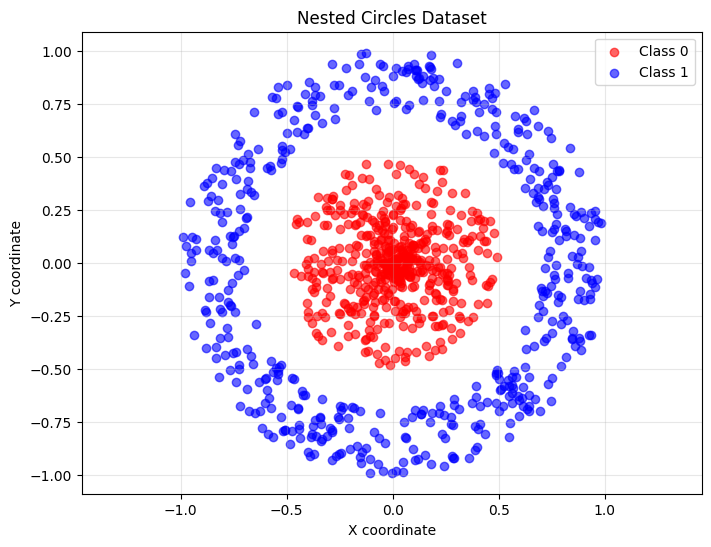

Epoch 0, Loss: 0.6964, Accuracy: 0.5000
Epoch 100, Loss: 0.0041, Accuracy: 1.0000
Epoch 200, Loss: 0.0013, Accuracy: 1.0000
Epoch 300, Loss: 0.0006, Accuracy: 1.0000
Epoch 400, Loss: 0.0004, Accuracy: 1.0000
Epoch 500, Loss: 0.0002, Accuracy: 1.0000
Epoch 600, Loss: 0.0002, Accuracy: 1.0000
Epoch 700, Loss: 0.0001, Accuracy: 1.0000
Epoch 800, Loss: 0.0001, Accuracy: 1.0000
Epoch 900, Loss: 0.0001, Accuracy: 1.0000


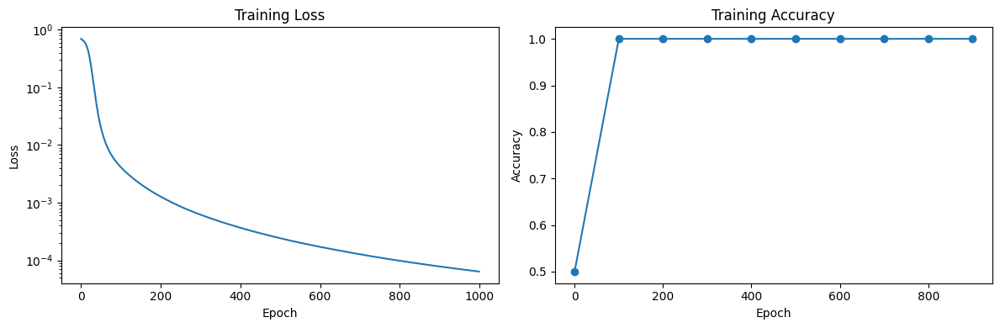

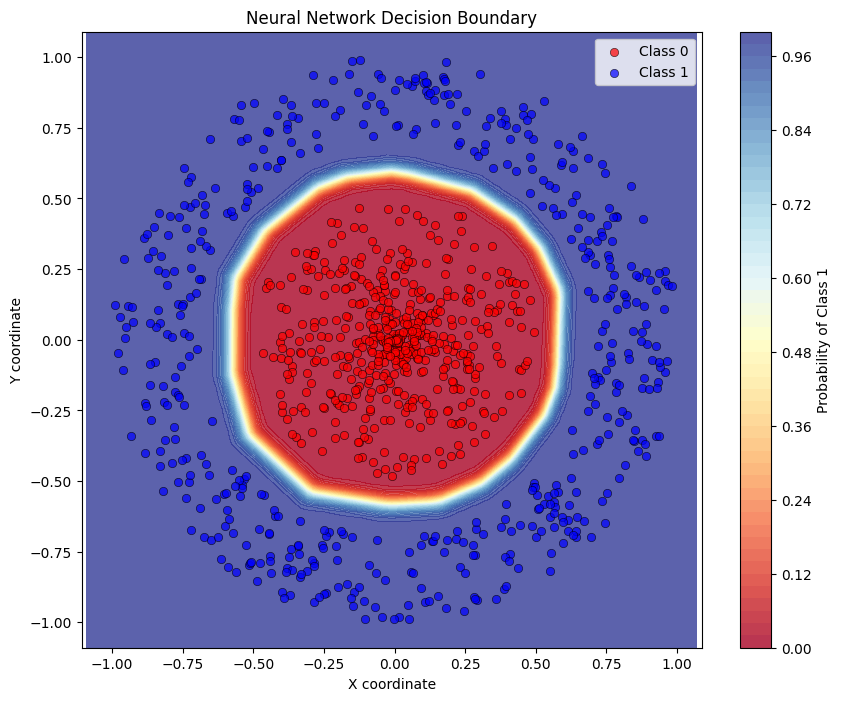

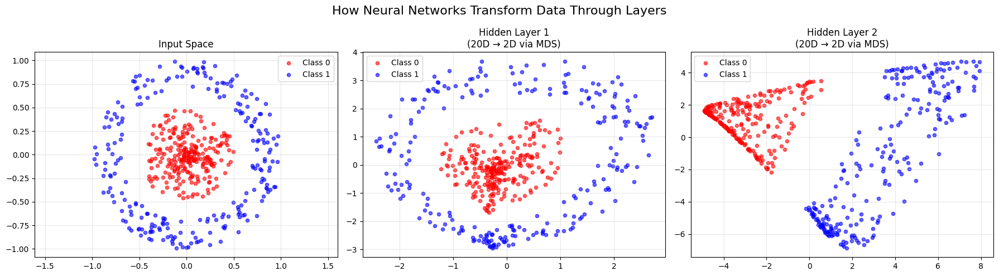


KEY INSIGHTS:
1. INPUT SPACE: Classes are mixed (no simple linear separation)
2. HIDDEN LAYER 1: Network starts to separate the classes
3. HIDDEN LAYER 2: Classes become more distinctly clustered
4. The network gradually transforms the data to make classification easier!


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import MDS
from sklearn.decomposition import PCA
import seaborn as sns

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

def create_nested_circles_data(n_samples=1000):
    """Create nested circles dataset"""
    # Inner circle (class 0)
    n_inner = n_samples // 2
    angles_inner = np.random.uniform(0, 2*np.pi, n_inner)
    radii_inner = np.random.uniform(0, 0.5, n_inner)
    x_inner = radii_inner * np.cos(angles_inner)
    y_inner = radii_inner * np.sin(angles_inner)
    labels_inner = np.zeros(n_inner)
    
    # Outer ring (class 1)
    n_outer = n_samples - n_inner
    angles_outer = np.random.uniform(0, 2*np.pi, n_outer)
    radii_outer = np.random.uniform(0.7, 1.0, n_outer)
    x_outer = radii_outer * np.cos(angles_outer)
    y_outer = radii_outer * np.sin(angles_outer)
    labels_outer = np.ones(n_outer)
    
    # Combine data
    X = np.column_stack([
        np.concatenate([x_inner, x_outer]),
        np.concatenate([y_inner, y_outer])
    ])
    y = np.concatenate([labels_inner, labels_outer])
    
    return torch.FloatTensor(X), torch.LongTensor(y)

# Create dataset
X_train, y_train = create_nested_circles_data(1000)

# Visualize the data
plt.figure(figsize=(8, 6))
colors = ['red', 'blue']
for i in range(2):
    mask = y_train == i
    plt.scatter(X_train[mask, 0], X_train[mask, 1], 
                c=colors[i], alpha=0.6, 
                label=f'Class {i}')
plt.title('Nested Circles Dataset')
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
plt.legend()
plt.axis('equal')
plt.grid(True, alpha=0.3)
plt.show()

class CircleClassifier(nn.Module):
    def __init__(self, input_size=2, hidden_size=10, num_classes=2):
        super().__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.layer2 = nn.Linear(hidden_size, hidden_size)
        self.layer3 = nn.Linear(hidden_size, num_classes)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        # Store intermediate representations
        self.input_repr = x
        
        # First hidden layer
        h1 = self.relu(self.layer1(x))
        self.hidden1_repr = h1
        
        # Second hidden layer  
        h2 = self.relu(self.layer2(h1))
        self.hidden2_repr = h2
        
        # Output layer
        output = self.layer3(h2)
        
        return output
    
    def get_representations(self, x):
        """Get intermediate representations for visualization"""
        with torch.no_grad():
            self.forward(x)
            return {
                'input': self.input_repr.numpy(),
                'hidden1': self.hidden1_repr.numpy(), 
                'hidden2': self.hidden2_repr.numpy()
            }

# Create and train the model
model = CircleClassifier(hidden_size=20)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Training loop
losses = []
accuracies = []

for epoch in range(1000):
    # Forward pass
    outputs = model(X_train)
    loss = criterion(outputs, y_train)
    
    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Track metrics
    losses.append(loss.item())
    
    if epoch % 100 == 0:
        with torch.no_grad():
            predictions = torch.argmax(outputs, dim=1)
            accuracy = (predictions == y_train).float().mean()
            accuracies.append(accuracy.item())
            print(f'Epoch {epoch}, Loss: {loss.item():.4f}, Accuracy: {accuracy.item():.4f}')

# Visualize training progress
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(losses)
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')

plt.subplot(1, 2, 2)
epochs_acc = np.arange(0, 1000, 100)
plt.plot(epochs_acc, accuracies, 'o-')
plt.title('Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.tight_layout()
plt.show()

def visualize_decision_boundary(model, X, y):
    """Visualize the decision boundary learned by the model"""
    # Create a mesh
    h = 0.02
    x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1
    y_min, y_max = X[:, 1].min() - 0.1, X[:, 1].max() + 0.1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    
    # Make predictions on the mesh
    mesh_points = torch.FloatTensor(np.c_[xx.ravel(), yy.ravel()])
    with torch.no_grad():
        outputs = model(mesh_points)
        predictions = torch.softmax(outputs, dim=1)[:, 1]  # Probability of class 1
    
    predictions = predictions.reshape(xx.shape)
    
    # Plot
    plt.figure(figsize=(10, 8))
    plt.contourf(xx, yy, predictions, levels=50, alpha=0.8, cmap='RdYlBu')
    plt.colorbar(label='Probability of Class 1')
    
    # Plot data points
    colors = ['red', 'blue']
    for i in range(2):
        mask = y == i
        plt.scatter(X[mask, 0], X[mask, 1], 
                    c=colors[i], alpha=0.7, 
                    label=f'Class {i}', edgecolors='black', linewidth=0.5)
    
    plt.title('Neural Network Decision Boundary')
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.legend()
    plt.axis('equal')
    plt.show()

# Visualize the decision boundary
visualize_decision_boundary(model, X_train.numpy(), y_train.numpy())

def visualize_layer_transformations(model, X, y, n_samples=500):
    """Visualize how data transforms through network layers using MDS"""
    
    # Sample subset for clarity
    indices = np.random.choice(len(X), n_samples, replace=False)
    X_sample = X[indices]
    y_sample = y[indices]
    
    # Get representations from each layer
    representations = model.get_representations(X_sample)
    
    # Set up the plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    layer_names = ['Input Space', 'Hidden Layer 1', 'Hidden Layer 2']
    
    colors = ['red', 'blue']
    
    for i, (layer_name, layer_key) in enumerate(zip(layer_names, ['input', 'hidden1', 'hidden2'])):
        data = representations[layer_key]
        
        # If more than 2 dimensions, use MDS to reduce to 2D
        if data.shape[1] > 2:
            mds = MDS(n_components=2, random_state=42)
            data_2d = mds.fit_transform(data)
        else:
            data_2d = data
            
        # Plot each class
        for class_idx in range(2):
            mask = y_sample == class_idx
            axes[i].scatter(data_2d[mask, 0], data_2d[mask, 1], 
                           c=colors[class_idx], alpha=0.6, 
                           label=f'Class {class_idx}', s=20)
        
        axes[i].set_title(f'{layer_name}\n({data.shape[1]}D → 2D via MDS)' if data.shape[1] > 2 
                         else f'{layer_name}')
        axes[i].legend()
        axes[i].grid(True, alpha=0.3)
        
        # Make axes equal for input space
        if i == 0:
            axes[i].axis('equal')
    
    plt.suptitle('How Neural Networks Transform Data Through Layers', fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize the transformations
visualize_layer_transformations(model, X_train, y_train)

print("\n" + "="*60)
print("KEY INSIGHTS:")
print("="*60)
print("1. INPUT SPACE: Classes are mixed (no simple linear separation)")
print("2. HIDDEN LAYER 1: Network starts to separate the classes")  
print("3. HIDDEN LAYER 2: Classes become more distinctly clustered")
print("4. The network gradually transforms the data to make classification easier!")

# Decision trees

**Medical Example:**
Patient has chest pain?<br>
├── Yes → Age > 65?<br>
│ ├── Yes → High risk of cardiac event<br>
│ └── No → Check cholesterol levels?<br>
│     ├── High → Moderate risk<br>
│     └── Normal → Low risk<br>
└── No → Check other symptoms...

# Feature descriptions
feature_descriptions = {
    'age': 'Patient age (years)',
    'gender': '0=Female, 1=Male',
    'chest_pain_type': '0=Typical, 1=Atypical, 2=Non-cardiac, 3=Asymptomatic',
    'blood_pressure': 'Systolic blood pressure (mmHg)',
    'cholesterol': 'Cholesterol level (mg/dl)',
    'blood_sugar_high': 'Blood sugar > 120 mg/dl (0=No, 1=Yes)',
    'ecg_results': '0=Normal, 1=Abnormal, 2=Probable LVH',
    'max_heart_rate': 'Maximum heart rate achieved',
    'exercise_angina': 'Exercise induced angina (0=No, 1=Yes)',
    'heart_disease': 'Target: 0=No disease, 1=Disease present'
}

print("\nFeature Descriptions:")
for feature, description in feature_descriptions.items():
    print(f"  {feature}: {description}")

Gradient Boosting:
  Mean R² Score: 0.8659 (±0.0268)
  Range: [0.8313, 0.8964]

Random Forest:
  Mean R² Score: 0.8394 (±0.0351)
  Range: [0.7858, 0.8829]

Linear Regression:
  Mean R² Score: 0.8783 (±0.0209)
  Range: [0.8417, 0.8997]



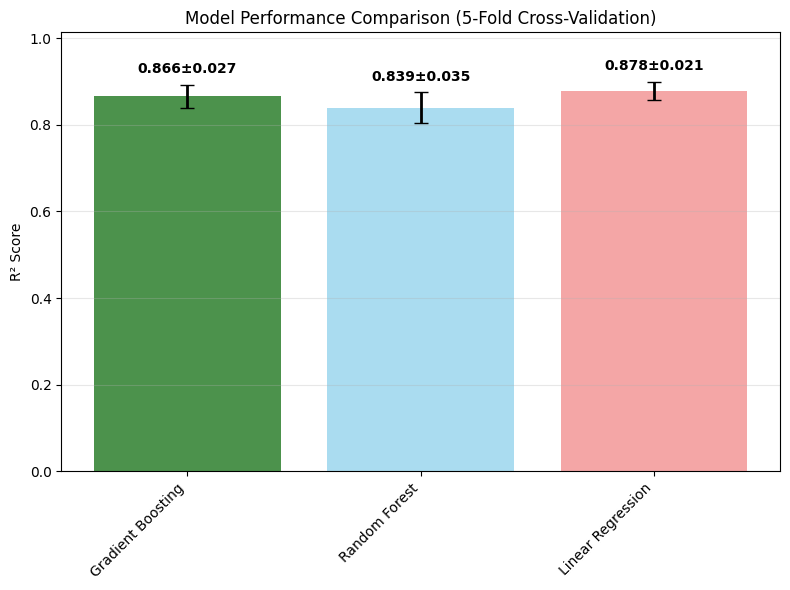

In [ ]:
# Initialize regression models for cardiovascular risk prediction
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score
import numpy as np

# Prepare features and target
X = df[['age', 'bmi', 'systolic_bp', 'exercise_hours', 'sleep_hours']]
y = df['cardiovascular_risk']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize regression models
models = {
    'Gradient Boosting': GradientBoostingRegressor(
        n_estimators=100,
        learning_rate=0.1,
        random_state=42
    ),
    'Random Forest': RandomForestRegressor(
        n_estimators=100,
        random_state=42,
        n_jobs=-1
    ),
    'Linear Regression': LinearRegression()
}

# Perform cross-validation and collect results
cv_results = {}

for name, model in models.items():
    # 5-fold cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
    
    cv_results[name] = {
        'mean_r2': cv_scores.mean(),
        'std_r2': cv_scores.std(),
        'min_r2': cv_scores.min(),
        'max_r2': cv_scores.max(),
        'scores': cv_scores
    }
    
    print(f"{name}:")
    print(f"  Mean R² Score: {cv_scores.mean():.4f} (±{cv_scores.std():.4f})")
    print(f"  Range: [{cv_scores.min():.4f}, {cv_scores.max():.4f}]")
    print()

# Visualize cross-validation results
plt.figure(figsize=(8, 6))

names = list(cv_results.keys())
mean_scores = [cv_results[name]['mean_r2'] for name in names]
std_scores = [cv_results[name]['std_r2'] for name in names]
colors = ['darkgreen', 'skyblue', 'lightcoral']

# Create bar plot with error bars
bars = plt.bar(range(len(names)), mean_scores, yerr=std_scores, 
               color=colors, alpha=0.7, capsize=5, error_kw={'elinewidth': 2})

plt.xticks(range(len(names)), names, rotation=45, ha='right')
plt.ylabel('R² Score')
plt.title('Model Performance Comparison (5-Fold Cross-Validation)')
plt.ylim(0, max(mean_scores) + max(std_scores) + 0.1)
plt.grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for i, (bar, mean_r2, std_r2) in enumerate(zip(bars, mean_scores, std_scores)):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std_r2 + 0.02, 
            f'{mean_r2:.3f}±{std_r2:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

In [ ]:
# Demonstrate stability - train multiple models with different random seeds, TODO: stability wise the random forest does not perform well
print(f"\nStability Test (10 different random seeds):")
single_tree_scores = []
rf_scores = []

for seed in range(10):
    # Single tree
    st = DecisionTreeClassifier(random_state=seed)
    st.fit(X_train, y_train)
    single_tree_scores.append(st.score(X_test, y_test))
    
    # Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=seed, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_scores.append(rf.score(X_test, y_test))

single_tree_std = np.std(single_tree_scores)
rf_std = np.std(rf_scores)

print(f"Single Tree Stability (std): {single_tree_std:.4f}")
print(f"Random Forest Stability (std): {rf_std:.4f}")
print(f"Stability Improvement: {(single_tree_std - rf_std)/single_tree_std*100:.1f}%")

# Visualize stability comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Accuracy comparison
methods = ['Single Tree', 'Random Forest']
accuracies = [single_tree_accuracy, rf_accuracy]
colors = ['lightcoral', 'lightgreen']

bars = ax1.bar(methods, accuracies, color=colors, alpha=0.7)
ax1.set_ylabel('Accuracy')
ax1.set_title('Single Tree vs Random Forest Performance')
ax1.set_ylim(0.5, 1.0)

# Add value labels on bars
for bar, acc in zip(bars, accuracies):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
             f'{acc:.3f}', ha='center', va='bottom', fontweight='bold')

# Stability comparison
ax2.boxplot([single_tree_scores, rf_scores], labels=methods)
ax2.set_ylabel('Accuracy Across Different Random Seeds')
ax2.set_title('Model Stability Comparison')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()v

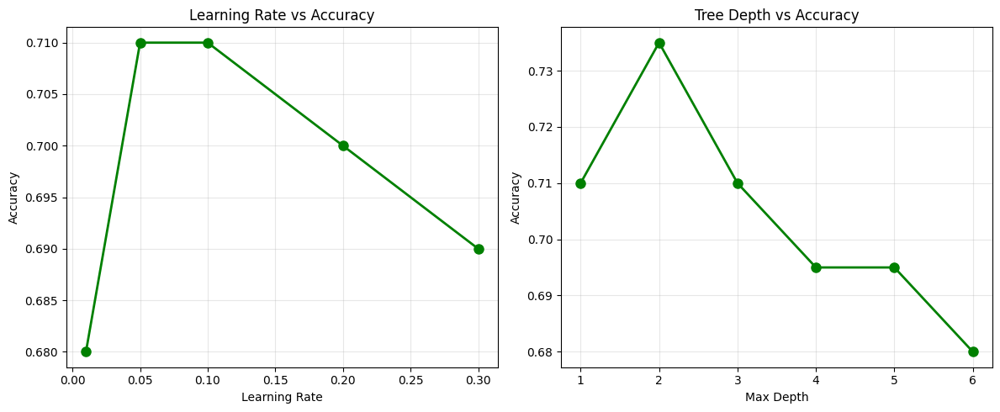

In [ ]:
# Learning rate analysis
learning_rates = [0.01, 0.05, 0.1, 0.2, 0.3]
lr_results = []

for lr in learning_rates:
    model = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=lr,
        max_depth=3,
        random_state=42
    )
    model.fit(X_train, y_train)
    accuracy = model.score(X_test, y_test)
    lr_results.append(accuracy)

# Max depth analysis
max_depths = [1, 2, 3, 4, 5, 6]
depth_results = []

for depth in max_depths:
    model = GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=depth,
        random_state=42
    )
    model.fit(X_train, y_train)
    accuracy = model.score(X_test, y_test)
    depth_results.append(accuracy)

# Visualize hyperparameter effects
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(learning_rates, lr_results, 'go-', linewidth=2, markersize=8)
plt.xlabel('Learning Rate')
plt.ylabel('Accuracy')
plt.title('Learning Rate vs Accuracy')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(max_depths, depth_results, 'go-', linewidth=2, markersize=8)
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.title('Tree Depth vs Accuracy')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

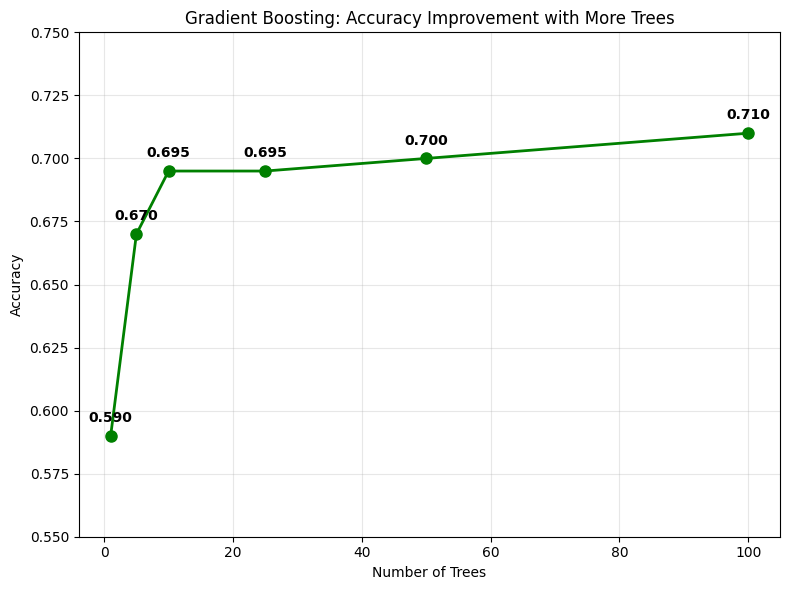

In [ ]:
# Use Gradient Boosting for detailed analysis
gb_model = models['Gradient Boosting']

# Visualize how accuracy improves with more trees
n_trees_to_show = [1, 5, 10, 25, 50, 100]
improvement_data = []

for n_trees in n_trees_to_show:
    temp_model = GradientBoostingClassifier(
        n_estimators=n_trees,
        learning_rate=0.1,
        max_depth=3,
        random_state=42
    )
    temp_model.fit(X_train, y_train)
    accuracy = temp_model.score(X_test, y_test)
    improvement_data.append(accuracy)

# Plot improvement over trees
plt.figure(figsize=(8, 6))
plt.plot(n_trees_to_show, improvement_data, 'go-', linewidth=2, markersize=8)
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.title('Gradient Boosting: Accuracy Improvement with More Trees')
plt.ylim(0.55, 0.75)  # Set larger y-axis range
plt.grid(True, alpha=0.3)

# Add accuracy values as labels
for x, y in zip(n_trees_to_show, improvement_data):
    plt.annotate(f'{y:.3f}', (x, y), textcoords="offset points", 
                xytext=(0,10), ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

Simple Decision Tree Accuracy: 0.675


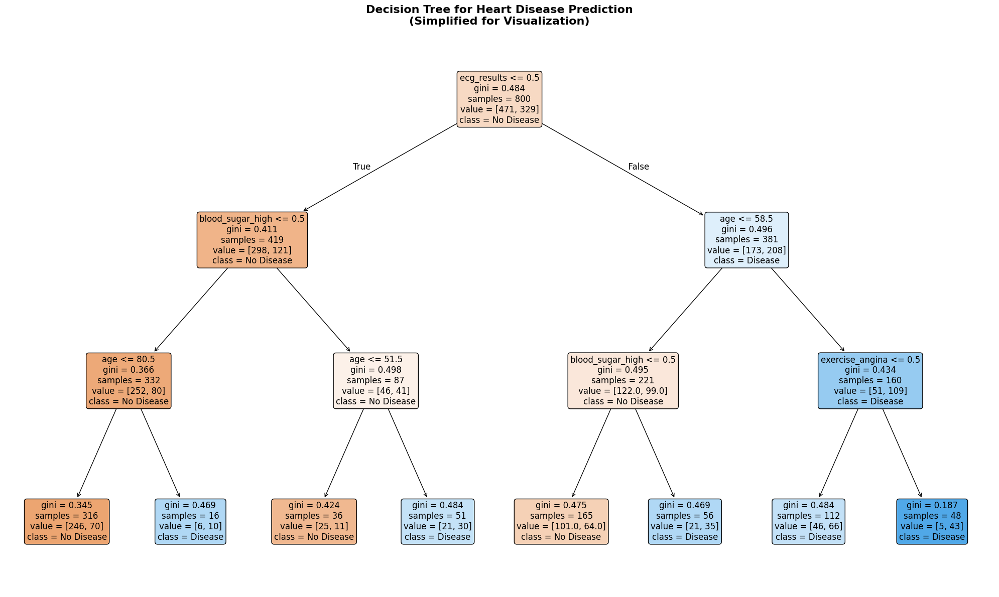

In [ ]:
# Prepare data for modeling
X = df.drop('heart_disease', axis=1)
y = df['heart_disease']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y # 'Stratify' ensures balanced classes in train/test split
)

# Create a simple decision tree with three levels (intentionally shallow for visualization)

tree_levels = 3

tree_simple = DecisionTreeClassifier(
    max_depth=tree_levels,  # Limit depth for clear visualization
    min_samples_split=20,  # Require at least 20 samples to split
    random_state=42
)

# Fit the tree
tree_simple.fit(X_train, y_train)

# Make predictions
y_pred = tree_simple.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print(f"Simple Decision Tree Accuracy: {accuracy:.3f}")

# Visualize the decision tree
plt.figure(figsize=(20, 12))
plot_tree(
    tree_simple, 
    feature_names=X.columns,
    class_names=['No Disease', 'Disease'],
    filled=True,
    rounded=True,
    fontsize=12
)
plt.title('Decision Tree for Heart Disease Prediction\n(Simplified for Visualization)', 
          fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


Minimal Decision Tree Accuracy: 0.700


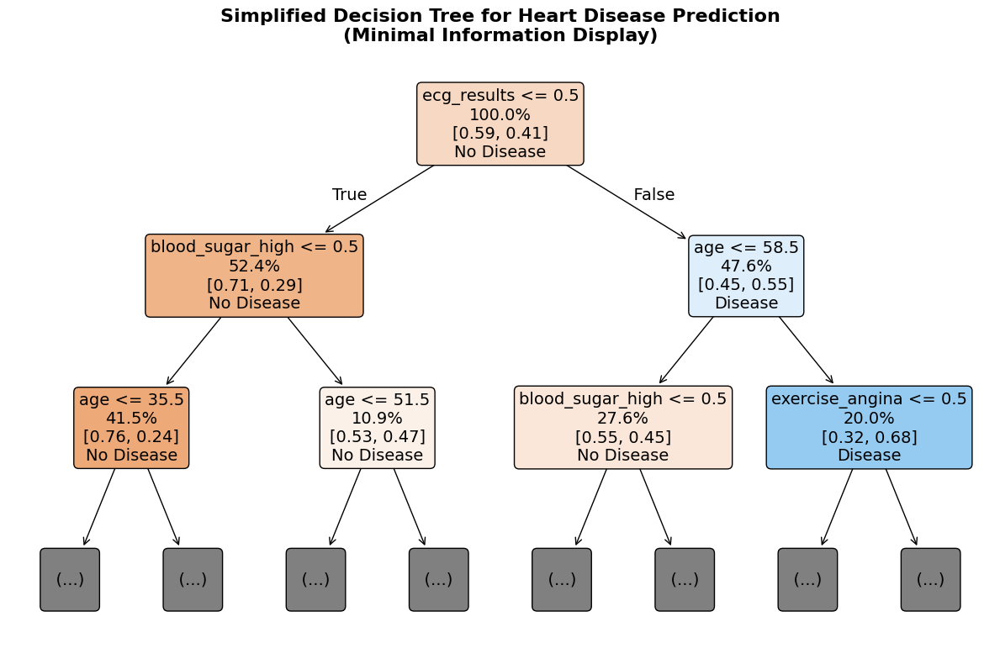

In [ ]:
# Prepare data for modeling
X = df.drop('heart_disease', axis=1)
y = df['heart_disease']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y # 'Stratify' ensures balanced classes in train/test split
)

# Create an even simpler decision tree with minimal information
tree_minimal = DecisionTreeClassifier(
    #max_depth=3,  # Even shallower for cleaner visualization
    min_samples_split=50,  # Higher threshold for splitting
    min_samples_leaf=25,   # Minimum samples in leaf nodes
    random_state=42
)

# Fit the minimal tree
tree_minimal.fit(X_train, y_train)

# Make predictions
y_pred_minimal = tree_minimal.predict(X_test)
accuracy_minimal = accuracy_score(y_test, y_pred_minimal)

print(f"Minimal Decision Tree Accuracy: {accuracy_minimal:.3f}")

# Visualize the minimal decision tree with less information
plt.figure(figsize=(12, 8))
plot_tree(
    tree_minimal, 
    max_depth=2,  # Limit depth for clarity
    feature_names=X.columns,
    class_names=['No Disease', 'Disease'],
    label='none',
    filled=True,
    rounded=True,
    fontsize=14,
    # Reduce information shown
    proportion=True,  # Show proportions instead of raw counts
    impurity=False,   # Hide gini impurity values
    precision=2      # Limit decimal places
)
plt.title('Simplified Decision Tree for Heart Disease Prediction\n(Minimal Information Display)', 
          fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Feature selection

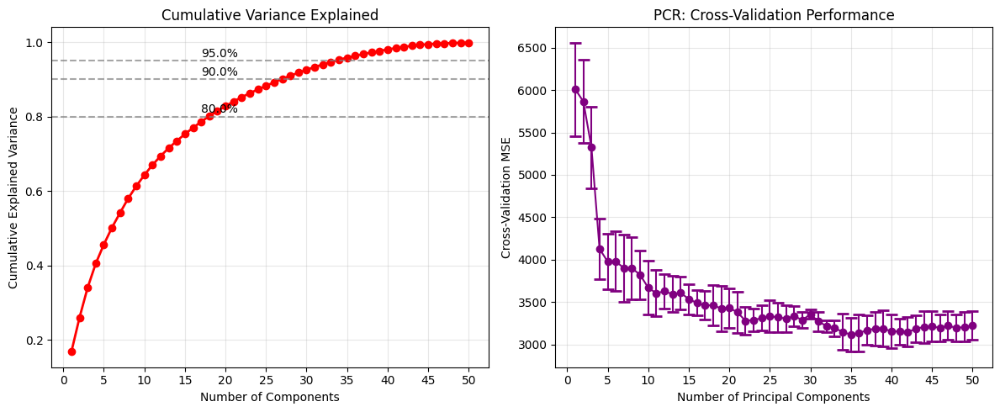

In [ ]:

# Calculate cumulative explained variance
from sklearn.pipeline import Pipeline


cumulative_variance = np.cumsum(pca_full.explained_variance_ratio_)

# Find number of components for different variance thresholds
thresholds = [0.8, 0.9, 0.95, 0.99]
components_needed = {}
for threshold in thresholds:
    n_components = np.argmax(cumulative_variance >= threshold) + 1
    components_needed[threshold] = n_components

# Cross-validation for PCR with different numbers of components
n_components_range = range(1, 51)  # Test 1 to 20 components
cv_scores_pcr = []
cv_stds_pcr = []

for n_comp in n_components_range:
    # Create pipeline: PCA + Linear Regression
    pcr_pipeline = Pipeline([
        ('pca', PCA(n_components=n_comp)),
        ('regression', LinearRegression())
    ])
    
    # 5-fold cross-validation
    scores = cross_val_score(pcr_pipeline, X_scaled, y, 
                           cv=5, scoring='neg_mean_squared_error')
    
    # Convert to positive MSE and store
    cv_scores_pcr.append(-scores.mean())
    cv_stds_pcr.append(scores.std())

# Visualize results
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, 51), cumulative_variance[:50], 'o-', linewidth=2, color='red')
for threshold in [0.8, 0.9, 0.95]:
    plt.axhline(y=threshold, color='gray', linestyle='--', alpha=0.7)
    plt.text(17, threshold+0.01, f'{threshold*100}%', fontsize=10)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Variance Explained')
plt.xticks(range(0, 51, 5))  # Set x-ticks at 0, 5, 10, 15, 20
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.errorbar(n_components_range, cv_scores_pcr, yerr=cv_stds_pcr, 
             marker='o', capsize=5, capthick=2, color='purple')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cross-Validation MSE')
plt.title('PCR: Cross-Validation Performance')
plt.grid(True, alpha=0.3)
plt.xticks(range(0, 51, 5))  # Set x-ticks at 0, 5, 10, 15, 20

plt.tight_layout()
plt.show()

# Find optimal number of components
optimal_n_comp = n_components_range[np.argmin(cv_scores_pcr)]
min_mse = min(cv_scores_pcr)
variance_at_optimal = cumulative_variance[optimal_n_comp-1]

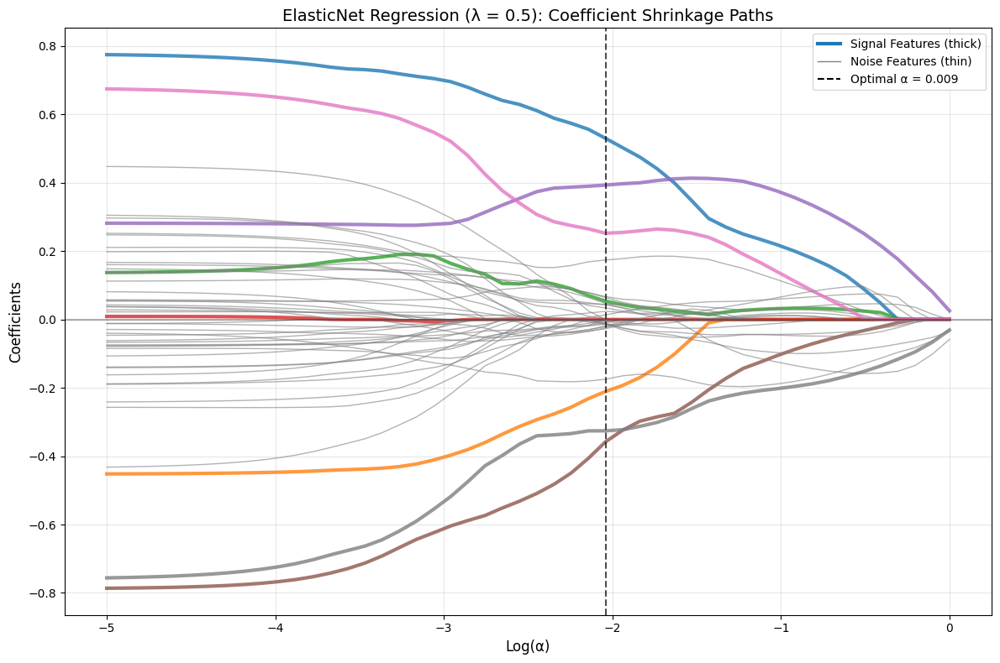

In [ ]:
# Plot coefficient paths for ElasticNet regression
plt.figure(figsize=(12, 8))

# Store coefficients for each alpha
coefficients = []

for alpha in alphas:
    elastic = ElasticNet(alpha=alpha, l1_ratio=lambda_ratio)
    elastic.fit(X_train, y_train)
    coefficients.append(elastic.coef_)

coefficients = np.array(coefficients)

# Plot coefficient paths
signal_features = [0, 2, 5, 8, 12, 15, 20, 25]

for feature_idx in range(n_features):
    if feature_idx in signal_features:
        # Thick lines for signal features
        plt.plot(np.log10(alphas), coefficients[:, feature_idx], 
                linewidth=3, alpha=0.8, 
                label=f'Signal Feature {feature_idx}' if feature_idx in signal_features[:4] else "")
    else:
        # Thin lines for noise features
        plt.plot(np.log10(alphas), coefficients[:, feature_idx], 
                linewidth=1, alpha=0.6, color='gray')

# Add vertical line at optimal alpha
plt.axvline(x=np.log10(optimal_alpha), color='black', linestyle='--', alpha=0.7,
           label=f'Optimal α = {optimal_alpha:.3f}')

# Add horizontal line at zero
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)

plt.xlabel('Log(α)', fontsize=12)
plt.ylabel('Coefficients', fontsize=12)
plt.title('ElasticNet Regression (λ = 0.5): Coefficient Shrinkage Paths', fontsize=14)
plt.grid(True, alpha=0.3)

# Create custom legend
import matplotlib.lines as mlines
signal_line = mlines.Line2D([], [], color='C0', linewidth=3, label='Signal Features (thick)')
noise_line = mlines.Line2D([], [], color='gray', linewidth=1, label='Noise Features (thin)')
optimal_line = mlines.Line2D([], [], color='black', linestyle='--', label=f'Optimal α = {optimal_alpha:.3f}')
plt.legend(handles=[signal_line, noise_line, optimal_line], loc='upper right')

plt.tight_layout()
plt.show()

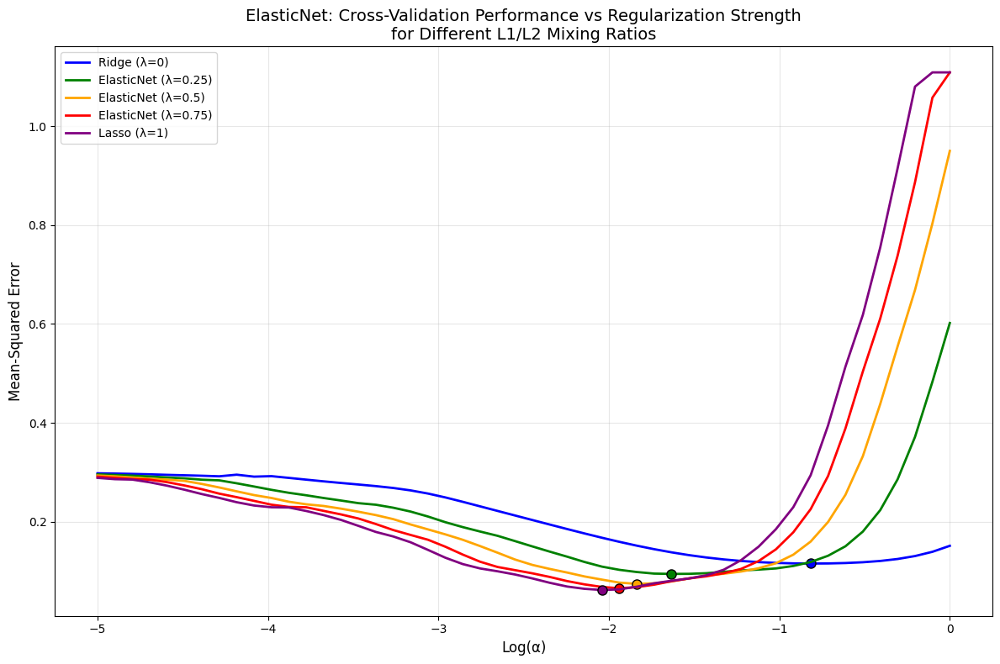

Optimal Results for Each Method:
Method | L1 Ratio | Optimal α | CV MSE
---------------------------------------------
Ridge (λ=0)          |     0.00 |    0.1526 | 0.1156
ElasticNet (λ=0.25)  |     0.25 |    0.0233 | 0.0947
ElasticNet (λ=0.5)   |     0.50 |    0.0146 | 0.0746
ElasticNet (λ=0.75)  |     0.75 |    0.0115 | 0.0657
Lasso (λ=1)          |     1.00 |    0.0091 | 0.0622

Best Overall Performance:
Method: Lasso (λ=1)
L1 Ratio: 1.0
Optimal α: 0.0091
CV MSE: 0.0622


In [ ]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt

# Define range of alpha values and l1_ratio values
alphas = np.logspace(-5, 0, 50)  # From 0.00001 to 1
l1_ratios = [0, 0.25, 0.5, 0.75, 1.0]  # Different mixing ratios

# Colors for different l1_ratios
colors = ['blue', 'green', 'orange', 'red', 'purple']
labels = ['Ridge (λ=0)', 'ElasticNet (λ=0.25)', 'ElasticNet (λ=0.5)', 
          'ElasticNet (λ=0.75)', 'Lasso (λ=1)']

plt.figure(figsize=(12, 8))

# Store optimal results for each l1_ratio
optimal_results = []

for i, l1_ratio in enumerate(l1_ratios):
    cv_scores = []
    
    # Cross-validation for each alpha
    for alpha in alphas:
        elastic = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=2000)
        scores = cross_val_score(elastic, X_train, y_train, 
                               cv=5, scoring='neg_mean_squared_error')
        cv_scores.append(-scores.mean())
    
    cv_scores = np.array(cv_scores)
    
    # Plot line for this l1_ratio
    plt.plot(np.log10(alphas), cv_scores, 
             color=colors[i], linewidth=2, label=labels[i])
    
    # Find optimal alpha for this l1_ratio
    optimal_idx = np.argmin(cv_scores)
    optimal_alpha = alphas[optimal_idx]
    optimal_score = cv_scores[optimal_idx]
    optimal_results.append((l1_ratio, optimal_alpha, optimal_score))
    
    # Mark optimal point
    plt.plot(np.log10(optimal_alpha), optimal_score, 'o', 
             color=colors[i], markersize=8, markeredgecolor='black', markeredgewidth=1)

plt.xlabel('Log(α)', fontsize=12)
plt.ylabel('Mean-Squared Error', fontsize=12)
plt.title('ElasticNet: Cross-Validation Performance vs Regularization Strength\nfor Different L1/L2 Mixing Ratios', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()

# Print optimal results
print("Optimal Results for Each Method:")
print("Method | L1 Ratio | Optimal α | CV MSE")
print("-" * 45)
for l1_ratio, opt_alpha, opt_score in optimal_results:
    method_name = labels[l1_ratios.index(l1_ratio)]
    print(f"{method_name:20s} | {l1_ratio:8.2f} | {opt_alpha:9.4f} | {opt_score:.4f}")

# Find overall best method
best_idx = np.argmin([result[2] for result in optimal_results])
best_method = labels[best_idx]
best_l1_ratio, best_alpha, best_score = optimal_results[best_idx]

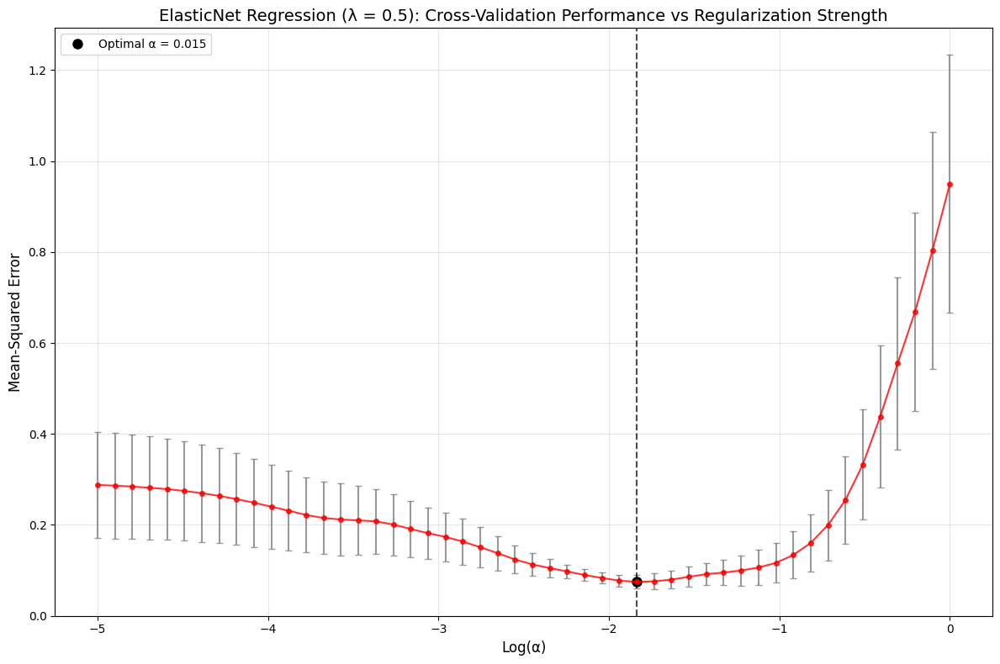

In [ ]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt

# Define range of alpha values (regularization strength)
# Use log scale from very small to very large values
alphas = np.logspace(-5, 0, 50)  # From 0.001 to 1,000
lambda_ratio = 0.5  # Ratio of L1 to L2 regularization

# Store cross-validation scores
cv_scores = []
cv_stds = []

# Cross-validation for each alpha
for alpha in alphas:
    elastic = ElasticNet(alpha=alpha, l1_ratio=lambda_ratio)
    scores = cross_val_score(elastic, X_train, y_train, 
                           cv=5, scoring='neg_mean_squared_error')
    
    # Convert to positive MSE
    cv_scores.append(-scores.mean())
    cv_stds.append(scores.std())

# Convert to numpy arrays for easier manipulation
cv_scores = np.array(cv_scores)
cv_stds = np.array(cv_stds)

# Plot results
plt.figure(figsize=(12, 8))
plt.errorbar(np.log10(alphas), cv_scores, yerr=cv_stds, 
             marker='o', markersize=4, capsize=3, capthick=1,
             color='red', ecolor='gray', alpha=0.8)

# Find optimal alpha
optimal_idx = np.argmin(cv_scores)
optimal_alpha = alphas[optimal_idx]
optimal_score = cv_scores[optimal_idx]

# Mark optimal point
plt.axvline(x=np.log10(optimal_alpha), color='black', linestyle='--', alpha=0.7)
plt.plot(np.log10(optimal_alpha), optimal_score, 'ko', markersize=8, 
         label=f'Optimal α = {optimal_alpha:.3f}')

# Add number of effective degrees of freedom on top
n_features_used = []
for alpha in alphas[::5]:  # Sample every 5th alpha for performance
    elastic_temp = ElasticNet(alpha=alpha, l1_ratio=lambda_ratio)
    elastic_temp.fit(X_train, y_train)
    # Approximate degrees of freedom for elastic regression
    H = X_train @ np.linalg.inv(X_train.T @ X_train + alpha * np.eye(X_train.shape[1])) @ X_train.T
    df = np.trace(H)
    n_features_used.append(int(df))

plt.xlabel('Log(α)', fontsize=12)
plt.ylabel('Mean-Squared Error', fontsize=12)
plt.title('ElasticNet Regression (λ = 0.5): Cross-Validation Performance vs Regularization Strength', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

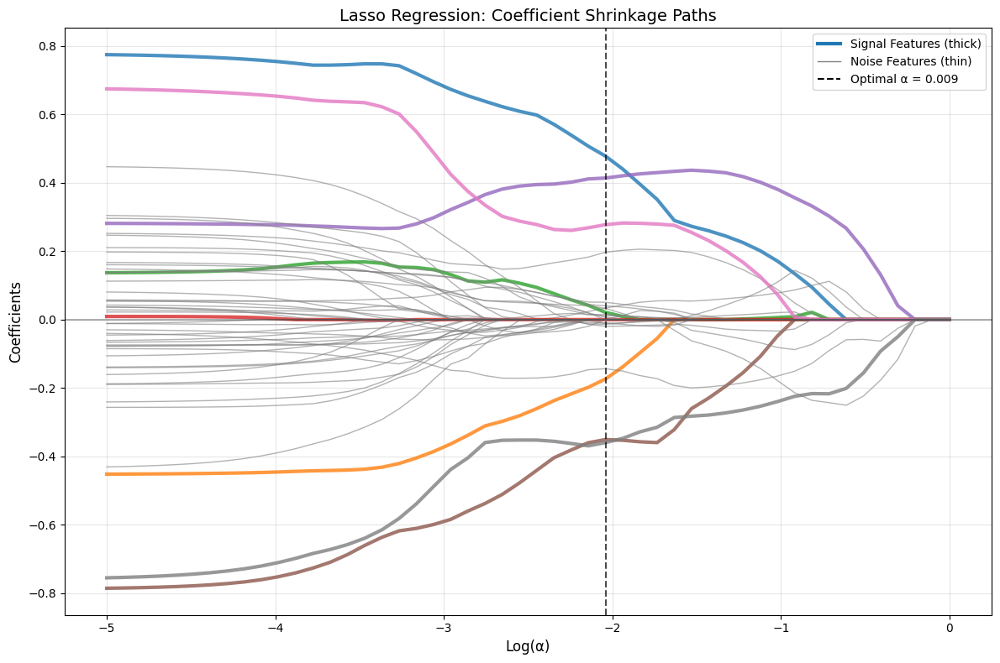

In [ ]:
# Plot coefficient paths for Lasso regression
plt.figure(figsize=(12, 8))

# Store coefficients for each alpha
coefficients = []

for alpha in alphas:
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train, y_train)
    coefficients.append(lasso.coef_)

coefficients = np.array(coefficients)

# Plot coefficient paths
signal_features = [0, 2, 5, 8, 12, 15, 20, 25]

for feature_idx in range(n_features):
    if feature_idx in signal_features:
        # Thick lines for signal features
        plt.plot(np.log10(alphas), coefficients[:, feature_idx], 
                linewidth=3, alpha=0.8, 
                label=f'Signal Feature {feature_idx}' if feature_idx in signal_features[:4] else "")
    else:
        # Thin lines for noise features
        plt.plot(np.log10(alphas), coefficients[:, feature_idx], 
                linewidth=1, alpha=0.6, color='gray')

# Add vertical line at optimal alpha
plt.axvline(x=np.log10(optimal_alpha), color='black', linestyle='--', alpha=0.7,
           label=f'Optimal α = {optimal_alpha:.3f}')

# Add horizontal line at zero
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)

plt.xlabel('Log(α)', fontsize=12)
plt.ylabel('Coefficients', fontsize=12)
plt.title('Lasso Regression: Coefficient Shrinkage Paths', fontsize=14)
plt.grid(True, alpha=0.3)

# Create custom legend
import matplotlib.lines as mlines
signal_line = mlines.Line2D([], [], color='C0', linewidth=3, label='Signal Features (thick)')
noise_line = mlines.Line2D([], [], color='gray', linewidth=1, label='Noise Features (thin)')
optimal_line = mlines.Line2D([], [], color='black', linestyle='--', label=f'Optimal α = {optimal_alpha:.3f}')
plt.legend(handles=[signal_line, noise_line, optimal_line], loc='upper right')

plt.tight_layout()
plt.show()

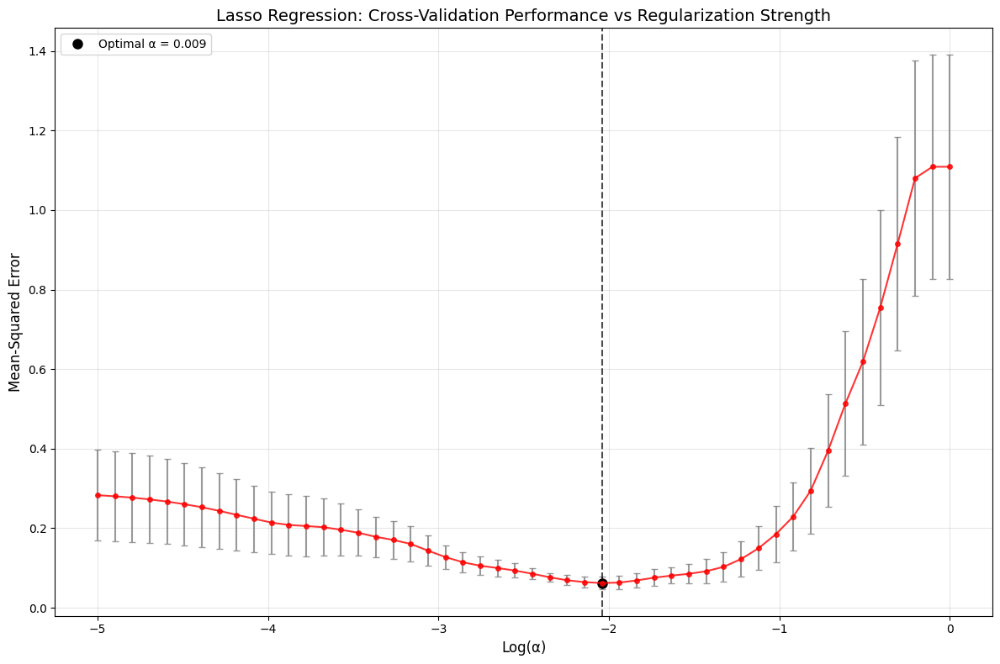

In [ ]:
# Define range of alpha values (regularization strength)
# Use log scale from very small to very large values
alphas = np.logspace(-5, 0, 50)  # From 0.001 to 1,000

# Store cross-validation scores
cv_scores = []
cv_stds = []

# Cross-validation for each alpha
for alpha in alphas:
    lasso = Lasso(alpha=alpha)
    scores = cross_val_score(lasso, X_train, y_train, 
                           cv=5, scoring='neg_mean_squared_error')
    
    # Convert to positive MSE
    cv_scores.append(-scores.mean())
    cv_stds.append(scores.std())

# Convert to numpy arrays for easier manipulation
cv_scores = np.array(cv_scores)
cv_stds = np.array(cv_stds)

# Plot results
plt.figure(figsize=(12, 8))
plt.errorbar(np.log10(alphas), cv_scores, yerr=cv_stds, 
             marker='o', markersize=4, capsize=3, capthick=1,
             color='red', ecolor='gray', alpha=0.8)

# Find optimal alpha
optimal_idx = np.argmin(cv_scores)
optimal_alpha = alphas[optimal_idx]
optimal_score = cv_scores[optimal_idx]

# Mark optimal point
plt.axvline(x=np.log10(optimal_alpha), color='black', linestyle='--', alpha=0.7)
plt.plot(np.log10(optimal_alpha), optimal_score, 'ko', markersize=8, 
         label=f'Optimal α = {optimal_alpha:.3f}')

# Add number of effective degrees of freedom on top
n_features_used = []
for alpha in alphas[::5]:  # Sample every 5th alpha for performance
    lasso_temp = Lasso(alpha=alpha)
    lasso_temp.fit(X_train, y_train)
    # Approximate degrees of freedom for lasso regression
    H = X_train @ np.linalg.inv(X_train.T @ X_train + alpha * np.eye(X_train.shape[1])) @ X_train.T
    df = np.trace(H)
    n_features_used.append(int(df))

plt.xlabel('Log(α)', fontsize=12)
plt.ylabel('Mean-Squared Error', fontsize=12)
plt.title('Lasso Regression: Cross-Validation Performance vs Regularization Strength', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

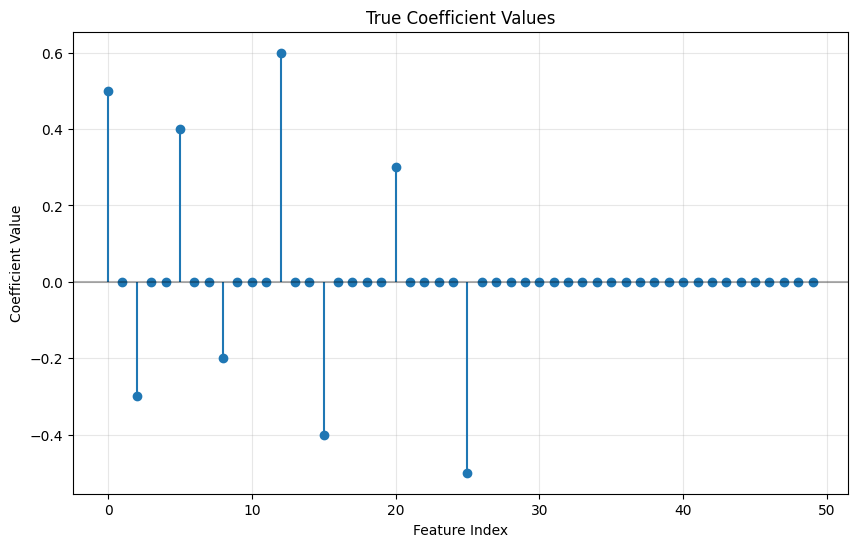

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Set random seed for reproducibility
np.random.seed(42)

# Create a challenging dataset for shrinkage methods
n_samples = 80  # Small sample size
n_features = 50  # High dimensionality (p > n problem)

# Generate correlated features
# Create groups of correlated features to simulate multicollinearity
X = np.random.randn(n_samples, n_features)

# Add correlation structure
for i in range(0, n_features, 5):  # Every 5 features are correlated
    end_idx = min(i+5, n_features)
    group_size = end_idx - i
    # Make features within group correlated
    base_feature = X[:, i]
    for j in range(i+1, end_idx):
        X[:, j] = 0.7 * base_feature + 0.3 * X[:, j]  # 70% correlation

# Create target with sparse signal (only some features matter)
true_coefficients = np.zeros(n_features)
# Only first 8 features have non-zero coefficients
signal_features = [0, 2, 5, 8, 12, 15, 20, 25]
true_coefficients[signal_features] = [0.5, -0.3, 0.4, -0.2, 0.6, -0.4, 0.3, -0.5]

# Generate target with noise
y = X @ true_coefficients + np.random.normal(0, 0.2, n_samples)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.3, random_state=42
)
# Show true coefficients
plt.figure(figsize=(10, 6))
plt.stem(range(n_features), true_coefficients, basefmt=' ')
plt.title('True Coefficient Values')
plt.xlabel('Feature Index')
plt.ylabel('Coefficient Value')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.grid(True, alpha=0.3)
plt.show()

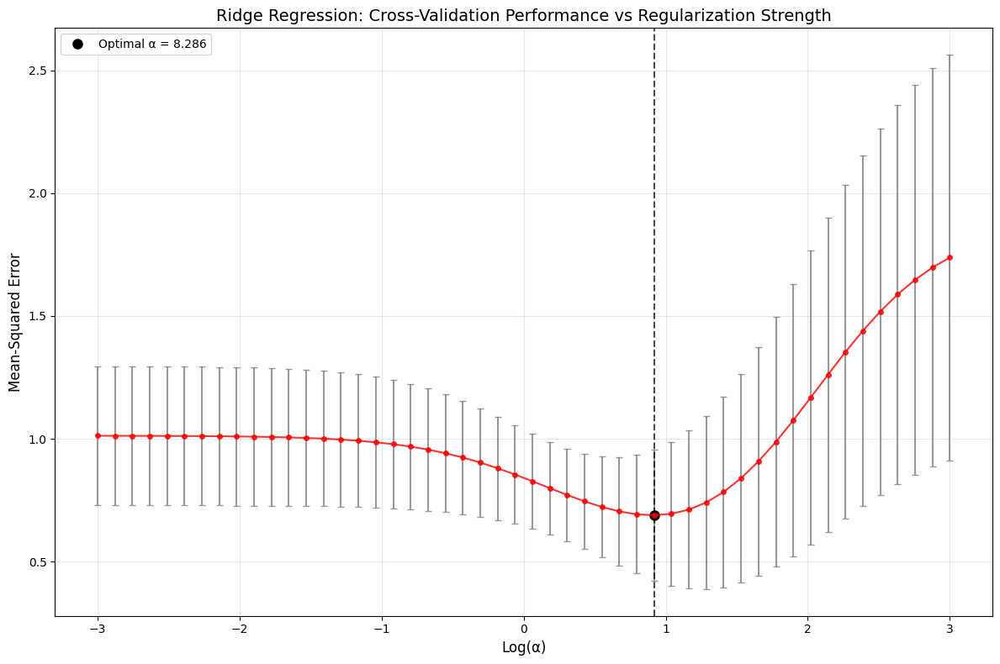

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt

# Define range of alpha values (regularization strength)
# Use log scale from very small to very large values
alphas = np.logspace(-3, 3, 50)  # From 0.001 to 1,000

# Store cross-validation scores
cv_scores = []
cv_stds = []

# Cross-validation for each alpha
for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    scores = cross_val_score(ridge, X, y, 
                           cv=5, scoring='neg_mean_squared_error')
    
    # Convert to positive MSE
    cv_scores.append(-scores.mean())
    cv_stds.append(scores.std())

# Convert to numpy arrays for easier manipulation
cv_scores = np.array(cv_scores)
cv_stds = np.array(cv_stds)

# Plot results
plt.figure(figsize=(12, 8))
plt.errorbar(np.log10(alphas), cv_scores, yerr=cv_stds, 
             marker='o', markersize=4, capsize=3, capthick=1,
             color='red', ecolor='gray', alpha=0.8)

# Find optimal alpha
optimal_idx = np.argmin(cv_scores)
optimal_alpha = alphas[optimal_idx]
optimal_score = cv_scores[optimal_idx]

# Mark optimal point
plt.axvline(x=np.log10(optimal_alpha), color='black', linestyle='--', alpha=0.7)
plt.plot(np.log10(optimal_alpha), optimal_score, 'ko', markersize=8, 
         label=f'Optimal α = {optimal_alpha:.3f}')

# Add text annotations for degrees of freedom

plt.xlabel('Log(α)', fontsize=12)
plt.ylabel('Mean-Squared Error', fontsize=12)
plt.title('Ridge Regression: Cross-Validation Performance vs Regularization Strength', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

Linear Regression with X1 only:
True coefficient: 2
Fitted coefficient: 1.980
Fitted intercept: -0.112


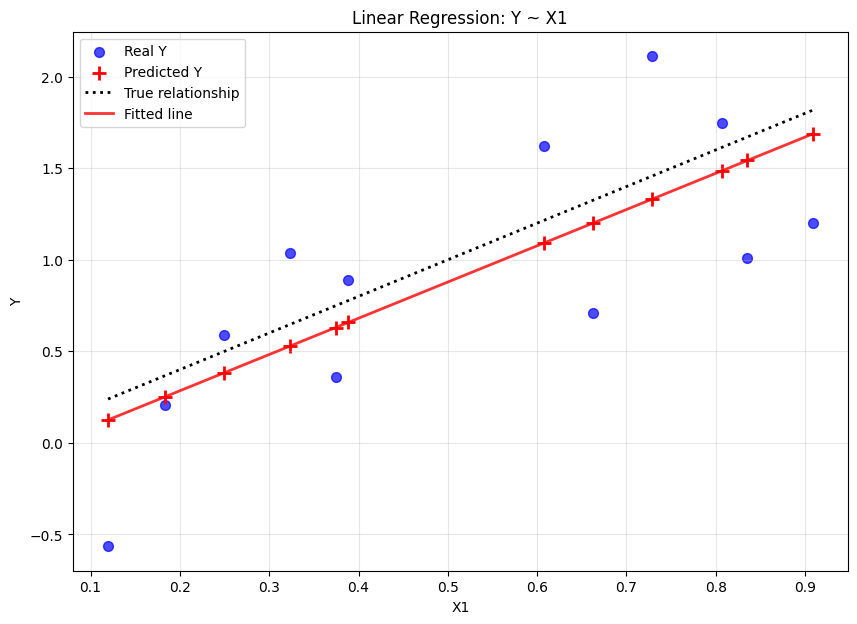


Performance Metrics:
MSE: 0.2190


In [ ]:
# Fit linear regression using only X1
X1 = X[:, 0].reshape(-1, 1)  # Only first feature

# Fit the model: y ~ X1
model_X1 = LinearRegression()
model_X1.fit(X1, y)

# Get predictions
y_pred = model_X1.predict(X1)

# Create scatter plot
plt.figure(figsize=(10, 7))

# Plot real Y values as points
plt.scatter(X[:, 0], y, alpha=0.7, s=50, color='blue', label='Real Y')

# Plot predicted Y values as crosses
plt.scatter(X[:, 0], y_pred, marker='+', s=100, color='red', linewidth=2, label='Predicted Y')

# Plot true relationship as dotted line
x1_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 100)
true_y = true_coefficient * x1_range
plt.plot(x1_range, true_y, 'k:', linewidth=2, label='True relationship')

# Plot fitted line
fitted_y = model_X1.predict(x1_range.reshape(-1, 1))
plt.plot(x1_range, fitted_y, 'r-', linewidth=2, alpha=0.8, label='Fitted line')

plt.xlabel('X1')
plt.ylabel('Y')
plt.title('Linear Regression: Y ~ X1')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Calculate and print performance metrics
mse = mean_squared_error(y, y_pred)

print(f"\nPerformance Metrics:")
print(f"MSE: {mse:.4f}")

Linear Regression with X1 only:
True coefficient: 2
Fitted coefficient: 1.980
Fitted intercept: -0.112


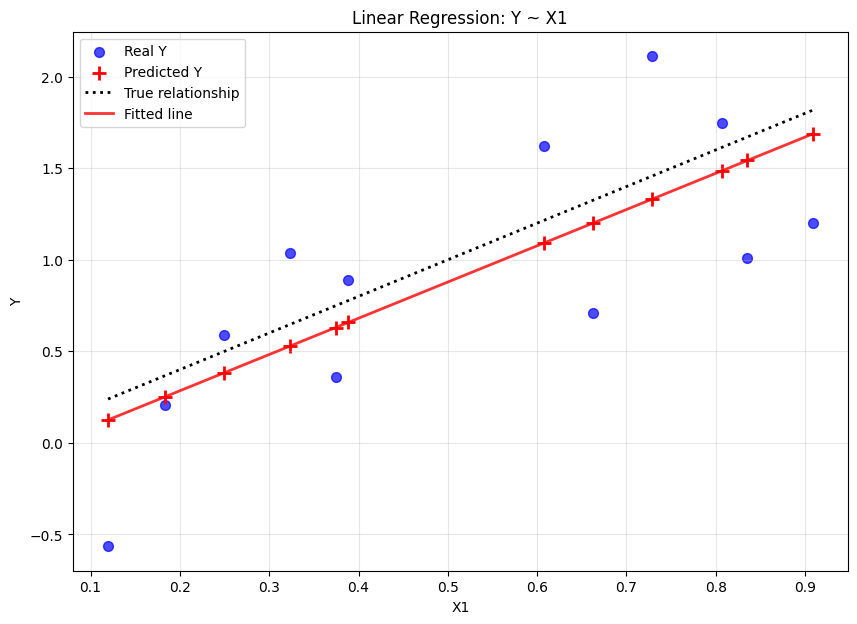


Performance Metrics:
MSE: 0.2190


In [ ]:
# Fit linear regression using only X1
X1 = X[:, 0].reshape(-1, 1)  # Only first feature

# Fit the model: y ~ X1
model_X1 = LinearRegression()
model_X1.fit(X1, y)

# Get predictions
y_pred = model_X1.predict(X1)

# Create scatter plot
plt.figure(figsize=(10, 7))

# Plot real Y values as points
plt.scatter(X[:, 0], y, alpha=0.7, s=50, color='blue', label='Real Y')

# Plot predicted Y values as crosses
plt.scatter(X[:, 0], y_pred, marker='+', s=100, color='red', linewidth=2, label='Predicted Y')

# Plot true relationship as dotted line
x1_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 100)
true_y = true_coefficient * x1_range
plt.plot(x1_range, true_y, 'k:', linewidth=2, label='True relationship')

# Plot fitted line
fitted_y = model_X1.predict(x1_range.reshape(-1, 1))
plt.plot(x1_range, fitted_y, 'r-', linewidth=2, alpha=0.8, label='Fitted line')

plt.xlabel('X1')
plt.ylabel('Y')
plt.title('Linear Regression: Y ~ X1')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Calculate and print performance metrics
mse = mean_squared_error(y, y_pred)

print(f"\nPerformance Metrics:")
print(f"MSE: {mse:.4f}")

<br><br>
# **Finding "Significant" Patterns in Noise**

First we look at a completely random dataset with 50 samples, 1000 features and 1 target variable. So there are no "real" relationships present in the data, however the tools we explored up to now may detect relationships.

We'll perform the following experiment: **test every single feature** for correlation with our target variable. Remember, our data is completely random - there should be NO real relationships.

**What we're testing:**
- Calculate correlation coefficient between each of the 1000 features and the target
- Compute p-values to test if correlations are "statistically significant" (p < 0.05)
- See how many features appear "significant" purely by chance

**The Multiple Testing Problem:**
When we test many hypotheses simultaneously, we expect some to appear significant by pure chance:
- With α = 0.05, we expect 5% of tests to be "significant" even for random data
- 1000 features × 0.05 = **~50 expected "significant" correlations**
- This is the **false discovery** problem in high-dimensional data!

Let's see if this theoretical expectation matches reality...

In [ ]:
# Load our synthetic dataset
df = pd.read_csv('synthetic_highdim_random_dataset.csv')
X = df.drop('target', axis=1)
y = df['target']

print(f"Dataset shape: {df.shape}")
print(f"Samples: {X.shape[0]}, Features: {X.shape[1]}")
print(f"Ratio: {X.shape[1]/X.shape[0]:.1f} features per sample!")
print(f"\nRemember: ALL data is completely random - no true relationships exist!")

Dataset shape: (50, 1001)
Samples: 50, Features: 1000
Ratio: 20.0 features per sample!

⚠️  Remember: ALL data is completely random - no true relationships exist!


🎲 RANDOM DATA ANALYSIS:
Features with p < 0.05: 45 out of 1000
Expected by chance: ~50
Strongest 'significant' correlation: 0.4680


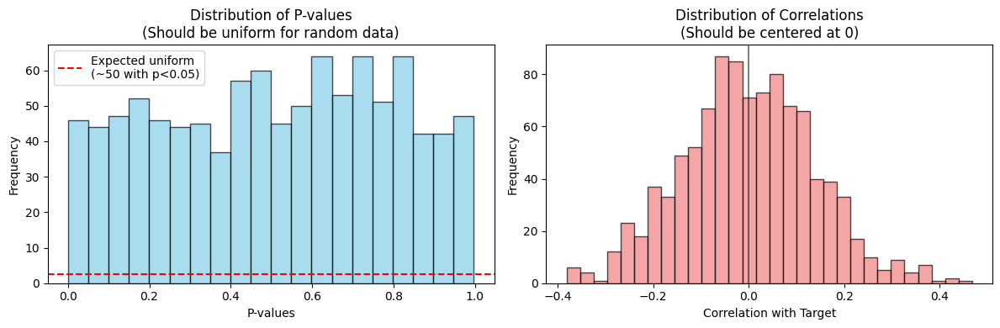

In [ ]:
# Calculate correlations between ALL features and target
correlations = []
p_values = []

for feature in X.columns:
    corr, p_val = stats.pearsonr(X[feature], y)
    correlations.append(corr)
    p_values.append(p_val)

corr_df = pd.DataFrame({
    'feature': X.columns,
    'correlation': correlations,
    'p_value': p_values,
    'abs_correlation': np.abs(correlations)
}).sort_values('abs_correlation', ascending=False)

# Find "significant" correlations
significant = corr_df[corr_df['p_value'] < 0.05]

print(f"🎲 RANDOM DATA ANALYSIS:")
print(f"Features with p < 0.05: {len(significant)} out of {len(corr_df)}")
print(f"Expected by chance: ~{len(corr_df) * 0.05:.0f}")
print(f"Strongest 'significant' correlation: {significant.iloc[0]['correlation']:.4f}")

# Visualize the distribution of p-values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.hist(p_values, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
plt.axhline(y=len(p_values)*0.05/20, color='red', linestyle='--', 
            label=f'Expected uniform\n(~{len(p_values)*0.05:.0f} with p<0.05)')
plt.xlabel('P-values')
plt.ylabel('Frequency')
plt.title('Distribution of P-values\n(Should be uniform for random data)')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(correlations, bins=30, alpha=0.7, color='lightcoral', edgecolor='black')
plt.axvline(x=0, color='black', linestyle='-', alpha=0.5)
plt.xlabel('Correlation with Target')
plt.ylabel('Frequency')
plt.title('Distribution of Correlations\n(Should be centered at 0)')

plt.tight_layout()
plt.show()

### Results:
- **45 features with p < 0.05** out of 1000 total features
- **Strongest "significant" correlation: 0.47** - quite convincing looking!

### Left Plot - P-value Distribution:
- **Uniform distribution**: P-values are spread evenly from 0 to 1 (as expected for random data)
- **Red dashed line**: Shows expected frequency for each bin under uniform distribution
- **The trap**: Even random data produces some low p-values that appear "significant"!

### Right Plot - Correlation Distribution:
- **Normal distribution centered at 0**: Exactly what we expect for random correlations
- **No real relationships**: The bell curve confirms no systematic patterns exist
- **Random scatter**: Some correlations appear strong (like our 0.47!) but are pure noise

### Key Insights:
1. **Theory matches reality**: We got 45 vs expected ~50 - statistical theory works!
2. **0.47 correlation looks impressive** but it's completely meaningless random noise
3. **Without multiple testing correction**, we'd wrongly conclude these 45 features are important
4. **This is why high-dimensional data is dangerous** - noise can easily masquerade as signal

**The Bottom Line:** In high dimensions with small samples, **random chance can create convincing but false patterns**. Let's see what we can do against this now!

---
<br><br>
# **Overfitting to Noise**

Now we will demonstrate how Linear Models can overfit to noise if we have a lot of features and not enough samples for the model to learn the actual relevant relationships. For this we use a new generated dataset that has 10 relevant features that have a relationship with the target value and 990 features that are just random noise. 

**The Experiment:**
1. Start with only the **10 true signal features** (best case scenario)
2. Progressively add noise features: 10 → 50 → 100 → 200 → 500 → 1000 total features
3. Train linear regression on each feature set using 90% of data
4. Test on remaining 10% to measure generalization
5. Track how training vs test performance changes as we add noise

**Expected Results:**
- **Training error should decrease** (or stay low) as we add features - more parameters = better fit to training data
- **Test error should increase** as noise features confuse the model and cause overfitting
- **The gap between train/test** will grow dramatically as we move from 10 → 1000 features

This demonstrates why **"more features = better"** is a dangerous assumption in machine learning!

Training samples: 45
Test samples: 5

Testing with 10 features...
  Train MSE: 0.0077, Test MSE: 0.0126
  Train R²: 1.0000, Test R²: 1.0000

Testing with 50 features...
  Train MSE: 0.0000, Test MSE: 2978.4471
  Train R²: 1.0000, Test R²: 0.8032

Testing with 100 features...
  Train MSE: 0.0000, Test MSE: 3656.2755
  Train R²: 1.0000, Test R²: 0.7585

Testing with 200 features...
  Train MSE: 0.0000, Test MSE: 16111.7193
  Train R²: 1.0000, Test R²: -0.0644

Testing with 500 features...
  Train MSE: 0.0000, Test MSE: 16835.3089
  Train R²: 1.0000, Test R²: -0.1122

Testing with 1000 features...
  Train MSE: 0.0000, Test MSE: 20584.0532
  Train R²: 1.0000, Test R²: -0.3598


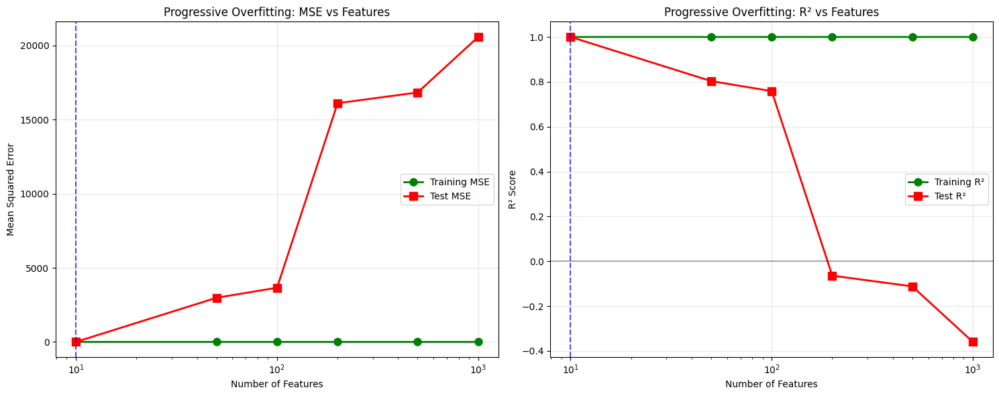

In [ ]:
# Load the mixed signal-noise dataset
df = pd.read_csv('synthetic_highdim_signal_dataset.csv')

X = df.drop('target', axis=1)
y = df['target']

# Split into train/test (90%/10%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

print(f"Training samples: {len(X_train)}")
print(f"Test samples: {len(X_test)}")

# Define progressive feature sets to test
feature_counts = [10, 50, 100, 200, 500, 1000]
train_errors = []
test_errors = []
train_r2_scores = []
test_r2_scores = []

for n_features in feature_counts:
    print(f"\nTesting with {n_features} features...")
    
    # Select features: first 10 are signal, rest are noise
    selected_features = X.columns[:n_features]
    X_train_subset = X_train[selected_features]
    X_test_subset = X_test[selected_features]
    
    # Fit linear regression
    lr = LinearRegression()
    lr.fit(X_train_subset, y_train)
    
    # Predictions
    train_pred = lr.predict(X_train_subset)
    test_pred = lr.predict(X_test_subset)
    
    # Calculate errors
    train_mse = mean_squared_error(y_train, train_pred)
    test_mse = mean_squared_error(y_test, test_pred)
    train_r2 = lr.score(X_train_subset, y_train)
    test_r2 = lr.score(X_test_subset, y_test)
    
    train_errors.append(train_mse)
    test_errors.append(test_mse)
    train_r2_scores.append(train_r2)
    test_r2_scores.append(test_r2)
    
    print(f"  Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")
    print(f"  Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}")

# Create visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: MSE vs number of features
ax1.plot(feature_counts, train_errors, 'o-', linewidth=2, markersize=8, 
         color='green', label='Training MSE')
ax1.plot(feature_counts, test_errors, 's-', linewidth=2, markersize=8, 
         color='red', label='Test MSE')
ax1.set_xlabel('Number of Features')
ax1.set_ylabel('Mean Squared Error')
ax1.set_title('Progressive Overfitting: MSE vs Features')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_xscale('log')
ax1.axvline(x=10, color='blue', linestyle='--', alpha=0.7, label='True signal features')

# Plot 2: R² vs number of features
ax2.plot(feature_counts, train_r2_scores, 'o-', linewidth=2, markersize=8, 
         color='green', label='Training R²')
ax2.plot(feature_counts, test_r2_scores, 's-', linewidth=2, markersize=8, 
         color='red', label='Test R²')
ax2.set_xlabel('Number of Features')
ax2.set_ylabel('R² Score')
ax2.set_title('Progressive Overfitting: R² vs Features')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.set_xscale('log')
ax2.axvline(x=10, color='blue', linestyle='--', alpha=0.7, label='True signal features')
ax2.axhline(y=0, color='black', linestyle='-', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# Load our mixed signal-noise dataset
df = pd.read_csv('synthetic_highdim_signal_dataset.csv')
X = df.drop('target', axis=1)
y = df['target']

# Split and standardize (crucial for regularization!)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("🎯 RIDGE REGRESSION ANALYSIS")
print("=" * 50)
print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"True signal features: 10 (signal_00 to signal_09)")
print(f"Noise features: 990 (noise_000 to noise_989)")

# Test different alpha values
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
train_mse = []
test_mse = []
n_features_used = []

for alpha in alphas:
    # Fit Ridge regression
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_scaled, y_train)
    
    # Evaluate performance with MSE
    train_pred = ridge.predict(X_train_scaled)
    test_pred = ridge.predict(X_test_scaled)
    
    train_error = mean_squared_error(y_train, train_pred)
    test_error = mean_squared_error(y_test, test_pred)
    
    train_mse.append(train_error)
    test_mse.append(test_error)
    
    # Count "effectively used" features (coefficient magnitude > 0.01)
    n_effective = np.sum(np.abs(ridge.coef_) > 0.01)
    n_features_used.append(n_effective)
    
    print(f"α = {alpha:6.3f}: Train MSE = {train_error:.4f}, Test MSE = {test_error:.4f}, "
          f"Features |coef| > 0.01: {n_effective}")

# Find optimal alpha using cross-validation
ridge_cv = RidgeCV(alphas=np.logspace(-3, 3, 50), cv=5)
ridge_cv.fit(X_train_scaled, y_train)
optimal_alpha = ridge_cv.alpha_

# Calculate test MSE for optimal alpha
optimal_test_pred = ridge_cv.predict(X_test_scaled)
optimal_test_mse = mean_squared_error(y_test, optimal_test_pred)

print(f"\n🎯 Optimal α (via CV): {optimal_alpha:.3f}")
print(f"Test MSE with optimal α: {optimal_test_mse:.4f}")

🎯 RIDGE REGRESSION ANALYSIS
Dataset: 50 samples, 1000 features
True signal features: 10 (signal_00 to signal_09)
Noise features: 990 (noise_000 to noise_989)
α =  0.001: Train MSE = 0.0000, Test MSE = 28505.2296, Features |coef| > 0.01: 994
α =  0.010: Train MSE = 0.0000, Test MSE = 28505.2143, Features |coef| > 0.01: 994
α =  0.100: Train MSE = 0.0002, Test MSE = 28505.0610, Features |coef| > 0.01: 994
α =  1.000: Train MSE = 0.0189, Test MSE = 28503.5301, Features |coef| > 0.01: 994
α = 10.000: Train MSE = 1.8547, Test MSE = 28488.3957, Features |coef| > 0.01: 995
α = 100.000: Train MSE = 157.0500, Test MSE = 28352.7669, Features |coef| > 0.01: 992
α = 1000.000: Train MSE = 4949.0798, Test MSE = 27732.9268, Features |coef| > 0.01: 980

🎯 Optimal α (via CV): 0.001
Test MSE with optimal α: 28505.2296


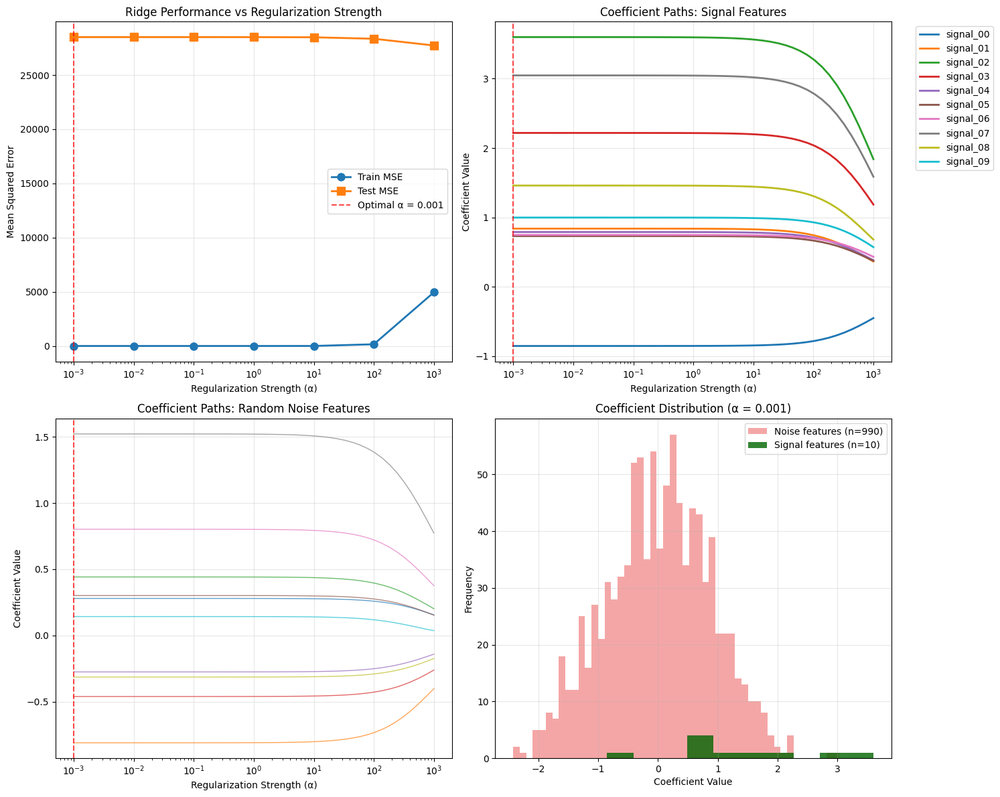

In [ ]:
# Visualize Ridge performance across alpha values
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

# Plot 1: Performance vs Alpha (now using MSE)
ax1.semilogx(alphas, train_mse, 'o-', label='Train MSE', linewidth=2, markersize=8)
ax1.semilogx(alphas, test_mse, 's-', label='Test MSE', linewidth=2, markersize=8)
ax1.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7, label=f'Optimal α = {optimal_alpha:.3f}')
ax1.set_xlabel('Regularization Strength (α)')
ax1.set_ylabel('Mean Squared Error')
ax1.set_title('Ridge Performance vs Regularization Strength')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Coefficient paths for signal features
ridge_coefs = []
alpha_range = np.logspace(-3, 3, 50)
for alpha in alpha_range:
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_scaled, y_train)
    ridge_coefs.append(ridge.coef_)

ridge_coefs = np.array(ridge_coefs)

# Plot coefficient paths for first 10 features (true signals)
for i in range(10):
    ax2.semilogx(alpha_range, ridge_coefs[:, i], linewidth=2, label=f'signal_{i:02d}')
ax2.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax2.set_xlabel('Regularization Strength (α)')
ax2.set_ylabel('Coefficient Value')
ax2.set_title('Coefficient Paths: Signal Features')
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.grid(True, alpha=0.3)

# Plot 3: Sample of noise feature coefficients
noise_indices = np.random.choice(range(10, 1000), 10, replace=False)
for i in noise_indices:
    ax3.semilogx(alpha_range, ridge_coefs[:, i], linewidth=1, alpha=0.7)
ax3.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax3.set_xlabel('Regularization Strength (α)')
ax3.set_ylabel('Coefficient Value')
ax3.set_title('Coefficient Paths: Random Noise Features')
ax3.grid(True, alpha=0.3)

# Plot 4: Distribution of coefficients at optimal alpha
ridge_optimal = Ridge(alpha=optimal_alpha)
ridge_optimal.fit(X_train_scaled, y_train)
signal_coefs = ridge_optimal.coef_[:10]
noise_coefs = ridge_optimal.coef_[10:]

ax4.hist(noise_coefs, bins=50, alpha=0.7, label=f'Noise features (n={len(noise_coefs)})', color='lightcoral')
ax4.hist(signal_coefs, bins=10, alpha=0.8, label=f'Signal features (n={len(signal_coefs)})', color='darkgreen')
ax4.set_xlabel('Coefficient Value')
ax4.set_ylabel('Frequency')
ax4.set_title(f'Coefficient Distribution (α = {optimal_alpha:.3f})')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# Use the same train/test split as Ridge for fair comparison
print("🎯 LASSO REGRESSION ANALYSIS")
print("=" * 50)
print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"True signal features: 10 (signal_00 to signal_09)")
print(f"Noise features: 990 (noise_000 to noise_989)")

# Test different alpha values
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
train_mse = []
test_mse = []
n_features_selected = []

for alpha in alphas:
    # Fit LASSO regression
    lasso = Lasso(alpha=alpha, max_iter=2000)
    lasso.fit(X_train_scaled, y_train)
    
    # Evaluate performance with MSE
    train_pred = lasso.predict(X_train_scaled)
    test_pred = lasso.predict(X_test_scaled)
    
    train_error = mean_squared_error(y_train, train_pred)
    test_error = mean_squared_error(y_test, test_pred)
    
    train_mse.append(train_error)
    test_mse.append(test_error)
    
    # Count features with non-zero coefficients
    n_selected = np.sum(lasso.coef_ != 0)
    n_features_selected.append(n_selected)
    
    print(f"α = {alpha:6.3f}: Train MSE = {train_error:.4f}, Test MSE = {test_error:.4f}, "
          f"Features selected: {n_selected}")

# Find optimal alpha using cross-validation
lasso_cv = LassoCV(alphas=np.logspace(-3, 3, 50), cv=5, max_iter=2000)
lasso_cv.fit(X_train_scaled, y_train)
optimal_alpha = lasso_cv.alpha_

# Calculate test MSE for optimal alpha
optimal_test_pred = lasso_cv.predict(X_test_scaled)
optimal_test_mse = mean_squared_error(y_test, optimal_test_pred)

print(f"\n🎯 Optimal α (via CV): {optimal_alpha:.3f}")
print(f"Test MSE with optimal α: {optimal_test_mse:.4f}")
print(f"Features selected with optimal α: {np.sum(lasso_cv.coef_ != 0)}")

🎯 LASSO REGRESSION ANALYSIS
Dataset: 50 samples, 1000 features
True signal features: 10 (signal_00 to signal_09)
Noise features: 990 (noise_000 to noise_989)
α =  0.001: Train MSE = 0.0000, Test MSE = 1995.6739, Features selected: 642
α =  0.010: Train MSE = 0.0009, Test MSE = 964.9047, Features selected: 80
α =  0.100: Train MSE = 0.0871, Test MSE = 1951.2941, Features selected: 50
α =  1.000: Train MSE = 8.1682, Test MSE = 2114.2809, Features selected: 33
α = 10.000: Train MSE = 650.7709, Test MSE = 3228.6200, Features selected: 17
α = 100.000: Train MSE = 21650.4004, Test MSE = 27185.7159, Features selected: 0
α = 1000.000: Train MSE = 21650.4004, Test MSE = 27185.7159, Features selected: 0

🎯 Optimal α (via CV): 8.286
Test MSE with optimal α: 2866.7011
Features selected with optimal α: 19


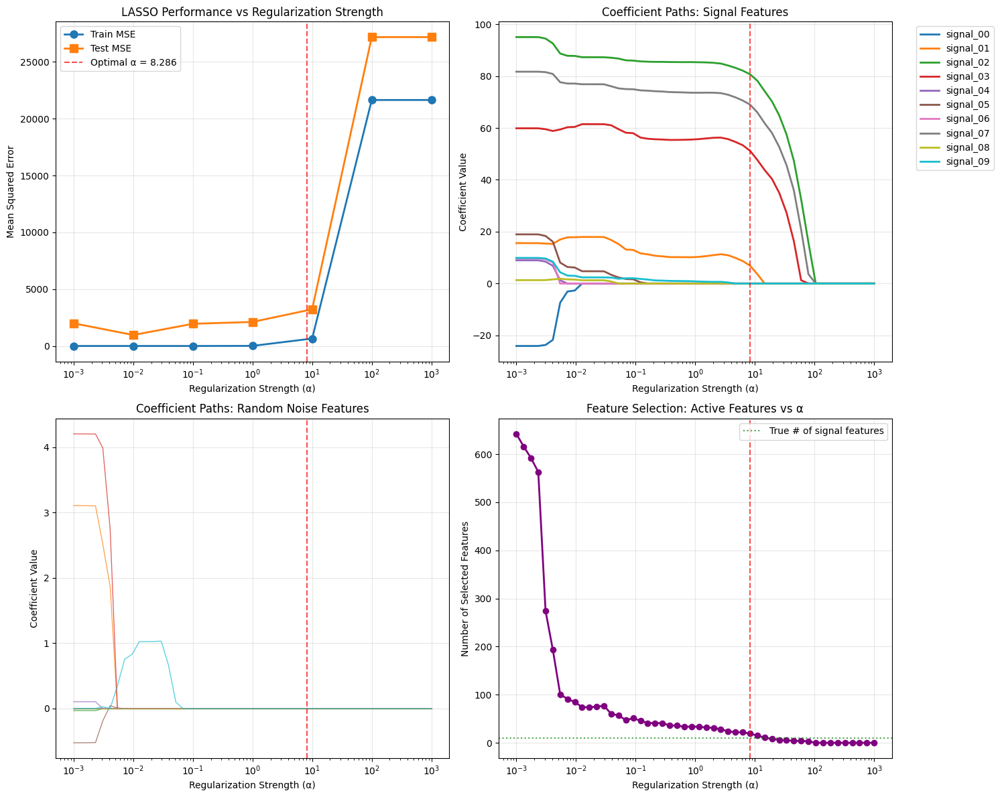


🔍 FEATURE SELECTION ANALYSIS (α = 8.286):
Total features selected: 19
Signal features selected: 4 / 10
Noise features selected: 15 / 990
Signal features found: ['signal_01', 'signal_02', 'signal_03', 'signal_07']
First 10 noise features selected: ['noise_090', 'noise_128', 'noise_192', 'noise_273', 'noise_381', 'noise_412', 'noise_448', 'noise_450', 'noise_570', 'noise_578']...


In [ ]:
# Visualize LASSO performance across alpha values
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

# Plot 1: Performance vs Alpha (MSE)
ax1.semilogx(alphas, train_mse, 'o-', label='Train MSE', linewidth=2, markersize=8)
ax1.semilogx(alphas, test_mse, 's-', label='Test MSE', linewidth=2, markersize=8)
ax1.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7, label=f'Optimal α = {optimal_alpha:.3f}')
ax1.set_xlabel('Regularization Strength (α)')
ax1.set_ylabel('Mean Squared Error')
ax1.set_title('LASSO Performance vs Regularization Strength')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Coefficient paths for signal features
lasso_coefs = []
alpha_range = np.logspace(-3, 3, 50)
for alpha in alpha_range:
    lasso = Lasso(alpha=alpha, max_iter=2000)
    lasso.fit(X_train_scaled, y_train)
    lasso_coefs.append(lasso.coef_)

lasso_coefs = np.array(lasso_coefs)

# Plot coefficient paths for first 10 features (true signals)
for i in range(10):
    ax2.semilogx(alpha_range, lasso_coefs[:, i], linewidth=2, label=f'signal_{i:02d}')
ax2.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax2.set_xlabel('Regularization Strength (α)')
ax2.set_ylabel('Coefficient Value')
ax2.set_title('Coefficient Paths: Signal Features')
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.grid(True, alpha=0.3)

# Plot 3: Sample of noise feature coefficients
noise_indices = np.random.choice(range(10, 1000), 10, replace=False)
for i in noise_indices:
    ax3.semilogx(alpha_range, lasso_coefs[:, i], linewidth=1, alpha=0.7)
ax3.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax3.set_xlabel('Regularization Strength (α)')
ax3.set_ylabel('Coefficient Value')
ax3.set_title('Coefficient Paths: Random Noise Features')
ax3.grid(True, alpha=0.3)

# Plot 4: Number of selected features vs Alpha
n_selected_path = [np.sum(coefs != 0) for coefs in lasso_coefs]
ax4.semilogx(alpha_range, n_selected_path, 'o-', linewidth=2, markersize=6, color='purple')
ax4.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax4.axhline(y=10, color='green', linestyle=':', alpha=0.7, label='True # of signal features')
ax4.set_xlabel('Regularization Strength (α)')
ax4.set_ylabel('Number of Selected Features')
ax4.set_title('Feature Selection: Active Features vs α')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Analyze which features were selected at optimal alpha
lasso_optimal = Lasso(alpha=optimal_alpha, max_iter=2000)
lasso_optimal.fit(X_train_scaled, y_train)

selected_features = X.columns[lasso_optimal.coef_ != 0]
signal_features_selected = [f for f in selected_features if f.startswith('signal_')]
noise_features_selected = [f for f in selected_features if f.startswith('noise_')]

print(f"\n🔍 FEATURE SELECTION ANALYSIS (α = {optimal_alpha:.3f}):")
print("=" * 60)
print(f"Total features selected: {len(selected_features)}")
print(f"Signal features selected: {len(signal_features_selected)} / 10")
print(f"Noise features selected: {len(noise_features_selected)} / 990")
print(f"Signal features found: {signal_features_selected}")
if len(noise_features_selected) <= 10:
    print(f"Noise features selected: {noise_features_selected}")
else:
    print(f"First 10 noise features selected: {noise_features_selected[:10]}...")

In [ ]:
# Use the same train/test split for fair comparison
print("🎯 ELASTIC NET REGRESSION ANALYSIS")
print("=" * 50)
print(f"Dataset: {X.shape[0]} samples, {X.shape[1]} features")
print(f"True signal features: 10 (signal_00 to signal_09)")
print(f"Noise features: 990 (noise_000 to noise_989)")

# Test different alpha values with fixed l1_ratio
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
l1_ratio = 0.5  # Equal mix of L1 and L2
train_mse = []
test_mse = []
n_features_selected = []

print(f"\nTesting with l1_ratio = {l1_ratio} (50% LASSO, 50% Ridge)")
print("-" * 60)

for alpha in alphas:
    # Fit Elastic Net regression
    elastic = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=2000)
    elastic.fit(X_train_scaled, y_train)
    
    # Evaluate performance with MSE
    train_pred = elastic.predict(X_train_scaled)
    test_pred = elastic.predict(X_test_scaled)
    
    train_error = mean_squared_error(y_train, train_pred)
    test_error = mean_squared_error(y_test, test_pred)
    
    train_mse.append(train_error)
    test_mse.append(test_error)
    
    # Count features with non-zero coefficients
    n_selected = np.sum(elastic.coef_ != 0)
    n_features_selected.append(n_selected)
    
    print(f"α = {alpha:6.3f}: Train MSE = {train_error:.4f}, Test MSE = {test_error:.4f}, "
          f"Features selected: {n_selected}")

# Find optimal alpha and l1_ratio using cross-validation
elastic_cv = ElasticNetCV(
    alphas=np.logspace(-3, 3, 20), 
    l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9], 
    cv=5, 
    max_iter=2000
)
elastic_cv.fit(X_train_scaled, y_train)
optimal_alpha = elastic_cv.alpha_
optimal_l1_ratio = elastic_cv.l1_ratio_

# Calculate test MSE for optimal parameters
optimal_test_pred = elastic_cv.predict(X_test_scaled)
optimal_test_mse = mean_squared_error(y_test, optimal_test_pred)

print(f"\n🎯 Optimal Parameters (via CV):")
print(f"  α = {optimal_alpha:.3f}")
print(f"  l1_ratio = {optimal_l1_ratio:.3f}")
print(f"  Test MSE = {optimal_test_mse:.4f}")
print(f"  Features selected = {np.sum(elastic_cv.coef_ != 0)}")

🎯 ELASTIC NET REGRESSION ANALYSIS
Dataset: 50 samples, 1000 features
True signal features: 10 (signal_00 to signal_09)
Noise features: 990 (noise_000 to noise_989)

Testing with l1_ratio = 0.5 (50% LASSO, 50% Ridge)
------------------------------------------------------------
α =  0.001: Train MSE = 0.0000, Test MSE = 6287.7586, Features selected: 398
α =  0.010: Train MSE = 0.0007, Test MSE = 30409.8895, Features selected: 552
α =  0.100: Train MSE = 0.2754, Test MSE = 26846.0629, Features selected: 573
α =  1.000: Train MSE = 25.1784, Test MSE = 26911.2733, Features selected: 563
α = 10.000: Train MSE = 1779.4722, Test MSE = 26563.8604, Features selected: 485
α = 100.000: Train MSE = 20820.2531, Test MSE = 26828.4897, Features selected: 31
α = 1000.000: Train MSE = 21650.4004, Test MSE = 27185.7159, Features selected: 0

🎯 Optimal Parameters (via CV):
  α = 0.001
  l1_ratio = 0.100
  Test MSE = 13420.6816
  Features selected = 624


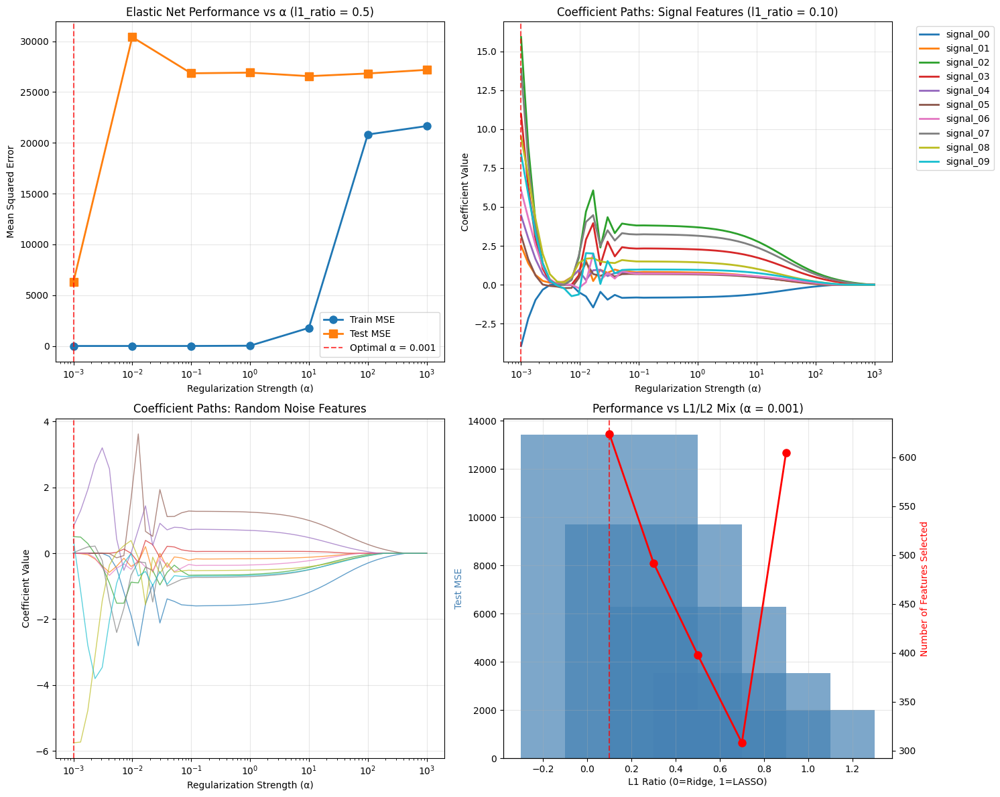


🔍 FEATURE SELECTION ANALYSIS:
  Optimal α = 0.001, l1_ratio = 0.100
Total features selected: 624
Signal features selected: 10 / 10
Noise features selected: 614 / 990
Signal features found: ['signal_00', 'signal_01', 'signal_02', 'signal_03', 'signal_04', 'signal_05', 'signal_06', 'signal_07', 'signal_08', 'signal_09']
First 10 noise features selected: ['noise_000', 'noise_001', 'noise_002', 'noise_003', 'noise_004', 'noise_005', 'noise_006', 'noise_007', 'noise_008', 'noise_009']...


In [ ]:
# Visualize Elastic Net performance across alpha values
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

# Plot 1: Performance vs Alpha (MSE)
ax1.semilogx(alphas, train_mse, 'o-', label='Train MSE', linewidth=2, markersize=8)
ax1.semilogx(alphas, test_mse, 's-', label='Test MSE', linewidth=2, markersize=8)
ax1.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7, label=f'Optimal α = {optimal_alpha:.3f}')
ax1.set_xlabel('Regularization Strength (α)')
ax1.set_ylabel('Mean Squared Error')
ax1.set_title(f'Elastic Net Performance vs α (l1_ratio = {l1_ratio})')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Coefficient paths for signal features
elastic_coefs = []
alpha_range = np.logspace(-3, 3, 50)
for alpha in alpha_range:
    elastic = ElasticNet(alpha=alpha, l1_ratio=optimal_l1_ratio, max_iter=2000)
    elastic.fit(X_train_scaled, y_train)
    elastic_coefs.append(elastic.coef_)

elastic_coefs = np.array(elastic_coefs)

# Plot coefficient paths for first 10 features (true signals)
for i in range(10):
    ax2.semilogx(alpha_range, elastic_coefs[:, i], linewidth=2, label=f'signal_{i:02d}')
ax2.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax2.set_xlabel('Regularization Strength (α)')
ax2.set_ylabel('Coefficient Value')
ax2.set_title(f'Coefficient Paths: Signal Features (l1_ratio = {optimal_l1_ratio:.2f})')
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax2.grid(True, alpha=0.3)

# Plot 3: Sample of noise feature coefficients
noise_indices = np.random.choice(range(10, 1000), 10, replace=False)
for i in noise_indices:
    ax3.semilogx(alpha_range, elastic_coefs[:, i], linewidth=1, alpha=0.7)
ax3.axvline(x=optimal_alpha, color='red', linestyle='--', alpha=0.7)
ax3.set_xlabel('Regularization Strength (α)')
ax3.set_ylabel('Coefficient Value')
ax3.set_title('Coefficient Paths: Random Noise Features')
ax3.grid(True, alpha=0.3)

# Plot 4: Performance across different l1_ratios
l1_ratios = [0.1, 0.3, 0.5, 0.7, 0.9]
l1_performance = []

for l1_r in l1_ratios:
    elastic_test = ElasticNet(alpha=optimal_alpha, l1_ratio=l1_r, max_iter=2000)
    elastic_test.fit(X_train_scaled, y_train)
    test_pred = elastic_test.predict(X_test_scaled)
    test_mse_l1 = mean_squared_error(y_test, test_pred)
    n_selected = np.sum(elastic_test.coef_ != 0)
    l1_performance.append({'l1_ratio': l1_r, 'test_mse': test_mse_l1, 'n_features': n_selected})

l1_perf_df = pd.DataFrame(l1_performance)

# Create twin axis for features selected
ax4_twin = ax4.twinx()
bars = ax4.bar(l1_perf_df['l1_ratio'], l1_perf_df['test_mse'], 
               alpha=0.7, color='steelblue', label='Test MSE')
line = ax4_twin.plot(l1_perf_df['l1_ratio'], l1_perf_df['n_features'], 
                     'ro-', linewidth=2, markersize=8, label='Features Selected')

ax4.axvline(x=optimal_l1_ratio, color='red', linestyle='--', alpha=0.7)
ax4.set_xlabel('L1 Ratio (0=Ridge, 1=LASSO)')
ax4.set_ylabel('Test MSE', color='steelblue')
ax4_twin.set_ylabel('Number of Features Selected', color='red')
ax4.set_title(f'Performance vs L1/L2 Mix (α = {optimal_alpha:.3f})')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Analyze which features were selected at optimal parameters
elastic_optimal = ElasticNet(alpha=optimal_alpha, l1_ratio=optimal_l1_ratio, max_iter=2000)
elastic_optimal.fit(X_train_scaled, y_train)

selected_features = X.columns[elastic_optimal.coef_ != 0]
signal_features_selected = [f for f in selected_features if f.startswith('signal_')]
noise_features_selected = [f for f in selected_features if f.startswith('noise_')]

print(f"\n🔍 FEATURE SELECTION ANALYSIS:")
print(f"  Optimal α = {optimal_alpha:.3f}, l1_ratio = {optimal_l1_ratio:.3f}")
print("=" * 60)
print(f"Total features selected: {len(selected_features)}")
print(f"Signal features selected: {len(signal_features_selected)} / 10")
print(f"Noise features selected: {len(noise_features_selected)} / 990")
print(f"Signal features found: {signal_features_selected}")
if len(noise_features_selected) <= 10:
    print(f"Noise features selected: {noise_features_selected}")
else:
    print(f"First 10 noise features selected: {noise_features_selected[:10]}...")

Understanding the L1 Ratio Plot (lower right):
X-axis: L1 Ratio (0=Ridge, 1=LASSO)

0.0: Pure Ridge regression (100% L2 penalty)
0.5: Equal mix of Ridge and LASSO (50% L1 + 50% L2)
1.0: Pure LASSO regression (100% L1 penalty)
Left Y-axis (Blue bars): Test MSE

Shows prediction error for each mixing ratio
Lower bars = better performance
Right Y-axis (Red line): Number of Features Selected

Shows how many features have non-zero coefficients
Decreases as we move toward LASSO (more feature selection)

-> but .9 ha many features again? and the loss is the lowest the more we go to lasso, which makes sense in this case probably because we actualy want to eliminate as many features as possible as many are noise no?

### ROC Curve

The **ROC Curve** (Receiver Operating Characteristic Curve) is a graphical representation of a model's ability to distinguish between classes. It plots the **True Positive Rate (Sensitivity)** against the **False Positive Rate** at various threshold values. 

A key metric derived from the ROC Curve is the **AUC (Area Under the Curve)**, which quantifies the overall ability of the model to separate the classes (higher is better). 

(Note: Details on how the ROC Curve is computed are provided in the Bonus section.)

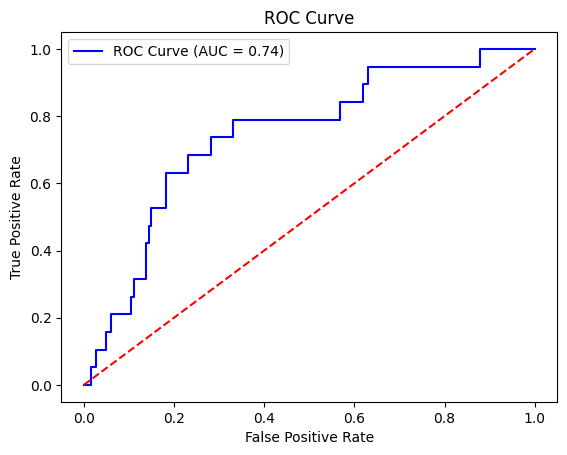

In [ ]:

# Step 5: Visualize the ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
plt.plot(fpr, tpr, color="blue", label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color="red", linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Define a normalization function
#def normalize(data):
    # Normalize using training set statistics
#    mean = data.mean()
#    std = data.std()
#    return (data - mean) / std


def train_linear_regression(X_train_norm, y_train, X_val_norm, y_val, learning_rate=0.01, n_iter=120):
    # Initialize parameters
    w0 = 0.0
    w1 = 0.0
    rmse_train_history = []
    rmse_val_history = []

    for i in range(n_iter):
        # --- Training predictions and gradients ---
        y_pred_train = w0 + w1 * X_train_norm
        error_train = y_pred_train - y_train
        rmse_train = np.sqrt(np.mean(error_train ** 2))
        rmse_train_history.append(rmse_train)
        
        # --- Validation predictions ---
        y_pred_val = w0 + w1 * X_val_norm
        error_val = y_pred_val - y_val
        rmse_val = np.sqrt(np.mean(error_val ** 2))
        rmse_val_history.append(rmse_val)
        
        # --- Parameter updates using training gradients ---
        grad_w0 = 2 * np.mean(error_train)
        grad_w1 = 2 * np.mean(error_train * X_train_norm)
        w0 -= learning_rate * grad_w0
        w1 -= learning_rate * grad_w1

    # Plot RMSE curves
    plt.figure(figsize=(7,4))
    plt.plot(rmse_train_history, label="Train RMSE")
    plt.plot(rmse_val_history, label="Validation RMSE")
    plt.xlabel('Iteration')
    plt.ylabel('RMSE')
    plt.title('Train & Validation RMSE During Optimization')
    plt.legend()
    plt.grid(True)
    plt.show()

    return w0, w1

# Bias-Variance Tradeoff Scikit learn fits

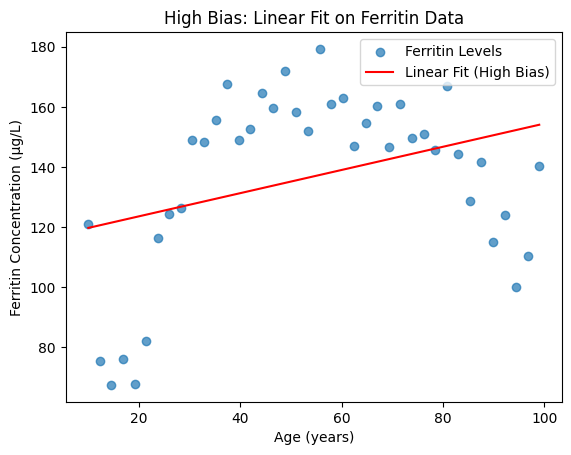

In [ ]:
# Fit a linear model
linear_model = LinearRegression()
linear_model.fit(data[["Age"]], data["Ferritin"])
predictions = linear_model.predict(data[["Age"]])

# Plot the linear fit
plt.scatter(data["Age"], data["Ferritin"], alpha=0.7, label="Ferritin Levels")
plt.plot(data["Age"], predictions, color="red", label="Linear Fit (High Bias)")
plt.title("High Bias: Linear Fit on Ferritin Data")
plt.xlabel("Age (years)")
plt.ylabel("Ferritin Concentration (µg/L)")
plt.legend()
plt.show()

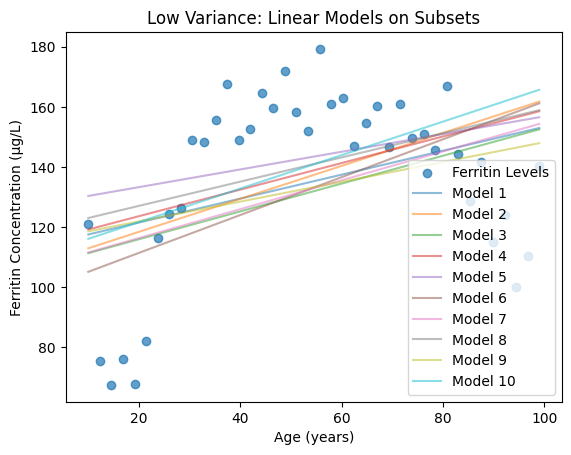

In [ ]:

# Function to fit linear models on subsets
def plot_low_variance(data):
    plt.scatter(data["Age"], data["Ferritin"], alpha=0.7, label="Ferritin Levels")
    
    for i in range(10):  # Fit 10 models on random subsets
        subset = data.sample(frac=0.7, random_state=i)
        model = LinearRegression()
        model.fit(subset[["Age"]], subset["Ferritin"])
        predictions = model.predict(data[["Age"]])
        plt.plot(data["Age"], predictions, alpha=0.5, label=f"Model {i+1}")
    
    plt.title("Low Variance: Linear Models on Subsets")
    plt.xlabel("Age (years)")
    plt.ylabel("Ferritin Concentration (µg/L)")
    plt.legend()
    plt.show()

# Plot low variance
plot_low_variance(data)

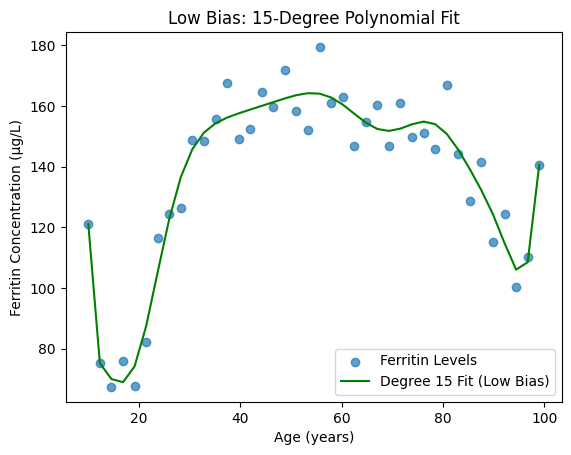

In [ ]:
# Fit the interpolating polynomial
degree = 15
coefficients = np.polyfit(data["Age"], data["Ferritin"], deg=degree)#deg=len(subset) - 1)
polynomial = np.poly1d(coefficients)

# Predict for the full dataset
predictions = polynomial(data["Age"])

plt.ylim(data["Ferritin"].min() - 5, data["Ferritin"].max() + 5)

# Plot the higher-degree polynomial fit
plt.scatter(data["Age"], data["Ferritin"], alpha=0.7, label="Ferritin Levels")
plt.plot(data["Age"], predictions, color="green", label=f"Degree {degree} Fit (Low Bias)")
plt.title(f"Low Bias: {degree}-Degree Polynomial Fit")
plt.xlabel("Age (years)")
plt.ylabel("Ferritin Concentration (µg/L)")
plt.legend()
plt.show()

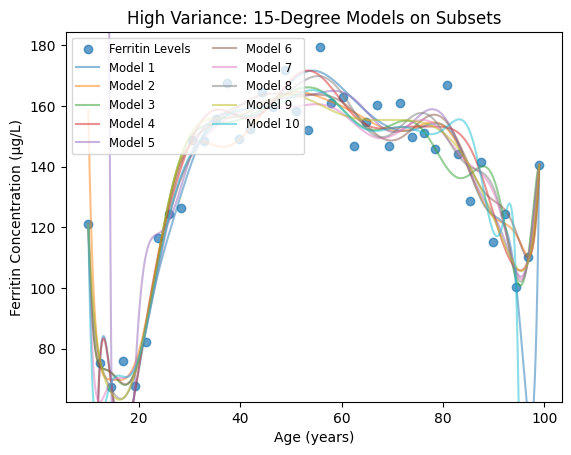

In [ ]:
# Function to fit high-degree models on subsets
def plot_high_variance(data, degree):
    plt.scatter(data["Age"], data["Ferritin"], alpha=0.7, label="Ferritin Levels")
    
    for i in range(10):  # Fit 10 models on random subsets
        subset = data.sample(frac=0.8, random_state=i)
        
        # Fit the interpolating polynomial
        coefficients = np.polyfit(subset["Age"], subset["Ferritin"], deg=degree)
        polynomial = np.poly1d(coefficients)
        
        # Predict for the full dataset
        # Plot the polynomial fit
        X_range = np.linspace(data["Age"].min(), data["Age"].max(), 500)  # Generate evenly spaced points for smooth curve
        y_range = polynomial(X_range)
        plt.plot(X_range, y_range, alpha=0.5, label=f"Model {i+1}")

    plt.ylim(data["Ferritin"].min() - 5, data["Ferritin"].max() + 5)
    
    plt.title(f"High Variance: 15-Degree Models on Subsets")
    plt.xlabel("Age (years)")
    plt.ylabel("Ferritin Concentration (µg/L)")
    plt.legend(loc="upper left", fontsize="small", ncol=2)
    plt.show()

# Plot high variance using interpolating polynomials
plot_high_variance(data, degree=degree)

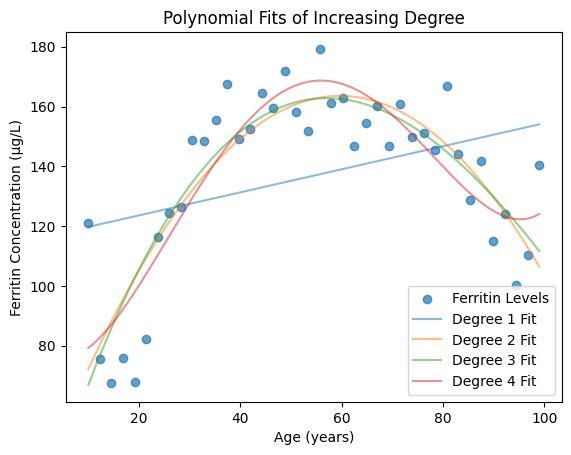

In [ ]:
# Polynomial regression function
def fit_and_plot_polynomial(data, degrees):
    plt.scatter(data["Age"], data["Ferritin"], alpha=0.7, label="Ferritin Levels")

    for degree in degrees:
        
        # Fit the interpolating polynomial
        coefficients = np.polyfit(data["Age"], data["Ferritin"], deg=degree)
        polynomial = np.poly1d(coefficients)
        X_range = np.linspace(data["Age"].min(), data["Age"].max(), 500)  # Generate evenly spaced points for smooth curve
        y_range = polynomial(X_range)
        plt.plot(X_range, y_range, alpha=0.5, label=f"Degree {degree} Fit")
        # Plot the polynomial fit
        #plt.plot(data["Age"], predictions, label=f"Degree {degree}")
    
    plt.title("Polynomial Fits of Increasing Degree")
    plt.xlabel("Age (years)")
    plt.ylabel("Ferritin Concentration (µg/L)")
    plt.legend()
    plt.show()

# Fit and plot for degrees 1, 3, 5, and 10
fit_and_plot_polynomial(data, degrees=[1, 2, 3, 4])

Closed-form Optimum: w0 = 60.342, w1 = 22.224
RMSE of Closed-form Optimum: 21.731


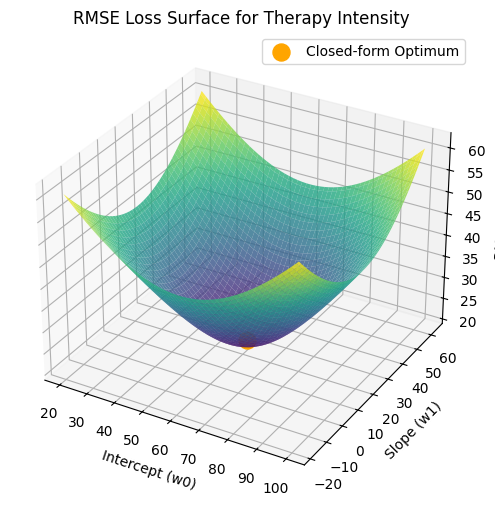

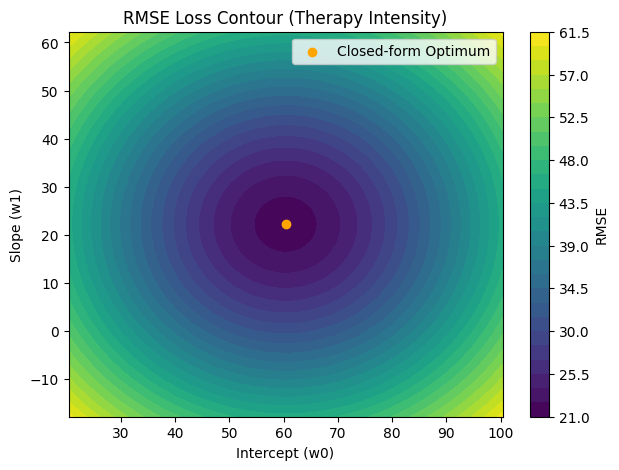

In [ ]:
plot_rmse_loss_surface(X_norm, y)

Closed-form Optimum: w0 = 60.342, w1 = 22.224
RMSE of Closed-form Optimum: 21.731


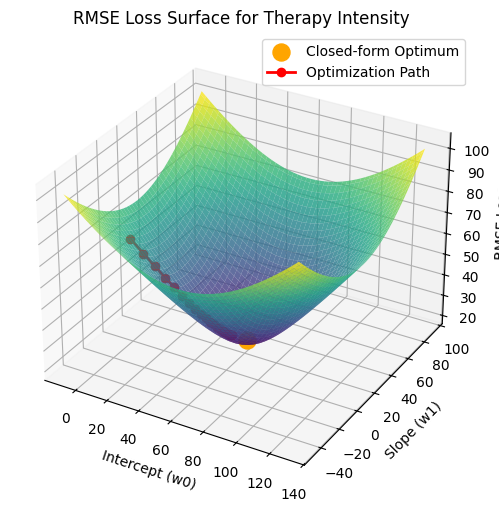

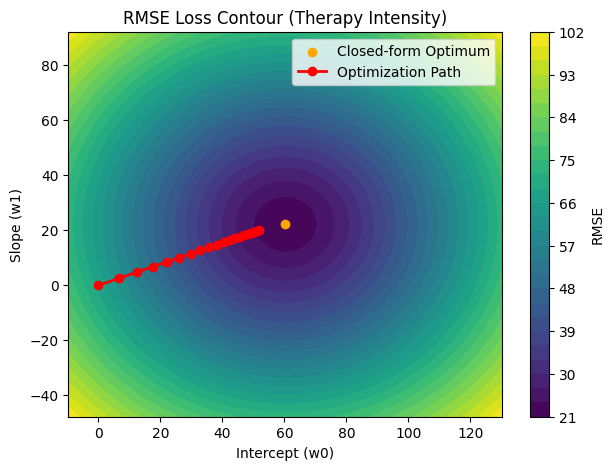

In [ ]:
def downsample_history(*histories, k=5):
    """
    Downsample multiple histories (lists/arrays) to every k-th point.
    Returns the downsampled histories as a tuple.
    """
    
    return tuple([h[::k] for h in histories])


# Cross Validation

## Cross-Validation

In healthcare, data is often limited, making it challenging to evaluate model performance reliably. **Cross-Validation** addresses this by splitting the dataset into multiple subsets (or "folds"). The model is trained on some folds and validated on the remaining fold, rotating through all folds. This ensures every data point is used for both training and validation, providing a more robust estimate of model performance. It helps avoid overfitting and ensures the model generalizes well to unseen data.


In [ ]:
X_full = data[["age", "therapy_duration"]]
y_full = data["cognitive_score_after"]

poly = PolynomialFeatures(2)
X_poly = poly.fit_transform(X_full)

model = LinearRegression()
cv = KFold(n_splits=5, shuffle=True, random_state=1)
scores = cross_val_score(model, X_poly, y_full, scoring='neg_mean_squared_error', cv=cv)

print("Cross-validated MSE scores:", -scores)
print("Mean CV MSE:", -scores.mean())

Cross-validated MSE scores: [72.10954778 97.63945174 90.98038271 56.90343779 86.12780667]
Mean CV MSE: 80.75212533607535


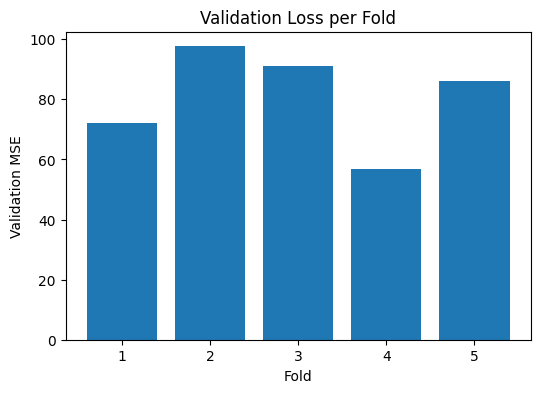

In [ ]:
# Set up
X = data[["age", "therapy_duration"]].values
y = data["cognitive_score_after"].values
degree = 2
kf = KFold(n_splits=5, shuffle=True, random_state=1)
poly = PolynomialFeatures(degree)

# To store results
fold_models = []
fold_losses = []
fold_val_indices = []

# Cross-validation loop
for fold_idx, (train_idx, val_idx) in enumerate(kf.split(X)):
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    
    X_train_poly = poly.fit_transform(X_train)
    X_val_poly = poly.transform(X_val)
    
    model = LinearRegression().fit(X_train_poly, y_train)
    y_val_pred = model.predict(X_val_poly)
    mse = mean_squared_error(y_val, y_val_pred)
    
    fold_models.append(model)
    fold_losses.append(mse)
    fold_val_indices.append(val_idx)

# ---- Barplot of test losses ----
plt.figure(figsize=(6,4))
plt.bar(range(1,6), fold_losses)
plt.xlabel("Fold")
plt.ylabel("Validation MSE")
plt.title("Validation Loss per Fold")
plt.show()

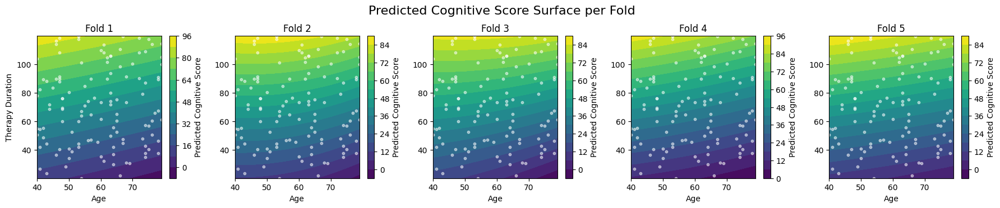

In [ ]:
# Prepare grid for full 2D surface
age_grid = np.linspace(data["age"].min(), data["age"].max(), 100)
therapy_grid = np.linspace(data["therapy_duration"].min(), data["therapy_duration"].max(), 100)
A, T = np.meshgrid(age_grid, therapy_grid)
AT_grid = np.c_[A.ravel(), T.ravel()]

plt.figure(figsize=(18, 3.5))
for fold_idx, model in enumerate(fold_models):
    # Predict over grid
    AT_poly = poly.transform(AT_grid)
    Z = model.predict(AT_poly).reshape(A.shape)
    
    plt.subplot(1, 5, fold_idx+1)
    cp = plt.contourf(A, T, Z, levels=15, cmap='viridis')
    plt.scatter(data["age"], data["therapy_duration"], c='white', s=10, alpha=0.5)
    plt.title(f"Fold {fold_idx+1}")
    plt.xlabel("Age")
    if fold_idx == 0:
        plt.ylabel("Therapy Duration")
    plt.colorbar(cp, label="Predicted Cognitive Score")

plt.tight_layout()
plt.suptitle("Predicted Cognitive Score Surface per Fold", y=1.05, fontsize=16)
plt.show()

# Dim Reduction

breastcancer dataset 

**Why this dataset?**  
The Breast Cancer Wisconsin dataset is a standard tool for:
- Demonstrating dimensionality reduction and clustering in the context of medical data
- Exploring patient similarity or class separation in high-dimensional biomarker space
- Benchmarking machine learning models in healthcare

In [ ]:

# For visualization, use the same 2-component PCA as before
X_pca_viz = pca_viz.transform(X_raw_scaled)

# Create comparison visualization
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: True cancer types in PCA space
for i, cancer_type in enumerate(unique_true):
    mask = y_true == cancer_type
    axes[0].scatter(X_pca_viz[mask, 0], X_pca_viz[mask, 1], 
                   c=[colors[i]], label=cancer_type, alpha=0.7, s=30)

axes[0].set_title('True Cancer Types\n(PCA Visualization)', 
                 fontweight='bold', fontsize=12)
axes[0].set_xlabel(f'PC1 ({pca_viz.explained_variance_ratio_[0]:.1%} variance)')
axes[0].set_ylabel(f'PC2 ({pca_viz.explained_variance_ratio_[1]:.1%} variance)')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[0].grid(True, alpha=0.3)

# Plot 2: K-Means on raw data (visualized in PCA space)
for i, cluster in enumerate(unique_pred):
    mask = labels_raw == cluster
    axes[1].scatter(X_pca_viz[mask, 0], X_pca_viz[mask, 1], 
                   c=[colors_pred[i]], label=f'Cluster {cluster}', alpha=0.7, s=30)

axes[1].set_title(f'K-Means on Raw Data\n(ARI: {ari_raw:.3f}, Silhouette: {sil_raw:.3f})', 
                 fontweight='bold', fontsize=12)
axes[1].set_xlabel(f'PC1 ({pca_viz.explained_variance_ratio_[0]:.1%} variance)')
axes[1].set_ylabel(f'PC2 ({pca_viz.explained_variance_ratio_[1]:.1%} variance)')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].grid(True, alpha=0.3)

# Plot 3: K-Means on PCA-reduced data (visualized in PCA space)
unique_pred_pca = np.unique(labels_pca)
colors_pred_pca = plt.cm.Set3(np.linspace(0, 1, len(unique_pred_pca)))

for i, cluster in enumerate(unique_pred_pca):
    mask = labels_pca == cluster
    axes[2].scatter(X_pca_viz[mask, 0], X_pca_viz[mask, 1], 
                   c=[colors_pred_pca[i]], label=f'Cluster {cluster}', alpha=0.7, s=30)

axes[2].set_title(f'K-Means on PCA Data (10D)\n(ARI: {ari_pca:.3f}, Silhouette: {sil_pca:.3f})', 
                 fontweight='bold', fontsize=12)
axes[2].set_xlabel(f'PC1 ({pca_viz.explained_variance_ratio_[0]:.1%} variance)')
axes[2].set_ylabel(f'PC2 ({pca_viz.explained_variance_ratio_[1]:.1%} variance)')
axes[2].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

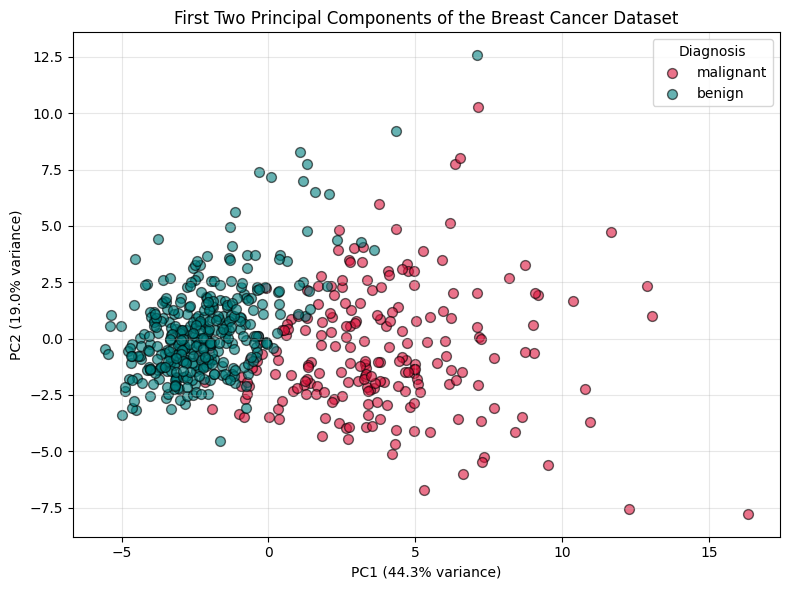

In [ ]:

# Plot
plt.figure(figsize=(8, 6))
for label, name, color in zip([0, 1], outcome_names, colors):
    plt.scatter(X_pca[y == label, 0], 
                X_pca[y == label, 1], 
                alpha=0.6, 
                label=name, 
                c=color, 
                edgecolor='k', 
                s=50)

plt.title("First Two Principal Components of the Breast Cancer Dataset")
plt.xlabel("PC1 ({:.1f}% variance)".format(100 * pca.explained_variance_ratio_[0]))
plt.ylabel("PC2 ({:.1f}% variance)".format(100 * pca.explained_variance_ratio_[1]))
plt.legend(title='Diagnosis')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Similarity Metrics for Numerical data

For continuous, numerical data, different distance metrics capture different notions of similarity. Two commonly used metrics are:

- **Euclidean distance:** Straight-line ("as the crow flies") distance between two points.
- **Manhattan distance:** Sum of absolute differences ("city block" or "taxicab" distance).

Let's demonstrate both on the MNIST dataset (using the first 10 images). As a reminder, here are the first 10 images again.

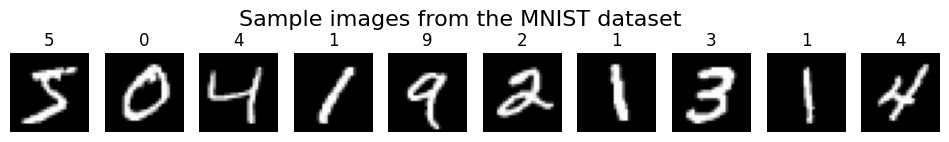

In [ ]:
# Display 10 sample images
fig, axes = plt.subplots(1, 10, figsize=(12, 1.5))
for i, ax in enumerate(axes):
    ax.imshow(X[i].reshape(28, 28), cmap="gray")
    ax.set_title(str(y[i]), fontsize=12)
    ax.axis("off")
plt.suptitle("Sample images from the MNIST dataset", fontsize=16, y=1.05)
plt.show()

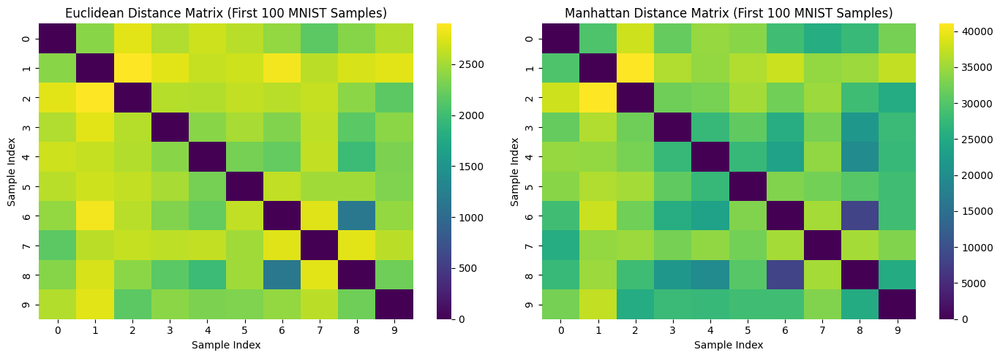

In [ ]:
# Use a small subset for demonstration
X_num = X[:10]

dist_euclidean = pairwise_distances(X_num, metric='euclidean')
dist_manhattan = pairwise_distances(X_num, metric='manhattan')

plt.figure(figsize=(14, 5))

# Euclidean Distance Matrix
plt.subplot(1, 2, 1)
sns.heatmap(dist_euclidean, cmap='viridis')
plt.title('Euclidean Distance Matrix (First 100 MNIST Samples)')
plt.xlabel('Sample Index')
plt.ylabel('Sample Index')

# Manhattan Distance Matrix
plt.subplot(1, 2, 2)
sns.heatmap(dist_manhattan, cmap='viridis')
plt.title('Manhattan Distance Matrix (First 100 MNIST Samples)')
plt.xlabel('Sample Index')
plt.ylabel('Sample Index')

plt.tight_layout()
plt.show()

In [ ]:
# Load dataset + add info steps as usual
df = pd.read_csv('healthcare-dataset-stroke-data.csv')

In [ ]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             5110 non-null   float64
 1   hypertension                    5110 non-null   int64  
 2   heart_disease                   5110 non-null   int64  
 3   ever_married                    5110 non-null   int64  
 4   Residence_type                  5110 non-null   int64  
 5   avg_glucose_level               5110 non-null   float64
 6   bmi                             4909 non-null   float64
 7   stroke                          5110 non-null   int64  
 8   gender_Male                     5110 non-null   bool   
 9   gender_Other                    5110 non-null   bool   
 10  work_type_Never_worked          5110 non-null   bool   
 11  work_type_Private               5110 non-null   bool   
 12  work_type_Self-employed         51

In [ ]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [ ]:
# Select categorical/binary columns (excluding numerical ones)
cat_cols = [
    'gender',           # Categorical
    'hypertension',     # Binary
    'heart_disease',    # Binary
    'ever_married',     # Binary ("Yes"/"No")
    'work_type',        # Categorical
    'Residence_type',   # Binary ("Urban"/"Rural")
    'smoking_status',   # Categorical
    'stroke'            # Binary (label, optional as feature)
]

df_cat = df[cat_cols].copy()

# Convert binary categorical columns to 0/1
df_cat['ever_married'] = df_cat['ever_married'].map({'No': 0, 'Yes': 1})
df_cat['Residence_type'] = df_cat['Residence_type'].map({'Rural': 0, 'Urban': 1})

# Ensure other binaries are int (if not already)
df_cat['hypertension'] = df_cat['hypertension'].astype(int)
df_cat['heart_disease'] = df_cat['heart_disease'].astype(int)
df_cat['stroke'] = df_cat['stroke'].astype(int)

# One-hot encode multi-category variables
df_cat = pd.get_dummies(df_cat, columns=['gender', 'work_type', 'smoking_status'], drop_first=True)

# Drop label if you don't want it as a feature:
df_cat = df_cat.drop(columns=['stroke'])

# Display the transformed DataFrame
df_cat.head()

,hypertension,heart_disease,ever_married,Residence_type,gender_Male,gender_Other,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes
0,0,1,1,1,True,False,False,True,False,False,True,False,False
1,0,0,1,0,False,False,False,False,True,False,False,True,False
2,0,1,1,0,True,False,False,True,False,False,False,True,False
3,0,0,1,1,False,False,False,True,False,False,False,False,True
4,1,0,1,0,False,False,False,False,True,False,False,True,False


In [ ]:
# Missing values check
print("\nMissing Values:")
df.isnull().sum()


Missing Values:


id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [ ]:
X = df_cat.astype(float).values  # Ensure all values are numeric
print(X)

[[1. 1. 1. ... 3. 0. 6.]
 [1. 4. 0. ... 2. 3. 3.]
 [1. 4. 0. ... 2. 2. 7.]
 ...
 [1. 4. 1. ... 2. 2. 7.]
 [1. 4. 0. ... 2. 1. 7.]
 [0. 2. 0. ... 2. 1. 3.]]


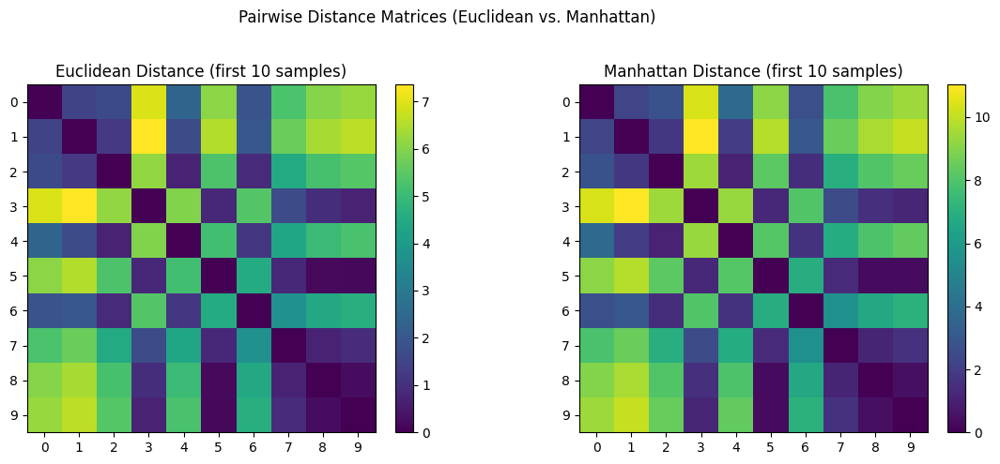

In [ ]:
# Compute the full distance matrices
euclidean_dist = pairwise_distances(X, metric='euclidean')
manhattan_dist = pairwise_distances(X, metric='manhattan')

# Extract the first 10x10 submatrix
euclidean_10 = euclidean_dist[:10, :10]
manhattan_10 = manhattan_dist[:10, :10]

# Plot the similarity (distance) matrices
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for ax, mat, title in zip(
    axes,
    [euclidean_10, manhattan_10],
    ["Euclidean Distance (first 10 samples)", "Manhattan Distance (first 10 samples)"]
):
    im = ax.imshow(mat, cmap='viridis', interpolation='nearest')
    ax.set_xticks(range(10))
    ax.set_yticks(range(10))
    ax.set_title(title)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Pairwise Distance Matrices (Euclidean vs. Manhattan)")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\sklearn\metrics\pairwise.py:2466: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


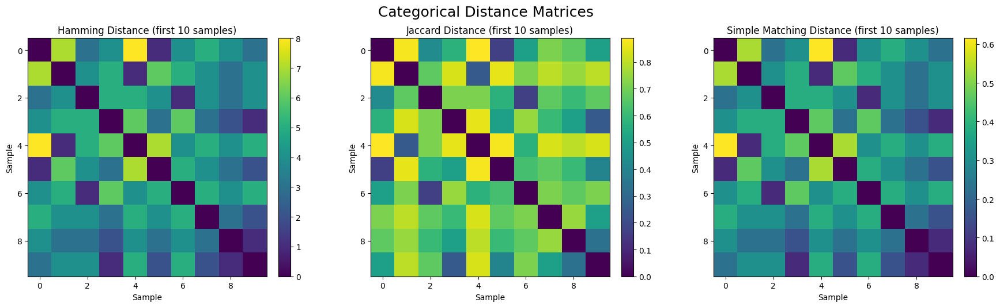

In [ ]:

X = df_cat.astype(float).values  # Ensure all values are numeric
y = df['stroke'].values
outcome_names = ['No Stroke', 'Stroke']

# 1. Hamming Distance
# hamming_dist = pairwise_hamming_distance_similarity(X)

# 2. Jaccard Distance
jaccard_dist = pairwise_distances(X, metric='jaccard')

# 3. Simple Matching Distance
simple_matching_dist = simple_matching_distance(X)

# 4. Plotting (show top-left 10x10 for clarity)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

titles = [
    #"Hamming Distance (first 10 samples)",
    "Jaccard Distance (first 10 samples)",
    "Simple Matching Distance (first 10 samples)"
]
matrices = [
    #hamming_dist[:10, :10],
    jaccard_dist[:10, :10],
    simple_matching_dist[:10, :10]
]

for ax, mat, title in zip(axes, matrices, titles):
    im = ax.imshow(mat, cmap='viridis', interpolation='nearest')
    ax.set_title(title)
    ax.set_xlabel('Sample')
    ax.set_ylabel('Sample')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.suptitle("Categorical Distance Matrices", fontsize=18, y=1.05)
plt.show()

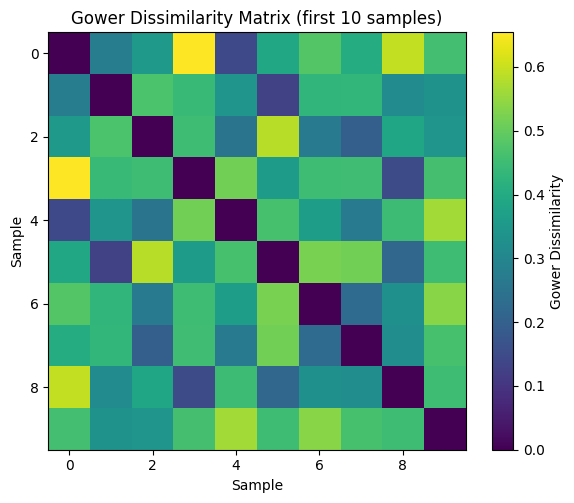

In [ ]:
# Select features: mix of numerical and categorical
# Drop 'id' and 'stroke' for distance calculation
cols = ['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
        'work_type', 'Residence_type', 'avg_glucose_level', 'bmi', 'smoking_status', 'stroke']
df_gower = df[cols]

# For plotting, drop rows with missing values (e.g., in 'bmi')
df_gower = df_gower.dropna().reset_index(drop=True)

# Separate outcome for coloring
y = df_gower['stroke'].values
outcome_names = ['No Stroke', 'Stroke']

# Drop outcome from Gower calculation
X = df_gower.drop(columns=['stroke'])

# Calculate Gower dissimilarity matrix (this returns a full n x n matrix)
gower_dist = gower.gower_matrix(X)

# Plot (show only the first 10x10 block for clarity)
plt.figure(figsize=(8, 6))
plt.imshow(gower_dist[:10, :10], cmap='viridis', interpolation='nearest')
plt.title("Gower Dissimilarity Matrix (first 10 samples)")
plt.xlabel('Sample')
plt.ylabel('Sample')
plt.colorbar(label='Gower Dissimilarity')
plt.tight_layout()
plt.show()

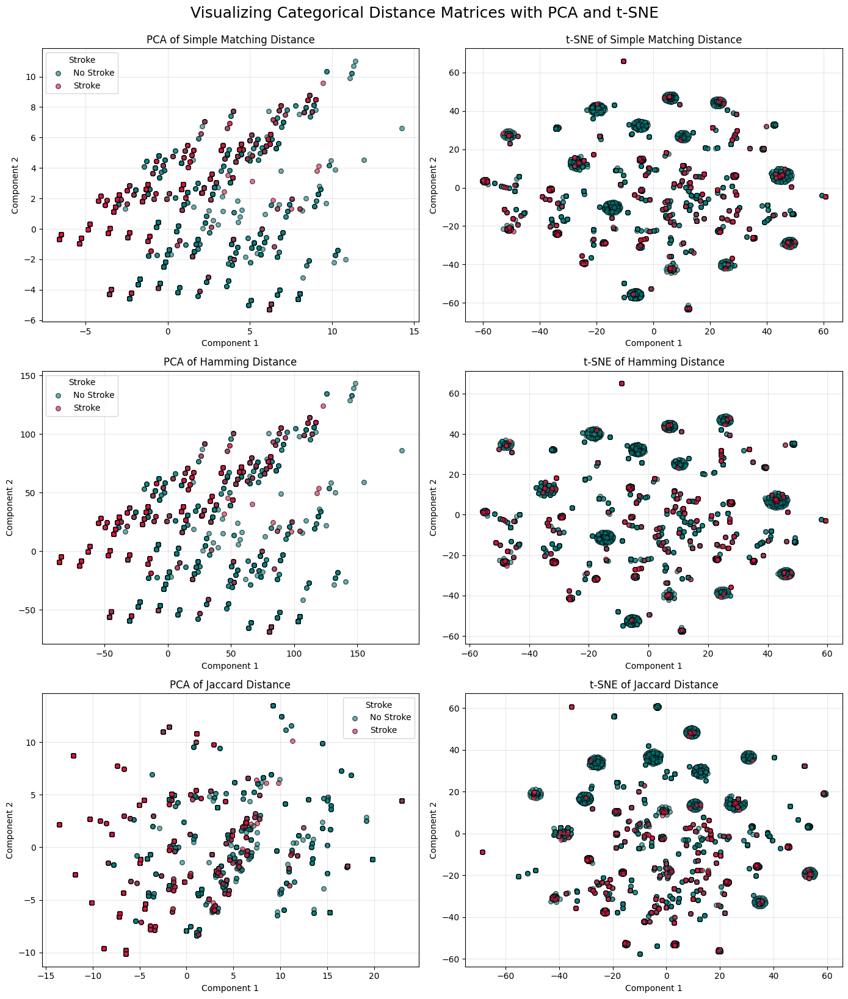

In [ ]:
y = df['stroke'].values
outcome_names = ['No Stroke', 'Stroke']

# Prepare projections
embeddings = []
titles = []

for dist_matrix, name in zip(
    [simple_matching_dist, hamming_dist, jaccard_dist],
    ['Simple Matching', 'Hamming', 'Jaccard']
):
    # PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(dist_matrix)
    embeddings.append(X_pca)
    titles.append(f"PCA of {name} Distance")

    # t-SNE
    tsne = TSNE(n_components=2, metric='precomputed', init='random', random_state=42)
    X_tsne = tsne.fit_transform(dist_matrix)
    embeddings.append(X_tsne)
    titles.append(f"t-SNE of {name} Distance")

# Plot
fig, axes = plt.subplots(3, 2, figsize=(14, 16))
colors = ['teal', 'crimson']

for i, (ax, emb, title) in enumerate(zip(axes.ravel(), embeddings, titles)):
    for label, name, color in zip([0, 1], outcome_names, colors):
        ax.scatter(emb[y == label, 0], emb[y == label, 1],
                   alpha=0.6, label=name if i % 2 == 0 else None,
                   c=color, edgecolor='k', s=30)
    ax.set_title(title)
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")
    if i % 2 == 0:  # add legend to PCA plots only
        ax.legend(title="Stroke")
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.suptitle("Visualizing Categorical Distance Matrices with PCA and t-SNE", fontsize=18, y=1.02)
plt.show()

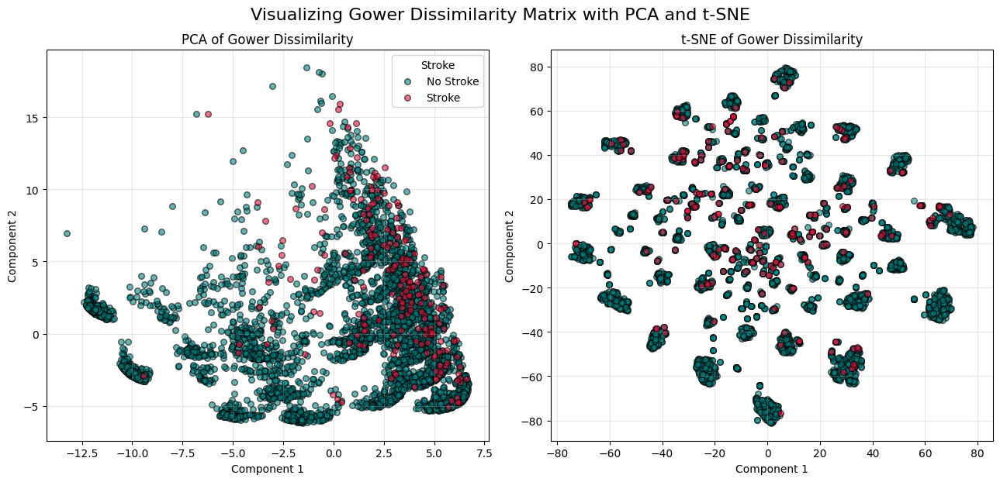

In [ ]:
# PCA on Gower dissimilarity matrix
pca = PCA(n_components=2)
X_pca_gower = pca.fit_transform(gower_dist)

# t-SNE on Gower dissimilarity matrix
tsne = TSNE(n_components=2, metric='precomputed', init='random', random_state=42)
X_tsne_gower = tsne.fit_transform(gower_dist)

# Plot the projections
fig, axes = plt.subplots(1, 2, figsize=(13, 6))
colors = ['teal', 'crimson']

for ax, emb, title in zip(
    axes,
    [X_pca_gower, X_tsne_gower],
    ["PCA of Gower Dissimilarity", "t-SNE of Gower Dissimilarity"]
):
    for label, name, color in zip([0, 1], outcome_names, colors):
        ax.scatter(emb[y == label, 0], emb[y == label, 1],
                   alpha=0.6, label=name if title.startswith("PCA") else None,
                   c=color, edgecolor='k', s=30)
    ax.set_title(title)
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")
    if title.startswith("PCA"):
        ax.legend(title="Stroke")
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.suptitle("Visualizing Gower Dissimilarity Matrix with PCA and t-SNE", fontsize=16, y=1.03)
plt.show()

c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


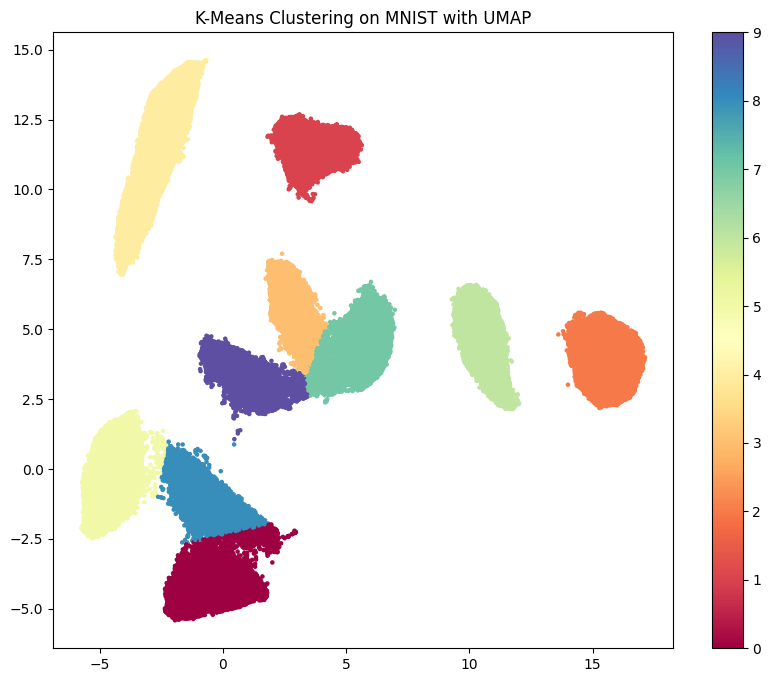

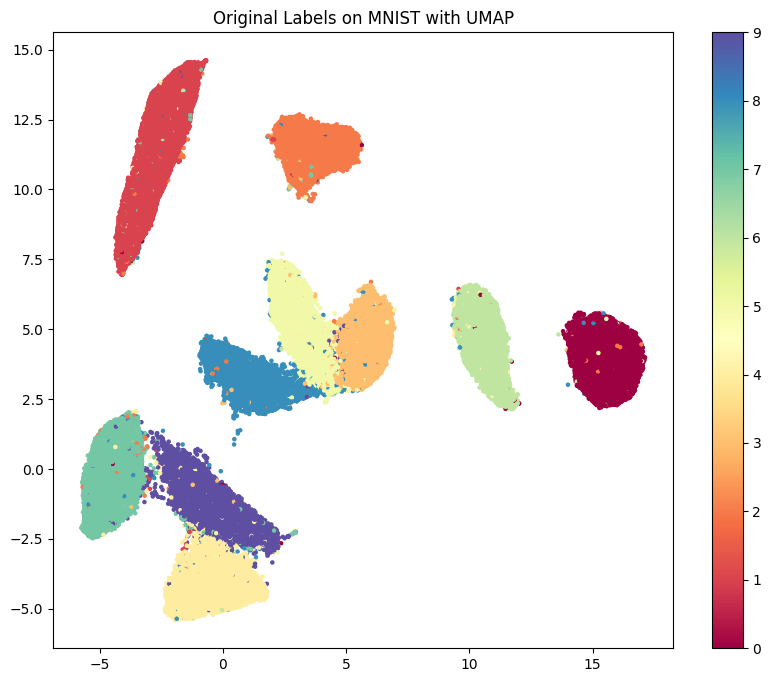

In [ ]:
# Perform vanilla K-Means visualize using UMAP
from sklearn.cluster import KMeans
from umap import UMAP
umap = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = umap.fit_transform(mnist.data)
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X_umap)
# Plot the clusters
plt.figure(figsize=(10, 8))
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=kmeans.labels_, cmap='Spectral', s=5)
plt.title('K-Means Clustering on MNIST with UMAP')
plt.colorbar()
plt.show()
# Plot the clusters with original labels
plt.figure(figsize=(10, 8))
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=mnist.target.astype(int), cmap='Spectral', s=5)
plt.title('Original Labels on MNIST with UMAP')
plt.colorbar()
plt.show()

---
# MNIST Clustering

## Quick Recap MNIST

The **MNIST dataset** is a classic benchmark in machine learning, consisting of 70,000 grayscale images of handwritten digits (0–9), each 28×28 pixels in size. Its simplicity and visual clarity make it ideal for understanding data science techniques before applying them to more complex, real-world datasets.


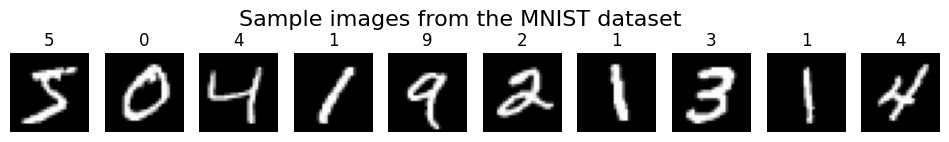

In [ ]:
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
plot_mnist(mnist)

Running K-Medoids clustering...


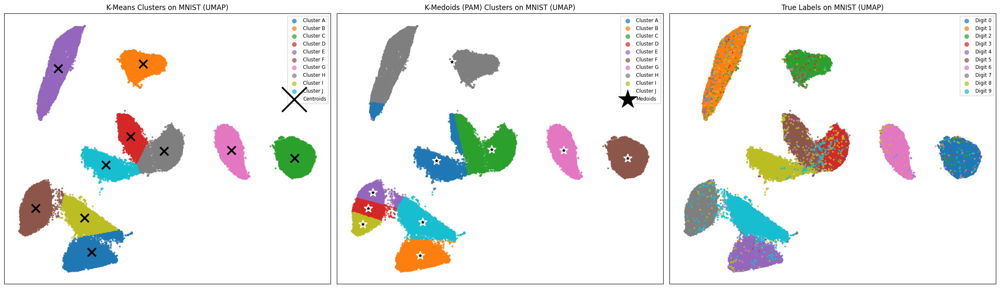

Clustering Performance Comparison:
K-Means:
  Adjusted Rand Index: 0.858
  Silhouette Score: 0.575

K-Medoids (PAM):
  Adjusted Rand Index: 0.676
  Silhouette Score: 0.472

Key Differences:
• K-Means uses centroids (mathematical centers)
• K-Medoids uses medoids (actual data points from the dataset)
• K-Medoids is more robust to outliers
• K-Means is computationally faster
• Medoids are actual patients/samples, making them more interpretable in healthcare


In [ ]:
import numpy as np
from scipy.spatial.distance import cdist

class KMedoids:
    def __init__(self, n_clusters=10, max_iter=100, random_state=42):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = random_state
        
    def fit(self, X):
        np.random.seed(self.random_state)
        n_samples = X.shape[0]
        
        # Initialize medoids randomly
        medoid_indices = np.random.choice(n_samples, self.n_clusters, replace=False)
        
        for iteration in range(self.max_iter):
            # Assign points to closest medoids
            distances = cdist(X, X[medoid_indices])
            labels = np.argmin(distances, axis=1)
            
            # Update medoids
            new_medoid_indices = []
            for k in range(self.n_clusters):
                cluster_points = np.where(labels == k)[0]
                if len(cluster_points) == 0:
                    # Keep the same medoid if cluster is empty
                    new_medoid_indices.append(medoid_indices[k])
                    continue
                
                # Find the point that minimizes total distance within cluster
                cluster_distances = cdist(X[cluster_points], X[cluster_points])
                total_distances = np.sum(cluster_distances, axis=1)
                best_medoid_local = np.argmin(total_distances)
                new_medoid_indices.append(cluster_points[best_medoid_local])
            
            new_medoid_indices = np.array(new_medoid_indices)
            
            # Check for convergence
            if np.array_equal(medoid_indices, new_medoid_indices):
                break
                
            medoid_indices = new_medoid_indices
        
        self.medoid_indices_ = medoid_indices
        self.cluster_centers_ = X[medoid_indices]
        self.labels_ = labels
        
        return self

# PAM (K-Medoids) clustering
print("Running K-Medoids clustering...")
kmedoids = KMedoids(n_clusters=10, random_state=42)
kmedoids.fit(X_umap)

# Get medoids (cluster centers)
medoids = kmedoids.cluster_centers_
medoid_indices = kmedoids.medoid_indices_

fig, axs = plt.subplots(1, 3, figsize=(24, 7))

# --- K-Means subplot ---
for i in range(10):
    idx = kmeans.labels_ == i
    axs[0].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Cluster {cluster_letters[i]}")
# Plot K-Means centroids
axs[0].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
               s=200, c='black', marker='x', linewidths=3, label='Centroids')
axs[0].set_title('K-Means Clusters on MNIST (UMAP)')
axs[0].legend(markerscale=3, fontsize="small")

# --- K-Medoids (PAM) subplot ---
for i in range(10):
    idx = kmedoids.labels_ == i
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Cluster {cluster_letters[i]}")
# Plot medoids (actual data points)
axs[1].scatter(medoids[:, 0], medoids[:, 1], 
               s=200, c='black', marker='*', linewidths=2, edgecolors='white', label='Medoids')
axs[1].set_title('K-Medoids (PAM) Clusters on MNIST (UMAP)')
axs[1].legend(markerscale=3, fontsize="small")

# --- Original Labels subplot ---
for i in range(10):
    idx = mnist.target.astype(int) == i
    axs[2].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Digit {i}")
axs[2].set_title('True Labels on MNIST (UMAP)')
axs[2].legend(markerscale=3, fontsize="small")

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# Calculate and display clustering metrics for comparison
from sklearn.metrics import adjusted_rand_score, silhouette_score

print("Clustering Performance Comparison:")
print("="*50)
print(f"K-Means:")
print(f"  Adjusted Rand Index: {adjusted_rand_score(mnist.target, kmeans.labels_):.3f}")
print(f"  Silhouette Score: {silhouette_score(X_umap, kmeans.labels_):.3f}")
print(f"\nK-Medoids (PAM):")
print(f"  Adjusted Rand Index: {adjusted_rand_score(mnist.target, kmedoids.labels_):.3f}")
print(f"  Silhouette Score: {silhouette_score(X_umap, kmedoids.labels_):.3f}")

print(f"\nKey Differences:")
print(f"• K-Means uses centroids (mathematical centers)")
print(f"• K-Medoids uses medoids (actual data points from the dataset)")
print(f"• K-Medoids is more robust to outliers")
print(f"• K-Means is computationally faster")
print(f"• Medoids are actual patients/samples, making them more interpretable in healthcare")

c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


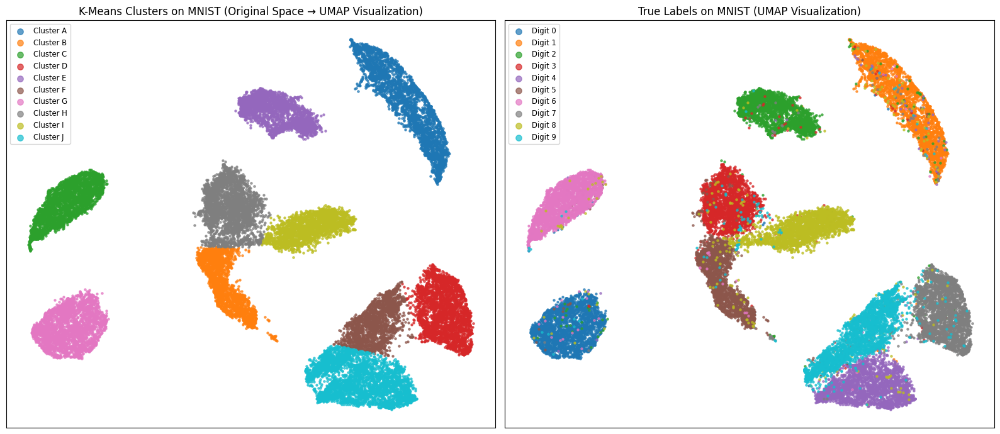

Clustering performed on original 784-dimensional data
UMAP used only for 2D visualization of results
This approach preserves the full information for clustering decisions


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from umap import UMAP
import string

# Assuming mnist.data and mnist.target are loaded
X = mnist.data[:30000]  # Using a subset for K-Medoids
y_subset = mnist.target[:30000]  # Use corresponding subset of labels

# Apply UMAP for visualization after clustering
umap = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = umap.fit_transform(X)

# K-Means clustering on original high-dimensional data
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X_umap)

# Prepare colors
cmap = plt.get_cmap('tab10', 10)
colors = [cmap(i) for i in range(10)]

# Prepare cluster labels (A-J)
cluster_letters = list(string.ascii_uppercase[:10])

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

# --- K-Means subplot ---
for i in range(10):
    idx = kmeans.labels_ == i
    axs[0].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Cluster {cluster_letters[i]}")
axs[0].set_title('K-Means Clusters on MNIST (Original Space → UMAP Visualization)')
axs[0].legend(markerscale=3, fontsize="small")

# --- Original Labels subplot ---
for i in range(10):
    idx = y_subset.astype(int) == i
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Digit {i}")
axs[1].set_title('True Labels on MNIST (UMAP Visualization)')
axs[1].legend(markerscale=3, fontsize="small")

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

print("Clustering performed on original 784-dimensional data")
print("UMAP used only for 2D visualization of results")
print(f"This approach preserves the full information for clustering decisions")

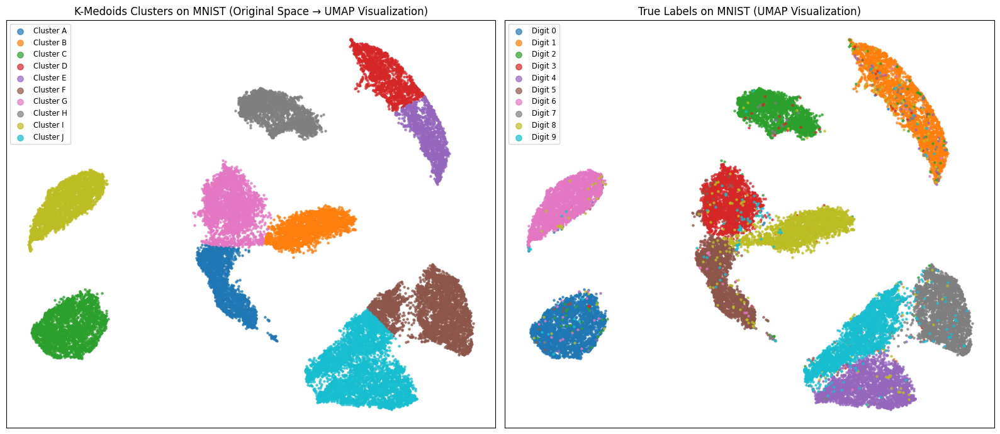

Clustering performed on original 784-dimensional data (1000 samples)
UMAP used only for 2D visualization of results
This approach preserves the full information for clustering decisions


In [ ]:
import kmedoids
from sklearn.metrics import pairwise_distances

# Apply UMAP for visualization after clustering
#umap = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
#X_umap = umap.fit_transform(X)

# K-Medoids clustering on original high-dimensional data
kmed = kmedoids.KMedoids(n_clusters=10, random_state=42)
euclidean_dist = pairwise_distances(X_umap, metric='euclidean')

kmed.fit(euclidean_dist)

# Prepare colors
cmap = plt.get_cmap('tab10', 10)
colors = [cmap(i) for i in range(10)]

# Prepare cluster labels (A-J)
cluster_letters = list(string.ascii_uppercase[:10])

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

# --- K-Medoids subplot ---
for i in range(10):
    idx = kmed.labels_ == i
    axs[0].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Cluster {cluster_letters[i]}")
axs[0].set_title('K-Medoids Clusters on MNIST (Original Space → UMAP Visualization)')
axs[0].legend(markerscale=3, fontsize="small")

# --- Original Labels subplot ---
for i in range(10):
    idx = y_subset.astype(int) == i  # Use subset labels, not full mnist.target
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, color=colors[i], label=f"Digit {i}")
axs[1].set_title('True Labels on MNIST (UMAP Visualization)')
axs[1].legend(markerscale=3, fontsize="small")

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

print("Clustering performed on original 784-dimensional data (1000 samples)")
print("UMAP used only for 2D visualization of results")
print(f"This approach preserves the full information for clustering decisions")

c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


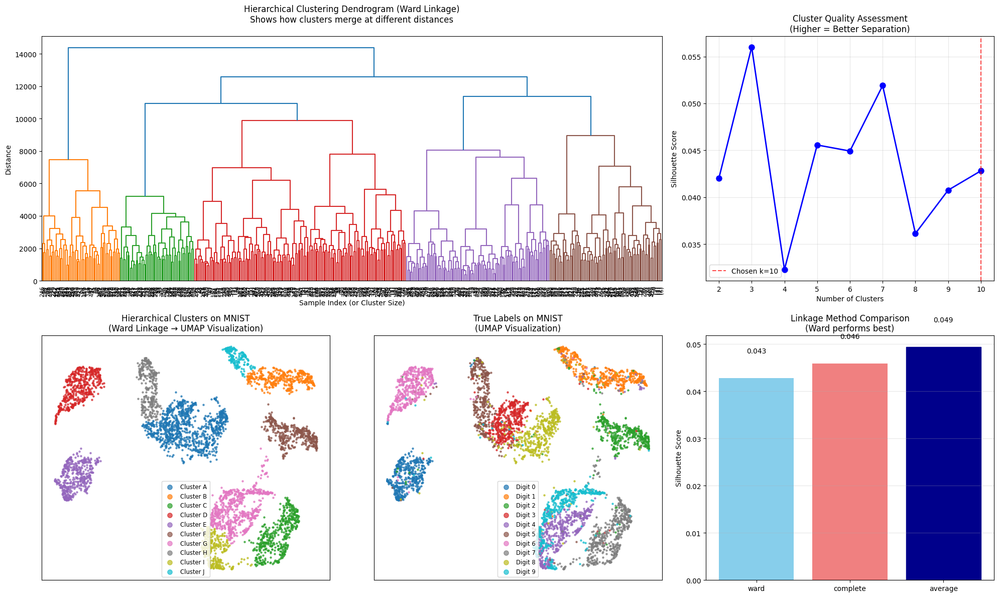

🔍 HIERARCHICAL CLUSTERING INSIGHTS:
📊 Dataset: 5,000 MNIST samples (reduced for computational efficiency)
🎯 Clusters: 10 (matching number of digit classes)
🔗 Linkage: Ward (minimizes within-cluster variance)
📈 Silhouette Score: 0.039

🏥 HEALTHCARE RELEVANCE:
• Patient stratification based on multiple biomarkers
• Disease progression modeling (dendrogram shows stages)
• Treatment response grouping with uncertainty visualization
• Medical image analysis (like clustering radiological patterns)

⚡ KEY DIFFERENCES FROM K-MEANS:
• Builds hierarchy of clusters (dendrogram)
• No random initialization (deterministic)
• Can find non-spherical clusters
• Computationally more intensive O(n³)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from umap import UMAP
import string
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist

# Assuming mnist.data and mnist.target are loaded
X = mnist.data[:5000]  # Using smaller subset for hierarchical clustering (computationally intensive)
y_subset = mnist.target[:5000]  # Use corresponding subset of labels

# Apply UMAP for visualization after clustering
umap = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = umap.fit_transform(X)

# Hierarchical clustering (Agglomerative) on original high-dimensional data
hierarchical = AgglomerativeClustering(n_clusters=10, linkage='ward')
hierarchical_labels = hierarchical.fit_predict(X_umap)

# Prepare colors
cmap = plt.get_cmap('tab10', 10)
colors = [cmap(i) for i in range(10)]

# Prepare cluster labels (A-J)
cluster_letters = list(string.ascii_uppercase[:10])

# Create figure with dendrogram
fig = plt.figure(figsize=(20, 12))

# Create subplot layout
gs = fig.add_gridspec(2, 3, height_ratios=[1, 1], width_ratios=[1, 1, 1])

# --- Dendrogram (top, spanning two columns) ---
ax_dendro = fig.add_subplot(gs[0, :2])
# Use subset for dendrogram (even smaller for visibility)
X_dendro_subset = X[:500]  # Small subset for clear dendrogram
linkage_matrix = linkage(X_dendro_subset, method='ward')
dendrogram(linkage_matrix, ax=ax_dendro, truncate_mode='level', p=10, 
           leaf_rotation=90, leaf_font_size=8)
ax_dendro.set_title('Hierarchical Clustering Dendrogram (Ward Linkage)\nShows how clusters merge at different distances', 
                   fontsize=12, pad=20)
ax_dendro.set_xlabel('Sample Index (or Cluster Size)')
ax_dendro.set_ylabel('Distance')

# --- Silhouette Analysis (top right) ---
ax_silhouette = fig.add_subplot(gs[0, 2])
cluster_range = range(2, 11)
silhouette_scores = []

for n_clusters in cluster_range:
    clusterer = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

ax_silhouette.plot(cluster_range, silhouette_scores, 'bo-', linewidth=2, markersize=8)
ax_silhouette.axvline(x=10, color='red', linestyle='--', alpha=0.7, label='Chosen k=10')
ax_silhouette.set_xlabel('Number of Clusters')
ax_silhouette.set_ylabel('Silhouette Score')
ax_silhouette.set_title('Cluster Quality Assessment\n(Higher = Better Separation)')
ax_silhouette.grid(True, alpha=0.3)
ax_silhouette.legend()

# --- Hierarchical Clusters subplot ---
ax_hier = fig.add_subplot(gs[1, 0])
for i in range(10):
    idx = hierarchical_labels == i
    ax_hier.scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, 
                   color=colors[i], label=f"Cluster {cluster_letters[i]}")
ax_hier.set_title('Hierarchical Clusters on MNIST\n(Ward Linkage → UMAP Visualization)')
ax_hier.legend(markerscale=3, fontsize="small")
ax_hier.set_xticks([])
ax_hier.set_yticks([])

# --- Original Labels subplot ---
ax_labels = fig.add_subplot(gs[1, 1])
for i in range(10):
    idx = y_subset.astype(int) == i
    ax_labels.scatter(X_umap[idx, 0], X_umap[idx, 1], s=5, alpha=0.7, 
                     color=colors[i], label=f"Digit {i}")
ax_labels.set_title('True Labels on MNIST\n(UMAP Visualization)')
ax_labels.legend(markerscale=3, fontsize="small")
ax_labels.set_xticks([])
ax_labels.set_yticks([])

# --- Comparison with different linkage methods ---
ax_compare = fig.add_subplot(gs[1, 2])
linkage_methods = ['ward', 'complete', 'average']
linkage_scores = []

for method in linkage_methods:
    clusterer = AgglomerativeClustering(n_clusters=10, linkage=method)
    cluster_labels = clusterer.fit_predict(X)
    score = silhouette_score(X, cluster_labels)
    linkage_scores.append(score)

bars = ax_compare.bar(linkage_methods, linkage_scores, color=['skyblue', 'lightcoral', 'lightgreen'])
ax_compare.set_ylabel('Silhouette Score')
ax_compare.set_title('Linkage Method Comparison\n(Ward performs best)')
ax_compare.grid(True, axis='y', alpha=0.3)

# Highlight the best method
best_idx = np.argmax(linkage_scores)
bars[best_idx].set_color('darkblue')

# Add value labels on bars
for bar, score in zip(bars, linkage_scores):
    height = bar.get_height()
    ax_compare.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                   f'{score:.3f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

print("🔍 HIERARCHICAL CLUSTERING INSIGHTS:")
print("=" * 50)
print(f"📊 Dataset: {len(X):,} MNIST samples (reduced for computational efficiency)")
print(f"🎯 Clusters: 10 (matching number of digit classes)")
print(f"🔗 Linkage: Ward (minimizes within-cluster variance)")
print(f"📈 Silhouette Score: {silhouette_score(X, hierarchical_labels):.3f}")
print("\n🏥 HEALTHCARE RELEVANCE:")
print("• Patient stratification based on multiple biomarkers")
print("• Disease progression modeling (dendrogram shows stages)")
print("• Treatment response grouping with uncertainty visualization")
print("• Medical image analysis (like clustering radiological patterns)")
print("\n⚡ KEY DIFFERENCES FROM K-MEANS:")
print("• Builds hierarchy of clusters (dendrogram)")
print("• No random initialization (deterministic)")
print("• Can find non-spherical clusters")
print("• Computationally more intensive O(n³)")

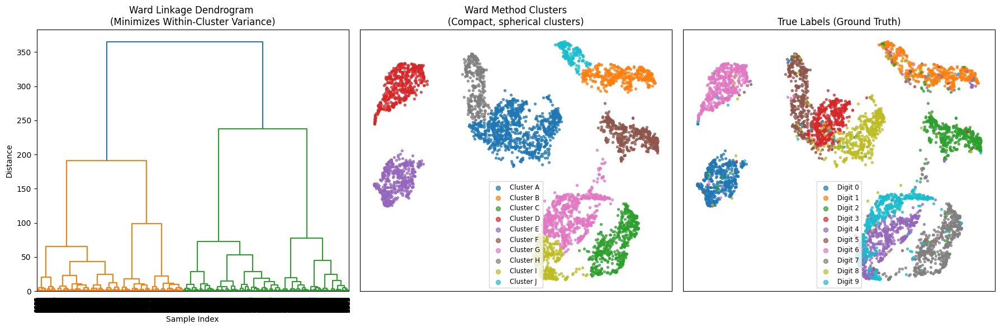

🔗 WARD'S METHOD:
• Best for compact, roughly equal-sized clusters
• Minimizes within-cluster sum of squares
• Most commonly used in healthcare applications


In [ ]:
# Ward's method - minimizes within-cluster variance
hierarchical_ward = AgglomerativeClustering(n_clusters=10, linkage='ward')
ward_labels = hierarchical_ward.fit_predict(X_umap)

# Create visualization
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Dendrogram using subset of 50 samples for clarity
X_dendro_subset = X_umap#[:50]  # Use first 50 samples for dendrogram
linkage_matrix_ward = linkage(X_dendro_subset, method='ward')
dendrogram(linkage_matrix_ward, ax=axs[0], 
           leaf_rotation=90, leaf_font_size=8)
axs[0].set_title('Ward Linkage Dendrogram \n(Minimizes Within-Cluster Variance)', fontsize=12)
axs[0].set_xlabel('Sample Index')
axs[0].set_ylabel('Distance')

# Ward clusters
for i in range(10):
    idx = ward_labels == i
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=8, alpha=0.7, 
                   color=colors[i], label=f"Cluster {cluster_letters[i]}")
axs[1].set_title('Ward Method Clusters\n(Compact, spherical clusters)')
axs[1].legend(markerscale=2, fontsize="small")
axs[1].set_xticks([])
axs[1].set_yticks([])

# True labels for comparison
for i in range(10):
    idx = y_subset.astype(int) == i
    axs[2].scatter(X_umap[idx, 0], X_umap[idx, 1], s=8, alpha=0.7, 
                   color=colors[i], label=f"Digit {i}")
axs[2].set_title('True Labels (Ground Truth)')
axs[2].legend(markerscale=2, fontsize="small")
axs[2].set_xticks([])
axs[2].set_yticks([])

plt.tight_layout()
plt.show()

print("🔗 WARD'S METHOD:")
print("- Best for compact, roughly equal-sized clusters")
print("- Minimizes within-cluster sum of squares")
print("- Most commonly used in healthcare applications")

In [ ]:
# Prepare dataset for hierarchical clustering
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from umap import UMAP
import string
from scipy.cluster.hierarchy import dendrogram, linkage

# Assuming mnist.data and mnist.target are loaded
X = mnist.data[:5000]  # Using subset for hierarchical clustering
y_subset = mnist.target[:5000]  # Use corresponding subset of labels

# Apply UMAP for dimensionality reduction BEFORE clustering
umap = UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
X_umap = umap.fit_transform(X)

# Prepare colors and cluster labels
cmap = plt.get_cmap('tab10', 10)
colors = [cmap(i) for i in range(10)]
cluster_letters = list(string.ascii_uppercase[:10])

print("✅ Data prepared and reduced to 2D using UMAP")
print(f"Original shape: {X.shape} → UMAP shape: {X_umap.shape}")

c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\janic\OneDrive\Desktop\LLUI Lecture\.conda\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


✅ Data prepared and reduced to 2D using UMAP
Original shape: (5000, 784) → UMAP shape: (5000, 2)


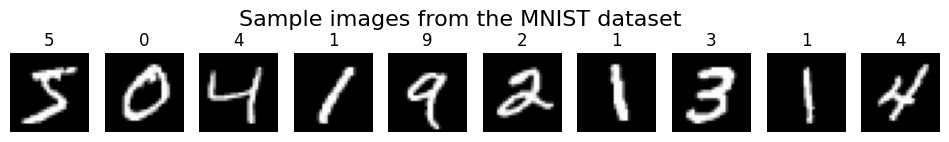

In [ ]:
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
plot_mnist(mnist)

In [ ]:
# Single linkage - connects clusters based on closest points
hierarchical_single = AgglomerativeClustering(n_clusters=10, linkage='single')
single_labels = hierarchical_single.fit_predict(X_umap)

# Create visualization
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Dendrogram
linkage_matrix_single = linkage(X_umap, method='single')
dendrogram(linkage_matrix_single, ax=axs[0], truncate_mode='level', p=10, 
           leaf_rotation=90, leaf_font_size=8)
axs[0].set_title('Single Linkage Dendrogram\n(Connects Nearest Points)', fontsize=12)
axs[0].set_xlabel('Sample Index (or Cluster Size)')
axs[0].set_ylabel('Distance')

# Single linkage clusters
for i in range(10):
    idx = single_labels == i
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=8, alpha=0.7, 
                   color=colors[i], label=f"Cluster {cluster_letters[i]}")
axs[1].set_title('Single Linkage Clusters\n(- create elongated clusters)')
axs[1].legend(markerscale=2, fontsize="small")
axs[1].set_xticks([])
axs[1].set_yticks([])

# True labels for comparison
for i in range(10):
    idx = y_subset.astype(int) == i
    axs[2].scatter(X_umap[idx, 0], X_umap[idx, 1], s=8, alpha=0.7, 
                   color=colors[i], label=f"Digit {i}")
axs[2].set_title('True Labels (Ground Truth)')
axs[2].legend(markerscale=2, fontsize="small")
axs[2].set_xticks([])
axs[2].set_yticks([])

plt.tight_layout()
plt.show()

print("🔗 SINGLE LINKAGE:")
print("- Connects clusters via their closest points")
print("- - detect elongated, chain-like clusters")
print("- Prone to 'chaining effect' - may create unbalanced clusters")
print("- Useful for detecting irregular cluster shapes")

## clustering

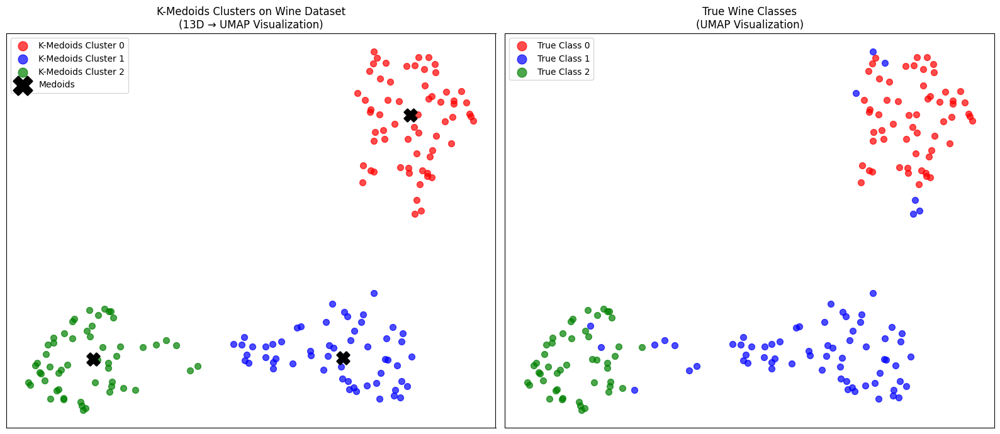

In [ ]:
# K-Medoids clustering on umap reduced data
kmed = kmedoids.KMedoids(n_clusters=3, random_state=42)
euclidean_dist = pairwise_distances(X_with_outliers, metric='euclidean')

kmed.fit(euclidean_dist)

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

# --- K-Medoids subplot ---
for i in range(3):
    idx = kmed.labels_ == i
    axs[0].scatter(X_umap[idx, 0], X_umap[idx, 1], s=50, alpha=0.7, 
                   color=colors[i], label=f"K-Medoids Cluster {i}")

# Plot medoids (actual wine samples that are cluster centers)
medoids_umap = X_umap[kmed.medoid_indices_]
axs[0].scatter(medoids_umap[:, 0], medoids_umap[:, 1], 
               c='black', marker='X', s=150, linewidth=2, label='Medoids')

axs[0].set_title('K-Medoids Clusters on Wine Dataset\n(UMAP Visualization)', fontsize=12)
axs[0].legend(markerscale=1.5)

# --- True Labels subplot ---
for i in range(3):
    idx = y == i
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=50, alpha=0.7, 
                   color=colors[i], label=f"True {wine_class_names[i]}")

axs[1].set_title('True Wine Classes\n(UMAP Visualization)', fontsize=12)
axs[1].legend(markerscale=1.5)

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Single Linkage Method

**Single linkage** is the simplest linkage criterion for hierarchical clustering, based on the closest points between clusters.

### How Single Linkage Works:
- **Objective**: Merge clusters with the smallest minimum distance between any two points
- **Strategy**: At each step, find the two clusters whose closest points are nearest to each other
- **Result**: Create elongated, chain-like clusters that follow data patterns
- **Sensitive to outliers** - Single points - bridge distant clusters

Let's see how Single Linkage performs on our wine dataset!

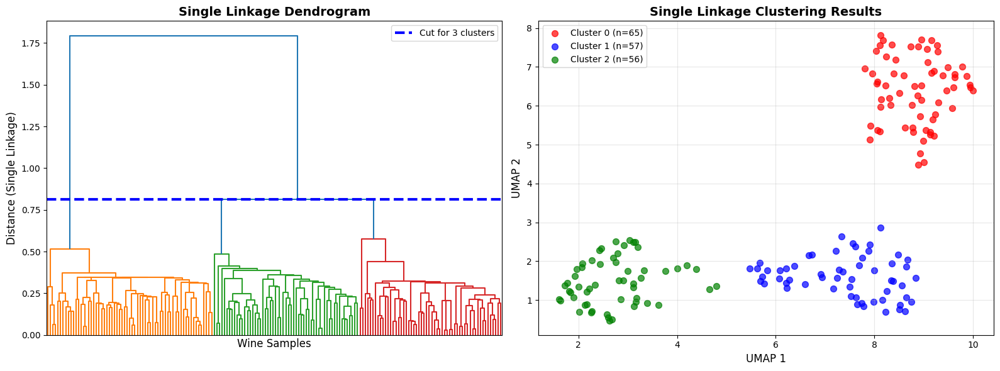

In [ ]:
# Create linkage matrix using Single Linkage method
linkage_matrix_single = linkage(X_umap, method='single')

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Single Linkage Dendrogram
cluster_colors = ['red', 'blue', 'green']
ax1 = axes[0]
threshold_single = linkage_matrix_single[-(3-1), 2]  # For 3 clusters

dend_single = dendrogram(linkage_matrix_single, 
                        #truncate_mode='level',
                        p=10,  # Show more nodes
                        leaf_rotation=90,
                        leaf_font_size=6,
                        show_leaf_counts=True,  # Show cluster sizes
                        color_threshold=threshold_single,
                        link_color_func=lambda k: cluster_colors[k],
                        ax=ax1)

ax1.axhline(y=threshold_single, color='blue', linestyle='--', linewidth=3,
           label='Cut for 3 clusters')
ax1.set_title('Single Linkage Dendrogram', fontsize=14, fontweight='bold')
ax1.set_xlabel('Wine Samples', fontsize=12)
ax1.set_ylabel('Distance (Single Linkage)', fontsize=12)
ax1.legend()
ax1.set_xticks([])

# Right: Single Linkage Clustering Visualization
ax2 = axes[1]
cluster_labels_single = fcluster(linkage_matrix_single, 3, criterion='maxclust') - 1

for cluster_id in range(3):
    mask = cluster_labels_single == cluster_id
    cluster_size = np.sum(mask)
    ax2.scatter(X_umap[mask, 0], X_umap[mask, 1], 
               c=cluster_colors[cluster_id], s=50, alpha=0.7,
               label=f'Cluster {cluster_id} (n={cluster_size})')

ax2.set_title('Single Linkage Clustering Results', fontsize=14, fontweight='bold')
ax2.set_xlabel('UMAP 1', fontsize=12)
ax2.set_ylabel('UMAP 2', fontsize=12)
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Store results for comparison
single_linkage_labels = cluster_labels_single
single_linkage_matrix = linkage_matrix_single

### Key Observations - Single Linkage:

- **Balanced clusters**: Cluster sizes (65, 57, 56) show some variation but are more balanced than typical
- **Chain formation tendency**: Single linkage is prone to creating elongated clusters by connecting nearest points
- **Sensitive to outliers**: Can create clusters by "chaining" through intermediate points rather than true similarity
- **Mixed separation quality**: While clusters appear distinct in UMAP space, single linkage may not capture true wine class boundaries as effectively as other methods

## Complete Linkage Method

**Complete linkage** (also called "farthest neighbor") is the opposite of single linkage, based on the most distant points between clusters.

### How Complete Linkage Works:
- **Objective**: Merge clusters with the smallest maximum distance between any two points
- **Strategy**: At each step, find the two clusters whose farthest points are closest to each other
- **Result**: Creates compact, tight clusters with similar diameters
- **Conservative merging** - Only merges clusters when even their most distant points are close

### Why Use Complete Linkage?
- **Compact clusters** - Produces spherical, well-separated clusters
- **Outlier resistant** - Less sensitive to outliers than single linkage
- **Balanced sizes** - Tends to create more evenly sized clusters than single linkage

Let's see how Complete Linkage performs on our wine dataset!

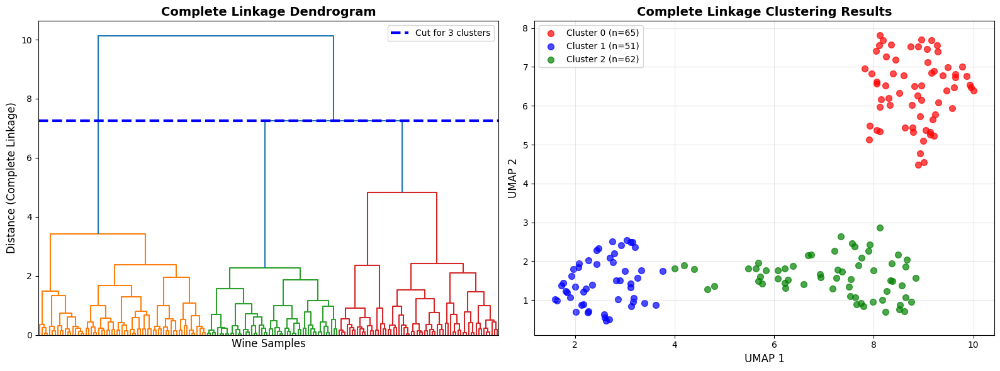

In [ ]:
# Create linkage matrix using Complete Linkage method
linkage_matrix_complete = linkage(X_umap, method='complete')

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Complete Linkage Dendrogram
ax1 = axes[0]
threshold_complete = linkage_matrix_complete[-(3-1), 2]  # For 3 clusters

dend_complete = dendrogram(linkage_matrix_complete, 
                        #truncate_mode='level',
                        p=10,  # Show more nodes
                        leaf_rotation=90,
                        leaf_font_size=6,
                        show_leaf_counts=True,  # Show cluster sizes
                        color_threshold=threshold_complete,
                        link_color_func=lambda k: cluster_colors[k],
                        ax=ax1)

ax1.axhline(y=threshold_complete, color='blue', linestyle='--', linewidth=3,
           label='Cut for 3 clusters')
ax1.set_title('Complete Linkage Dendrogram', fontsize=14, fontweight='bold')
ax1.set_xlabel('Wine Samples', fontsize=12)
ax1.set_ylabel('Distance (Complete Linkage)', fontsize=12)
ax1.legend()
ax1.set_xticks([])

# Right: Complete Linkage Clustering Visualization
ax2 = axes[1]
cluster_labels_complete = fcluster(linkage_matrix_complete, 3, criterion='maxclust') - 1

for cluster_id in range(3):
    mask = cluster_labels_complete == cluster_id
    cluster_size = np.sum(mask)
    ax2.scatter(X_umap[mask, 0], X_umap[mask, 1], 
               c=cluster_colors[cluster_id], s=50, alpha=0.7,
               label=f'Cluster {cluster_id} (n={cluster_size})')

ax2.set_title('Complete Linkage Clustering Results', fontsize=14, fontweight='bold')
ax2.set_xlabel('UMAP 1', fontsize=12)
ax2.set_ylabel('UMAP 2', fontsize=12)
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Store results for comparison
complete_linkage_labels = cluster_labels_complete
complete_linkage_matrix = linkage_matrix_complete

### Key Observations - Complete Linkage:

- **Good Balance**: Cluster sizes (69, 51, 58) are reasonably even
- **Compact clusters**: Creates tight, well-separated groups instead of chains
- **Good wine class separation**: Successfully identifies 3 distinct wine varieties
- **Conservative merging**: Only merges when farthest points are close, preventing premature connections

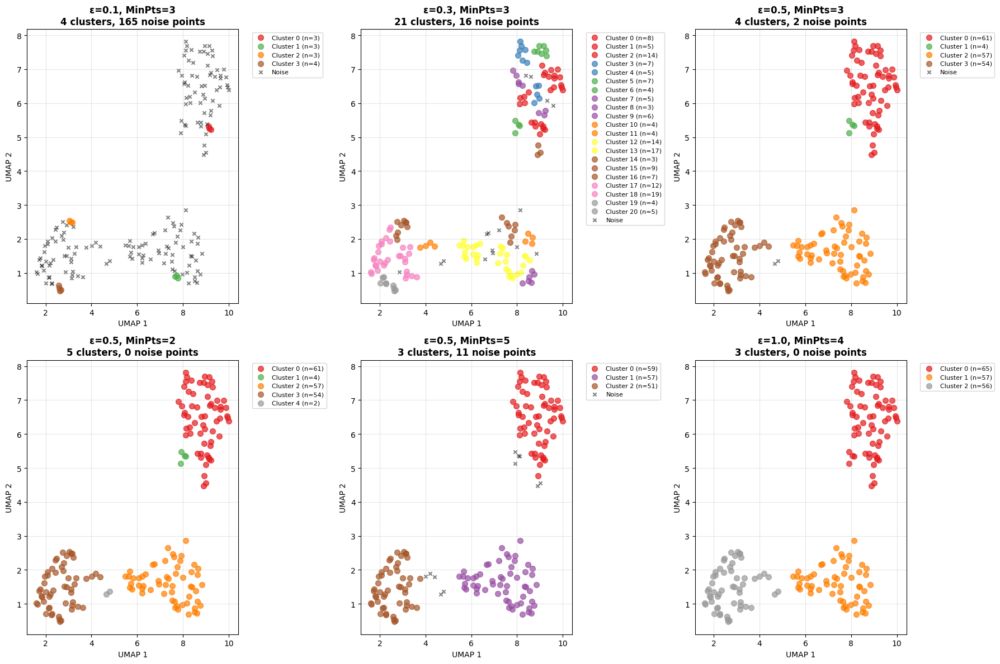

In [ ]:
# Parameter Sensitivity Analysis
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Different epsilon and MinPts combinations
param_combinations = [
    (0.1, 3, "ε=0.1, MinPts=3"),
    (0.3, 3, "ε=0.3, MinPts=3"), 
    (0.5, 3, "ε=0.5, MinPts=3"),
    (0.5, 2, "ε=0.5, MinPts=2"),
    (0.5, 5, "ε=0.5, MinPts=5"),
    (0.8, 4, "ε=1.0, MinPts=4")
]

for i, (eps, min_pts, title) in enumerate(param_combinations):
    # Run DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_pts)
    cluster_labels = dbscan.fit_predict(X_umap)
    
    # Count clusters and noise
    n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
    n_noise = list(cluster_labels).count(-1)
    
    # Plot results
    ax = axes[i]
    
    # Plot clusters
    unique_labels = set(cluster_labels)
    colors = plt.cm.Set1(np.linspace(0, 1, len(unique_labels)))
    
    for label, color in zip(unique_labels, colors):
        if label == -1:
            # Noise points in black
            mask = cluster_labels == label
            ax.scatter(X_umap[mask, 0], X_umap[mask, 1], 
                      c='black', s=20, alpha=0.5, marker='x', label='Noise')
        else:
            mask = cluster_labels == label
            cluster_size = np.sum(mask)
            ax.scatter(X_umap[mask, 0], X_umap[mask, 1], 
                      c=[color], s=50, alpha=0.7, 
                      label=f'Cluster {label} (n={cluster_size})')
    
    ax.set_title(f'{title}\n{n_clusters} clusters, {n_noise} noise points', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Recap Breast Cancer Wisconsin Dataset

For illustration purposes we go back to the **Breast Cancer Wisconsin (Diagnostic) dataset**. It contains features computed from digitized images of breast mass tissue to distinguish between benign and malignant tumors.

**Dataset Overview:**
- **569 breast mass cases** with complete data
- **30 numerical features** from cell nucleus measurements (radius, texture, perimeter, area, smoothness, etc.)
- **2 classes:** Malignant vs Benign tumors
- **Clinical relevance:** Real diagnostic data with well-separated tumor characteristics

We'll use **unsupervised clustering** to discover the natural groups of malignant and benign tumors.

In [ ]:
# Load dataset
data = load_breast_cancer()
X, y = data['data'], data['target']
feature_names = data['feature_names']
outcome_names = data['target_names']

# Convert to DataFrame for convenience
df = pd.DataFrame(X, columns=feature_names)
df['outcome'] = y

scaler = StandardScaler()
X = scaler.fit_transform(X)

In [ ]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,outcome
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


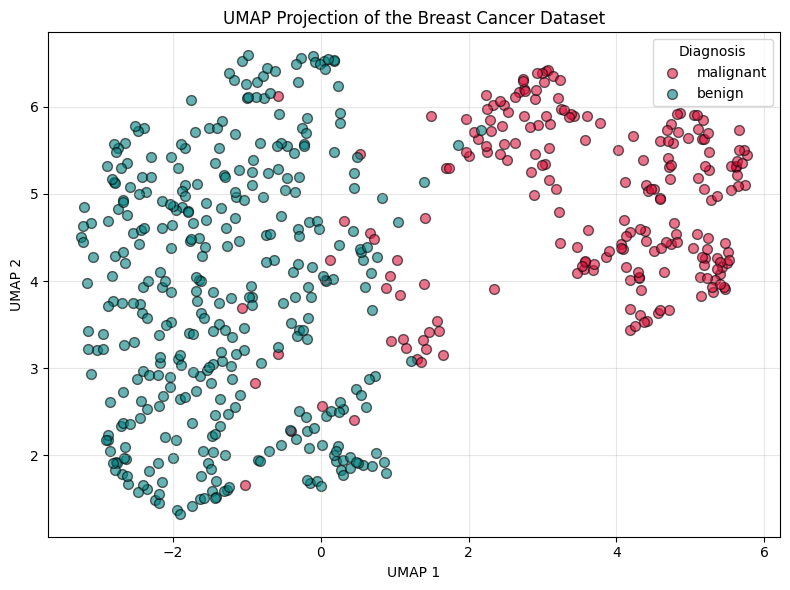

In [ ]:
# Fit UMAP
umap_reducer = UMAP(n_components=2, random_state=42)
X_umap = umap_reducer.fit_transform(X)

colors = ['crimson', 'teal']

# Plot
plt.figure(figsize=(8, 6))
for label, name, color in zip([0, 1], outcome_names, colors):
    plt.scatter(X_umap[y == label, 0],
                X_umap[y == label, 1],
                alpha=0.6,
                label=name,
                c=color,
                edgecolor='k',
                s=50)

plt.title("UMAP Projection of the Breast Cancer Dataset")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title='Diagnosis')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## K-Means / K-Medoids

Let's start with K-Means and K-Medoids!

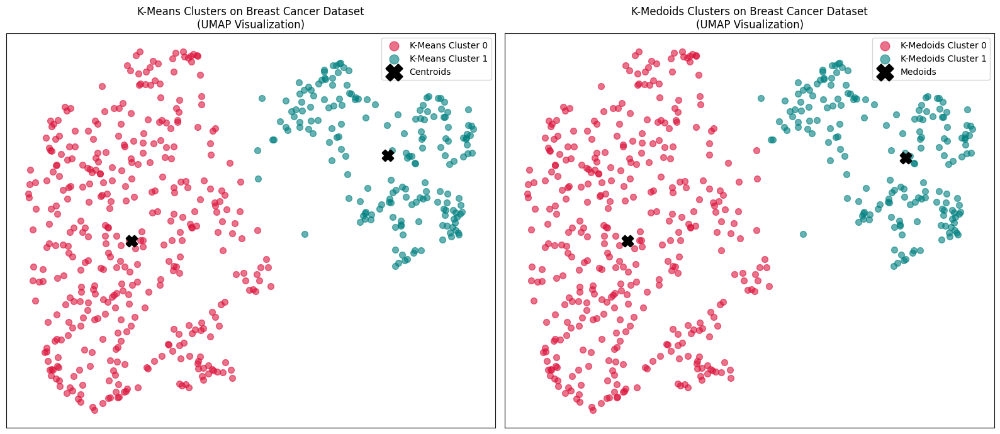

In [ ]:
# K-Means clustering on Umap reduced data
kmeans = KMeans(n_clusters=2, random_state=0)
kmeans.fit(X_umap)

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

# --- K-Means subplot ---
for i in range(2):
    idx = kmeans.labels_ == i
    axs[0].scatter(X_umap[idx, 0], X_umap[idx, 1], s=50, alpha=0.6, 
                   color=colors[i], label=f"K-Means Cluster {i}")

# Plot cluster centroids
centroids_umap = kmeans.cluster_centers_ #umap.transform(kmeans.cluster_centers_) # TODO remove this once decided if we continue with UMAP or not
axs[0].scatter(centroids_umap[:, 0], centroids_umap[:, 1], 
               c='black', marker='X', s=150, linewidth=2, label='Centroids')

axs[0].set_title('K-Means Clusters on Breast Cancer Dataset\n(UMAP Visualization)', fontsize=12)
axs[0].legend(markerscale=1.5)

# K-Medoids clustering
kmed = kmedoids.KMedoids(n_clusters=2, random_state=42)
euclidean_dist = pairwise_distances(X_umap, metric='euclidean')

kmed.fit(euclidean_dist)

# --- K-Medoids subplot ---
for i in range(2):
    idx = kmed.labels_ == i
    axs[1].scatter(X_umap[idx, 0], X_umap[idx, 1], s=50, alpha=0.6, 
                   color=colors[i], label=f"K-Medoids Cluster {i}")

# Plot medoids
medoids_umap = X_umap[kmed.medoid_indices_]
axs[1].scatter(medoids_umap[:, 0], medoids_umap[:, 1], 
               c='black', marker='X', s=150, linewidth=2, label='Medoids')

axs[1].set_title('K-Medoids Clusters on Breast Cancer Dataset\n(UMAP Visualization)', fontsize=12)
axs[1].legend(markerscale=1.5)

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### K-Means vs K-Medoids on Breast Cancer Dataset:

**Visual Results:**
- **Nearly identical clustering**: Both methods produce very similar cluster assignments with clear separation
- **Two distinct patient groups**: Red cluster (benign-like) and blue cluster (malignant-like) with minimal overlap
- **Robust performance**: Both algorithms successfully identify meaningful patterns in breast cancer diagnostic features

**Medical Dataset Application:**
- **K-Means**: Fast computation, good for large patient databases, but sensitive to extreme diagnostic values
- **K-Medoids**: More robust to outliers (unusual patient cases), uses actual patient profiles as cluster centers
- **Clinical Advantage**: K-medoids provides interpretable "representative patients" for each cluster, making it easier for clinicians to understand typical cases in each group
- **Recommendation**: K-medoids preferred for medical datasets due to outlier robustness and clinical interpretability

## Hierarchical Clustering

Next let's visualize the Dendogram using Ward's method and the resulting cluster if we set the cutoff at 2 clusters.

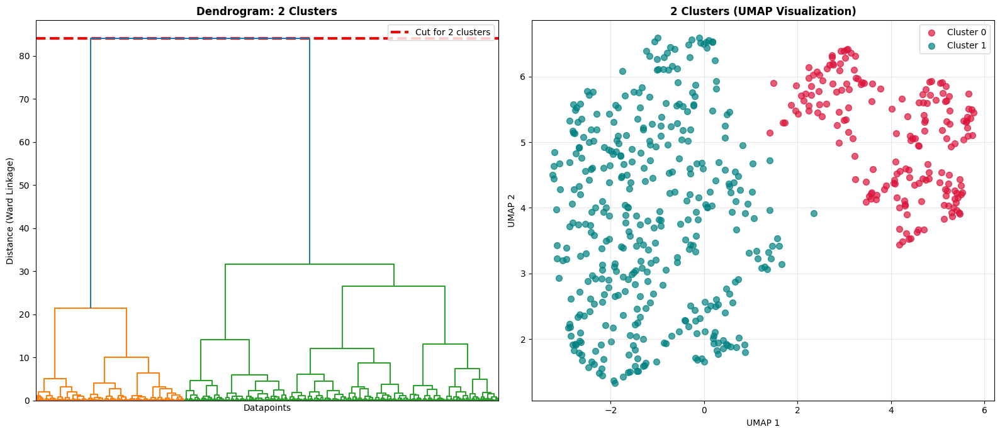

In [ ]:
# Create linkage matrix using Ward's method
linkage_matrix = linkage(X_umap, method='ward')

# Create figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Top row: Three dendrograms with different cluster cuts
n_clusters_list = [2]
colors_cuts = ['red']

ax = axes[0]

# Find the distance threshold for n_clusters
threshold = linkage_matrix[-1, 2]
ax.axhline(y=threshold, color=colors_cuts[0], linestyle='--', linewidth=3,
            label=f'Cut for 2 clusters')
        
# Create dendrogram
dend = dendrogram(linkage_matrix, 
                  #truncate_mode='level', 
                  p=10,
                  leaf_rotation=90,
                  leaf_font_size=8,
                  show_leaf_counts=False,
                  color_threshold=threshold,
                  #link_color_func=lambda k: colors[k] if k < len(colors) else 'black',
                  ax=ax)

ax.set_title(f'Dendrogram: 2 Clusters', fontsize=12, fontweight='bold')
ax.set_xlabel('Datapoints', fontsize=10)
ax.set_ylabel('Distance (Ward Linkage)', fontsize=10)
ax.legend(loc='upper right')

# Remove x-axis tick labels
ax.set_xticks([])

ax = axes[1]
    
# Get cluster labels for n_clusters
cluster_labels = fcluster(linkage_matrix, 2, criterion='maxclust') - 1

# Plot points colored by cluster
for cluster_id in range(2):
    mask = cluster_labels == cluster_id
    ax.scatter(X_umap[mask, 0], X_umap[mask, 1], 
              c=colors[cluster_id], s=50, alpha=0.7,
              label=f'Cluster {cluster_id}')

ax.set_title(f'2 Clusters (UMAP Visualization)', fontsize=12, fontweight='bold')
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Key Observations - Hierarchical Clustering on Breast Cancer Dataset:

- **Clear binary separation**: Dendrogram shows distinct cut at ~85 distance, creating two well-defined clusters
- **Medically meaningful**: Two clusters likely correspond to benign vs malignant breast cancer cases
- **Excellent separation**: UMAP visualization shows minimal overlap between red and teal clusters
- **Balanced clustering**: Both clusters contain substantial patient populations for meaningful analysis
- **Clinical relevance**: Hierarchical approach naturally identifies the primary diagnostic distinction in breast cancer data

## DBSCAN

Finally let's use DBSCAN again with different values for epsilon and MinPts!

TODO: Maybe add the K-Distance graph to figure out good values?

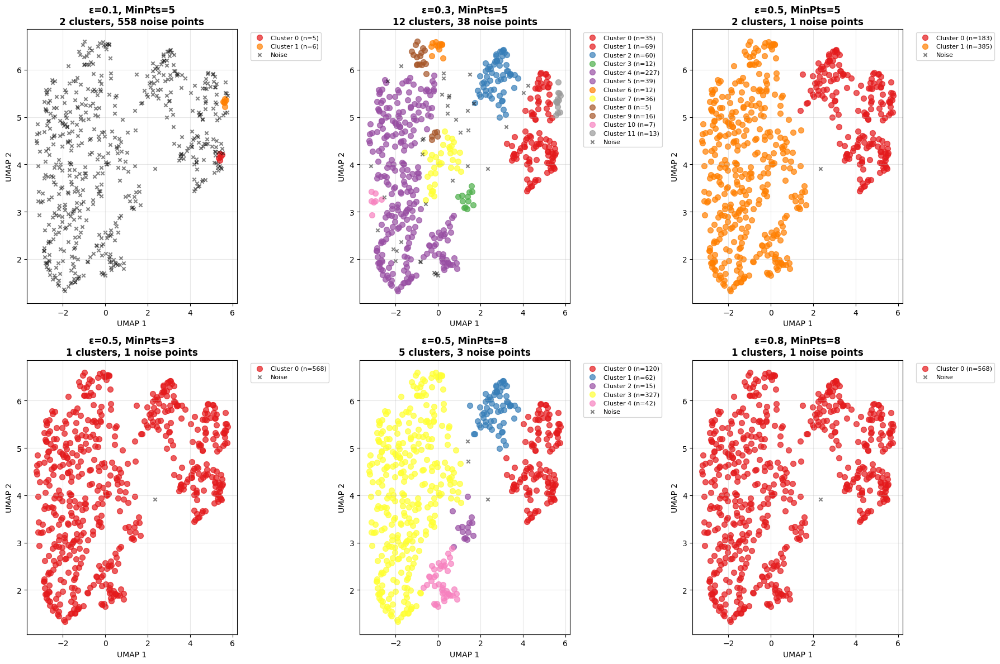

In [ ]:
# Parameter Sensitivity Analysis
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Different epsilon and MinPts combinations
param_combinations = [
    (0.1, 5, "ε=0.1, MinPts=5"),
    (0.3, 5, "ε=0.3, MinPts=5"), 
    (0.5, 5, "ε=0.5, MinPts=5"),
    (0.5, 3, "ε=0.5, MinPts=3"),
    (0.5, 8, "ε=0.5, MinPts=8"),
    (0.8, 8, "ε=0.8, MinPts=8")
]

for i, (eps, min_pts, title) in enumerate(param_combinations):
    # Run DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_pts)
    cluster_labels = dbscan.fit_predict(X_umap)
    
    # Count clusters and noise
    n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
    n_noise = list(cluster_labels).count(-1)
    
    # Plot results
    ax = axes[i]
    
    # Plot clusters
    unique_labels = set(cluster_labels)
    colors = plt.cm.Set1(np.linspace(0, 1, len(unique_labels)))
    
    for label, color in zip(unique_labels, colors):
        if label == -1:
            # Noise points in black
            mask = cluster_labels == label
            ax.scatter(X_umap[mask, 0], X_umap[mask, 1], 
                      c='black', s=20, alpha=0.5, marker='x', label='Noise')
        else:
            mask = cluster_labels == label
            cluster_size = np.sum(mask)
            ax.scatter(X_umap[mask, 0], X_umap[mask, 1], 
                      c=[color], s=50, alpha=0.7, 
                      label=f'Cluster {label} (n={cluster_size})')
    
    ax.set_title(f'{title}\n{n_clusters} clusters, {n_noise} noise points', 
                fontsize=12, fontweight='bold')
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Key Observations - DBSCAN on Breast Cancer Dataset:

**Parameter Sensitivity:**
- **ε=0.3-**: Too restrictive - creates too many clusters with 558 noise points (most patients unclassified)
- **ε=0.5**: Optimal balance - meaningful clusters with only a few noise points
- **ε=0.8+**: Too permissive - merges distinct patient groups into fewer clusters
- **MinPts**: has a large impact aswell, when we choose it too small (for instance 3), we merge clusters faster than we would like.

**Clinical Advantages:**
- **Noise detection**: Identifies outlier patients (gray X's) who don't fit typical patterns
- **Automatic cluster count**: No need to specify number of patient subgroups beforehand
- **Robust clustering**: Handles varying cluster densities in medical data
- **Clinical insight**: Noise points may represent rare cases or measurement errors requiring special attention

**Best Practice**: ε=0.5, MinPts=5 provides optimal patient stratification with minimal noise

## Introduction to the Wine Dataset

The **Wine Recognition dataset** is a classic dataset in machine learning, containing chemical analysis results of wines grown in the same region of Italy but derived from three different cultivars (grape varieties).

- **Samples:** 178 wine samples
- **Features:** 13 numeric features representing chemical properties (for example alcohol content, color intensity, flavanoids etc.)
- **Labels:** 
    - `0` = Class 0 wine (59 samples)
    - `1` = Class 1 wine (71 samples) 
    - `2` = Class 2 wine (48 samples)
- **Data type:** All features are continuous, numeric (floating-point)
- **No missing values:** The dataset is complete and ready for analysis
- **Why useful for clustering:** The three wine classes have distinct chemical profiles, making them ideal for demonstrating how clustering algorithms - discover natural groupings in data

The chemical analysis approach mirrors how we might cluster patients based on blood tests, metabolic panels, or other laboratory measurements in healthcare settings.

In [ ]:
# Load the dataset
wine_data = load_wine()
X = wine_data.data
y = wine_data.target
feature_names = wine_data.feature_names
target_names = wine_data.target_names

# Create a DataFrame for easier exploration
df = pd.DataFrame(X, columns=feature_names)
df['wine_class'] = y

df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,wine_class
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   alcohol                       178 non-null    float64
 1   malic_acid                    178 non-null    float64
 2   ash                           178 non-null    float64
 3   alcalinity_of_ash             178 non-null    float64
 4   magnesium                     178 non-null    float64
 5   total_phenols                 178 non-null    float64
 6   flavanoids                    178 non-null    float64
 7   nonflavanoid_phenols          178 non-null    float64
 8   proanthocyanins               178 non-null    float64
 9   color_intensity               178 non-null    float64
 10  hue                           178 non-null    float64
 11  od280/od315_of_diluted_wines  178 non-null    float64
 12  proline                       178 non-null    float64
 13  wine_

In [ ]:
df.describe().round(2)

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,wine_class
count,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00,178.00
mean,13.00,2.34,2.37,19.49,99.74,2.30,2.03,0.36,1.59,5.06,0.96,2.61,746.89,0.94
std,0.81,1.12,0.27,3.34,14.28,0.63,1.00,0.12,0.57,2.32,0.23,0.71,314.91,0.78
min,11.03,0.74,1.36,10.60,70.00,0.98,0.34,0.13,0.41,1.28,0.48,1.27,278.00,0.00
25%,12.36,1.60,2.21,17.20,88.00,1.74,1.20,0.27,1.25,3.22,0.78,1.94,500.50,0.00
50%,13.05,1.87,2.36,19.50,98.00,2.36,2.13,0.34,1.56,4.69,0.96,2.78,673.50,1.00
75%,13.68,3.08,2.56,21.50,107.00,2.80,2.88,0.44,1.95,6.20,1.12,3.17,985.00,2.00
max,14.83,5.80,3.23,30.00,162.00,3.88,5.08,0.66,3.58,13.00,1.71,4.00,1680.00,2.00


In [ ]:
# Missing values check
print("\nMissing Values:")
df.isnull().sum()


Missing Values:


alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
wine_class                      0
dtype: int64

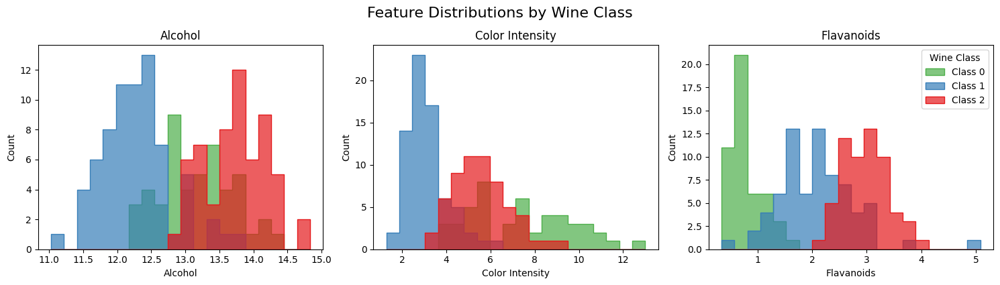

In [ ]:
# Create DataFrame for easier plotting
df = pd.DataFrame(X, columns=feature_names)
df['wine_class'] = y

# Visualize distributions of key features, colored by wine class
plt.figure(figsize=(15, 4))
for i, feat in enumerate(['alcohol', 'color_intensity', 'flavanoids']):
    plt.subplot(1, 3, i+1)
    sns.histplot(data=df, x=feat, hue='wine_class', palette='Set1', bins=20, alpha=0.7, 
                 legend=(i==2), element="step")
    plt.title(feat.replace('_', ' ').title())
    plt.xlabel(feat.replace('_', ' ').title())
    plt.ylabel('Count')
    if i == 2:
        plt.legend(labels=[f'Class {i}' for i in range(3)], title='Wine Class')
plt.tight_layout()
plt.suptitle("Feature Distributions by Wine Class", fontsize=16, y=1.05)
plt.show()

# Introduction

In [ ]:
# Create subplots to show progression of fit
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Linear Regression Fit Progression During Training', fontsize=16)

# Final RMSEs
y_pred_train_final = w0 + w1 * X_train_norm
y_pred_val_final = w0 + w1 * X_val_norm
y_pred_test_final = w0 + w1 * X_test_norm

rmse_train_final = np.sqrt(np.mean((y_pred_train_final - y_train) ** 2))
rmse_val_final = np.sqrt(np.mean((y_pred_val_final - y_val) ** 2))
rmse_test_final = np.sqrt(np.mean((y_pred_test_final - y_test) ** 2))

print(f"Final Train RMSE:      {rmse_train_final:.3f}")
print(f"Final Validation RMSE: {rmse_val_final:.3f}")
print(f"Final Test RMSE:       {rmse_test_final:.3f}")

# Define which iterations to show
iterations_to_show = [0, n_iter//2, n_iter-1]  # Beginning, middle, last iteration
iteration_labels = ['Beginning (Iteration 1)', f'Middle (Iteration {n_iter//2 + 1})', f'Final (Iteration {n_iter})']

# Plot training progression in first 3 subplots
for i, (iter_idx, label) in enumerate(zip(iterations_to_show, iteration_labels)):
    ax = axes[i//2, i%2]
    
    # Get parameters at this iteration
    w0_iter = w0_history[iter_idx]
    w1_iter = w1_history[iter_idx]
    
    # Make predictions with parameters from this iteration
    y_pred_iter = w0_iter + w1_iter * X_train_norm
    rmse_iter = np.sqrt(np.mean((y_pred_iter - y_train) ** 2))
    
    # Plot data points and regression line
    ax.scatter(X_train_norm, y_train, alpha=0.6, color='blue', s=30)
    ax.plot(X_train_norm, y_pred_iter, color='red', linewidth=2, 
            label=f'Linear Fit (RMSE: {rmse_iter:.2f})')
    
    ax.set_title(f'{label} - Training Data', fontsize=12)
    ax.set_xlabel('Therapy Duration (normalized)')
    ax.set_ylabel('Cognitive Score After')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Plot final model performance on test set in 4th subplot
ax = axes[1, 1]
ax.scatter(X_test_norm, y_test, alpha=0.6, color='green', s=30)
ax.plot(X_test_norm, y_pred_test_final, color='red', linewidth=2, 
        label=f'Linear Fit (RMSE: {rmse_test_final:.2f})')

ax.set_title('Final Model - Test Data', fontsize=12)
ax.set_xlabel('Therapy Duration (normalized)')
ax.set_ylabel('Cognitive Score After')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()